In [1]:
import pandas as pd
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
%matplotlib inline
import seaborn as sns
import pandas as pd
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [7]:
df=pd.read_csv('file:///C:/Users/Md%20Asif%20Ikbal/Downloads/airline_clnd.csv')
df.head()

,SR,id,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,...,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


In [8]:
df.shape

(103904, 25)

In [9]:
df.isnull().sum()

SR                                     0
id                                     0
Gender                                 0
Customer_Type                          0
Age                                    0
Type_of_Travel                         0
Class                                  0
Flight_Distance                        0
Inflight_wifi_service                  0
Departure/Arrival_time_convenient      0
Ease_of_Online_booking                 0
Gate_location                          0
Food_and_drink                         0
Online_boarding                        0
Seat_comfort                           0
Inflight_entertainment                 0
On-board_service                       0
Leg_room_service                       0
Baggage_handling                       0
Checkin_service                        0
Inflight_service                       0
Cleanliness                            0
Departure_Delay_in_Minutes             0
Arrival_Delay_in_Minutes             310
satisfaction    

In [10]:
df=df.fillna(0)

In [11]:
df.isnull().sum()

SR                                   0
id                                   0
Gender                               0
Customer_Type                        0
Age                                  0
Type_of_Travel                       0
Class                                0
Flight_Distance                      0
Inflight_wifi_service                0
Departure/Arrival_time_convenient    0
Ease_of_Online_booking               0
Gate_location                        0
Food_and_drink                       0
Online_boarding                      0
Seat_comfort                         0
Inflight_entertainment               0
On-board_service                     0
Leg_room_service                     0
Baggage_handling                     0
Checkin_service                      0
Inflight_service                     0
Cleanliness                          0
Departure_Delay_in_Minutes           0
Arrival_Delay_in_Minutes             0
satisfaction                         0
dtype: int64

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 25 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   SR                                 103904 non-null  int64  
 1   id                                 103904 non-null  int64  
 2   Gender                             103904 non-null  object 
 3   Customer_Type                      103904 non-null  object 
 4   Age                                103904 non-null  int64  
 5   Type_of_Travel                     103904 non-null  object 
 6   Class                              103904 non-null  object 
 7   Flight_Distance                    103904 non-null  int64  
 8   Inflight_wifi_service              103904 non-null  int64  
 9   Departure/Arrival_time_convenient  103904 non-null  int64  
 10  Ease_of_Online_booking             103904 non-null  int64  
 11  Gate_location                      1039

In [14]:
df.dtypes

SR                                     int64
id                                     int64
Gender                                object
Customer_Type                         object
Age                                    int64
Type_of_Travel                        object
Class                                 object
Flight_Distance                        int64
Inflight_wifi_service                  int64
Departure/Arrival_time_convenient      int64
Ease_of_Online_booking                 int64
Gate_location                          int64
Food_and_drink                         int64
Online_boarding                        int64
Seat_comfort                           int64
Inflight_entertainment                 int64
On-board_service                       int64
Leg_room_service                       int64
Baggage_handling                       int64
Checkin_service                        int64
Inflight_service                       int64
Cleanliness                            int64
Departure_

In [15]:
df.describe()

,SR,id,Age,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,Gate_location,Food_and_drink,Online_boarding,Seat_comfort,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes
count,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000
mean,51951.500000,64924.210502,39.379706,1189.448375,2.729683,3.060296,2.756901,2.976883,3.202129,3.250375,3.439396,3.358158,3.382363,3.351055,3.631833,3.304290,3.640428,3.286351,14.815618,15.133392
std,29994.645522,37463.812252,15.114964,997.147281,1.327829,1.525075,1.398929,1.277621,1.329533,1.349509,1.319088,1.332991,1.288354,1.315605,1.180903,1.265396,1.175663,1.312273,38.230901,38.649776
min,0.000000,1.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,25975.750000,32533.750000,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,51951.500000,64856.500000,40.000000,843.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,77927.250000,97368.250000,51.000000,1743.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,103903.000000,129880.000000,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


In [16]:
df.corr().describe().T

,count,mean,std,min,25%,50%,75%,max
SR,20.0,0.050736,0.223447,-0.004321,-0.000232,0.000776,0.002843,1.0
id,20.0,0.076258,0.220706,-0.036997,0.000646,0.023911,0.060343,1.0
Age,20.0,0.087166,0.223682,-0.049427,0.003257,0.030162,0.062307,1.0
Flight_Distance,20.0,0.117170,0.216582,-0.020043,0.006547,0.069394,0.114330,1.0
Inflight_wifi_service,20.0,0.198681,0.264415,-0.021276,0.015177,0.122079,0.241053,1.0
Departure/Arrival_time_convenient,20.0,0.132913,0.249737,-0.020043,0.000939,0.026209,0.078321,1.0
Ease_of_Online_booking,20.0,0.173226,0.281207,-0.007947,0.015675,0.037017,0.181720,1.0
Gate_location,20.0,0.109822,0.259785,-0.035427,-0.001201,0.002915,0.005251,1.0
Food_and_drink,20.0,0.176187,0.292347,-0.032466,0.003946,0.034369,0.159655,1.0
Online_boarding,20.0,0.214263,0.237214,-0.021874,0.066458,0.179952,0.296679,1.0


In [17]:
df.mean()

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  """Entry point for launching an IPython kernel.


SR                                   51951.500000
id                                   64924.210502
Age                                     39.379706
Flight_Distance                       1189.448375
Inflight_wifi_service                    2.729683
Departure/Arrival_time_convenient        3.060296
Ease_of_Online_booking                   2.756901
Gate_location                            2.976883
Food_and_drink                           3.202129
Online_boarding                          3.250375
Seat_comfort                             3.439396
Inflight_entertainment                   3.358158
On-board_service                         3.382363
Leg_room_service                         3.351055
Baggage_handling                         3.631833
Checkin_service                          3.304290
Inflight_service                         3.640428
Cleanliness                              3.286351
Departure_Delay_in_Minutes              14.815618
Arrival_Delay_in_Minutes                15.133392


In [18]:
df.max()

SR                                              103903
id                                              129880
Gender                                            Male
Customer_Type                        disloyal Customer
Age                                                 85
Type_of_Travel                         Personal Travel
Class                                         Eco Plus
Flight_Distance                                   4983
Inflight_wifi_service                                5
Departure/Arrival_time_convenient                    5
Ease_of_Online_booking                               5
Gate_location                                        5
Food_and_drink                                       5
Online_boarding                                      5
Seat_comfort                                         5
Inflight_entertainment                               5
On-board_service                                     5
Leg_room_service                                     5
Baggage_ha

In [19]:
df.mean()

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  """Entry point for launching an IPython kernel.


SR                                   51951.500000
id                                   64924.210502
Age                                     39.379706
Flight_Distance                       1189.448375
Inflight_wifi_service                    2.729683
Departure/Arrival_time_convenient        3.060296
Ease_of_Online_booking                   2.756901
Gate_location                            2.976883
Food_and_drink                           3.202129
Online_boarding                          3.250375
Seat_comfort                             3.439396
Inflight_entertainment                   3.358158
On-board_service                         3.382363
Leg_room_service                         3.351055
Baggage_handling                         3.631833
Checkin_service                          3.304290
Inflight_service                         3.640428
Cleanliness                              3.286351
Departure_Delay_in_Minutes              14.815618
Arrival_Delay_in_Minutes                15.133392


In [20]:
for i  in df.columns:
    print(f'unique values in column "{i}" is\n {df[i].value_counts()}')
    print('-------------------------------------------------')

unique values in column "SR" is
 0         1
69266     1
69276     1
69275     1
69274     1
         ..
34631     1
34630     1
34629     1
34628     1
103903    1
Name: SR, Length: 103904, dtype: int64
-------------------------------------------------
unique values in column "id" is
 70172     1
116739    1
6259      1
17470     1
118574    1
         ..
107167    1
103283    1
112365    1
98359     1
62567     1
Name: id, Length: 103904, dtype: int64
-------------------------------------------------
unique values in column "Gender" is
 Female    52727
Male      51177
Name: Gender, dtype: int64
-------------------------------------------------
unique values in column "Customer_Type" is
 Loyal Customer       84923
disloyal Customer    18981
Name: Customer_Type, dtype: int64
-------------------------------------------------
unique values in column "Age" is
 39    2969
25    2798
40    2574
44    2482
42    2457
      ... 
74      47
76      45
79      42
78      33
85      17
Name: Age

In [21]:
df.head()

,SR,id,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,...,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


In [22]:
df.columns

Index(['SR', 'id', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',
       'satisfaction'],
      dtype='object')

In [23]:
from sklearn.preprocessing import LabelEncoder

In [26]:
le=LabelEncoder()

In [27]:
df_col=('Gender','Customer_Type','Type_of_Travel','Class','satisfaction')

In [28]:
for i in df_col:
    df[i]=le.fit_transform(df[i])

In [29]:
df.head()

,SR,id,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,...,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction
0,0,70172,1,0,13,1,2,460,3,4,...,5,4,3,4,4,5,5,25,18.0,0
1,1,5047,1,1,25,0,0,235,3,2,...,1,1,5,3,1,4,1,1,6.0,0
2,2,110028,0,0,26,0,0,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,1
3,3,24026,0,0,25,0,0,562,2,5,...,2,2,5,3,1,4,2,11,9.0,0
4,4,119299,1,0,61,0,0,214,3,3,...,3,3,4,4,3,3,3,0,0.0,1


In [30]:
df.head().T

,0,1,2,3,4
SR,0.0,1.0,2.0,3.0,4.0
id,70172.0,5047.0,110028.0,24026.0,119299.0
Gender,1.0,1.0,0.0,0.0,1.0
Customer_Type,0.0,1.0,0.0,0.0,0.0
Age,13.0,25.0,26.0,25.0,61.0
Type_of_Travel,1.0,0.0,0.0,0.0,0.0
Class,2.0,0.0,0.0,0.0,0.0
Flight_Distance,460.0,235.0,1142.0,562.0,214.0
Inflight_wifi_service,3.0,3.0,2.0,2.0,3.0
Departure/Arrival_time_convenient,4.0,2.0,2.0,5.0,3.0


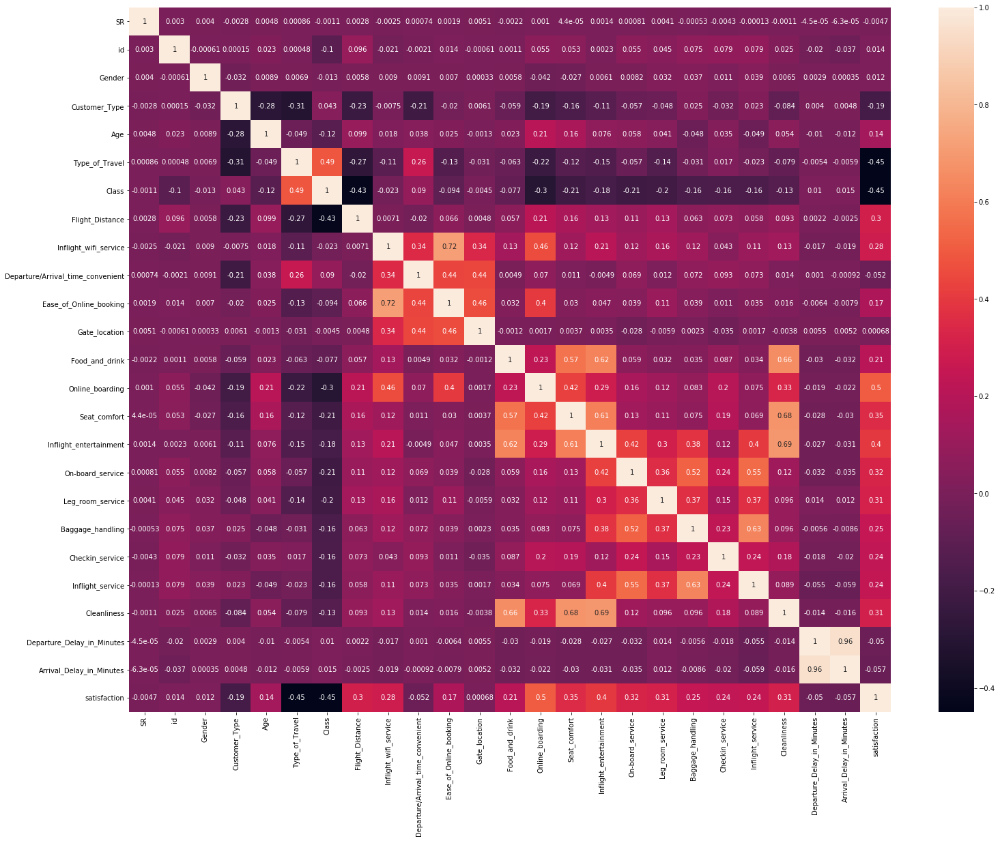

In [33]:
plt.figure(figsize=(25,19))
sns.heatmap(df.corr(),annot=True)

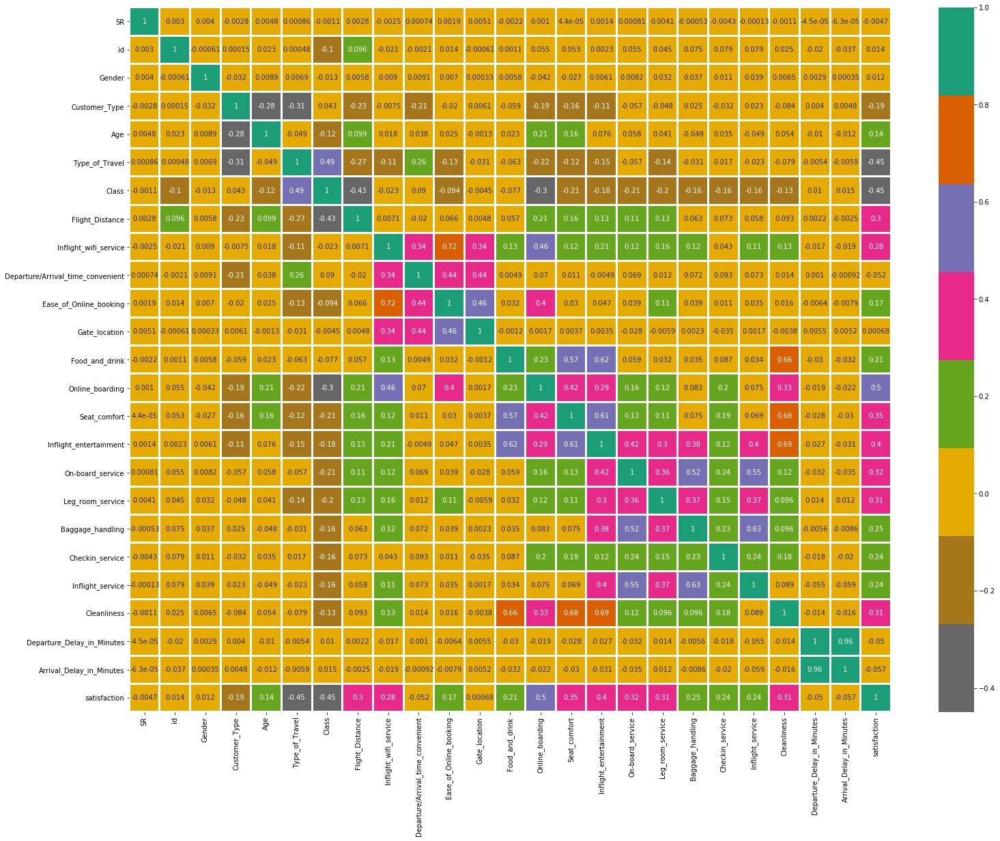

In [35]:
plt.figure(figsize=(25,19))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(df.corr(),annot=True,cmap='Dark2_r',linewidths=2)
plt.show()

In [37]:
df.columns

Index(['SR', 'id', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',
       'satisfaction'],
      dtype='object')

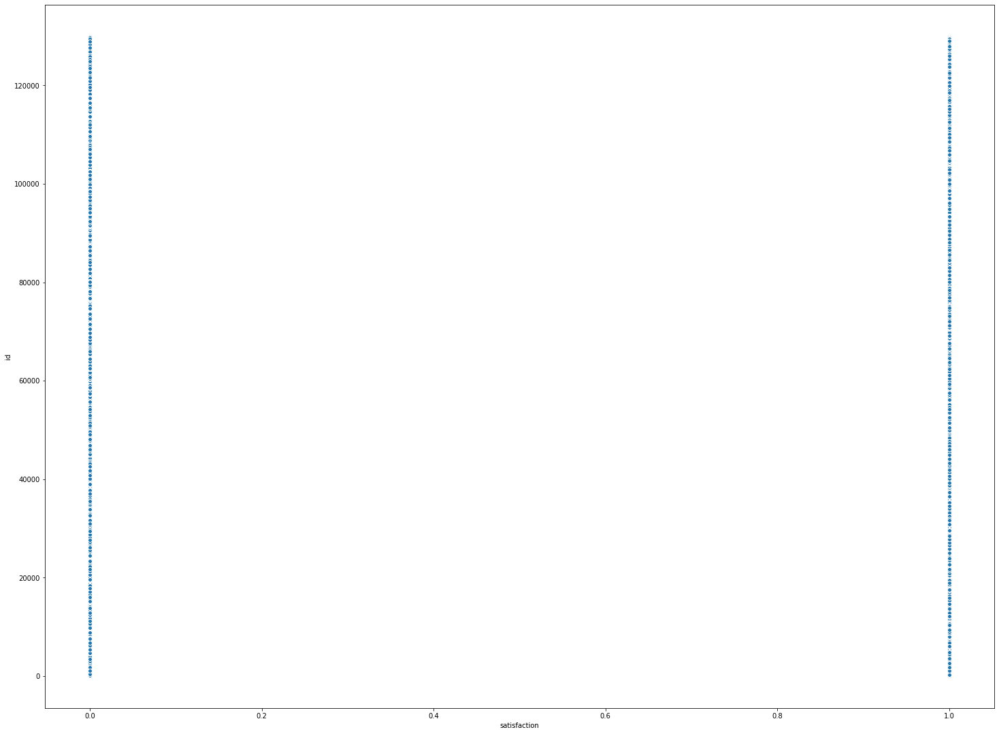

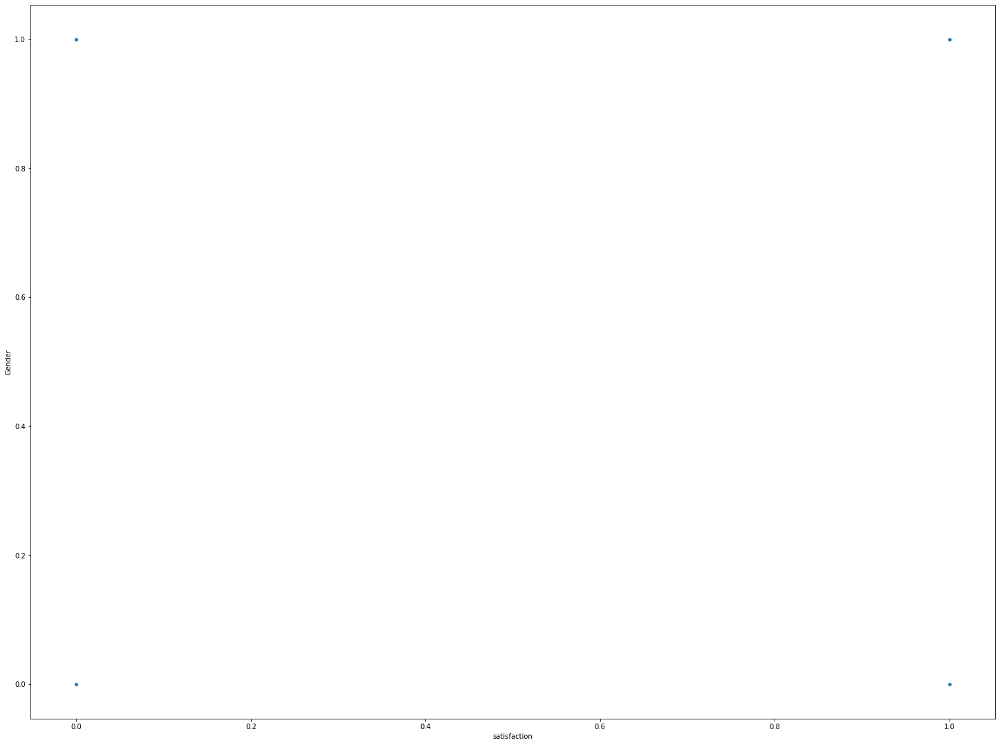

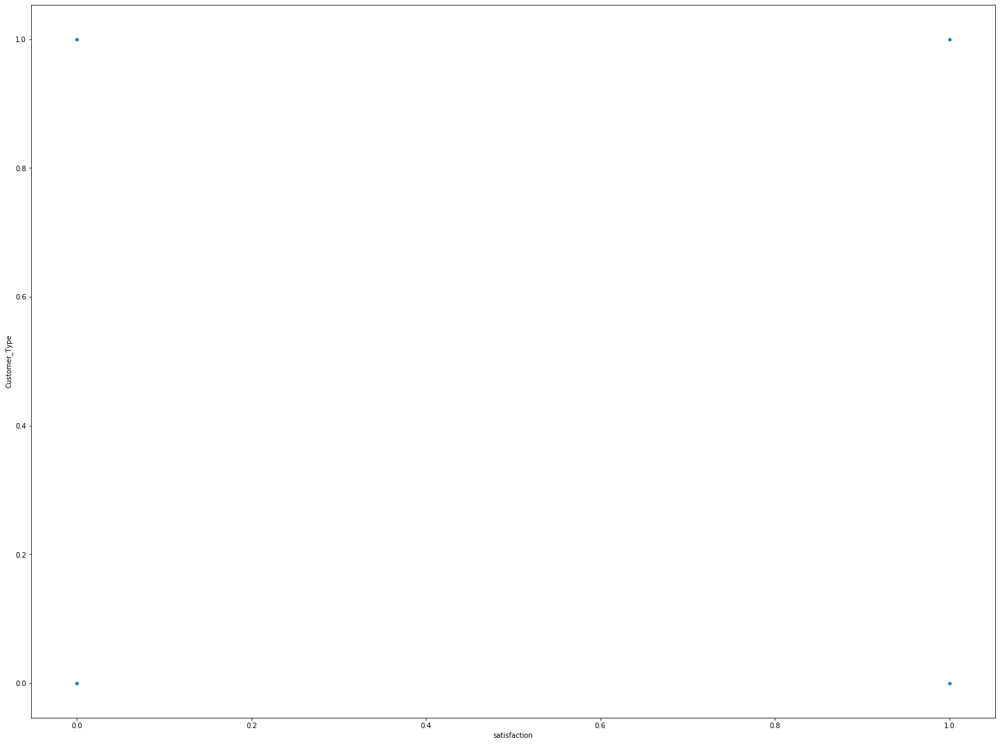

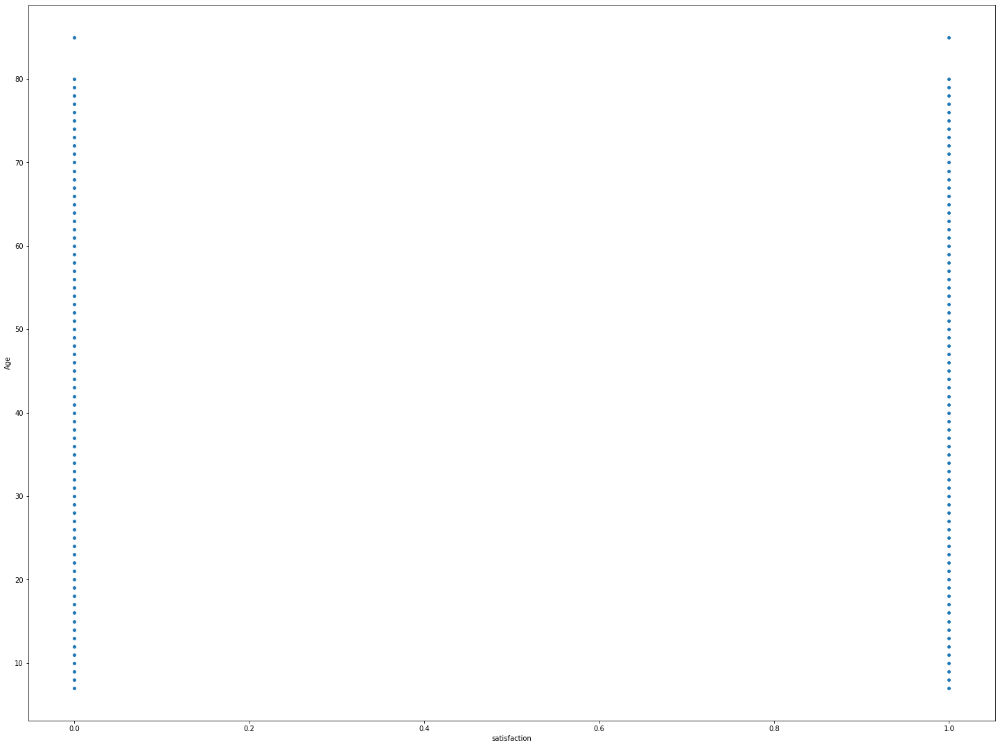

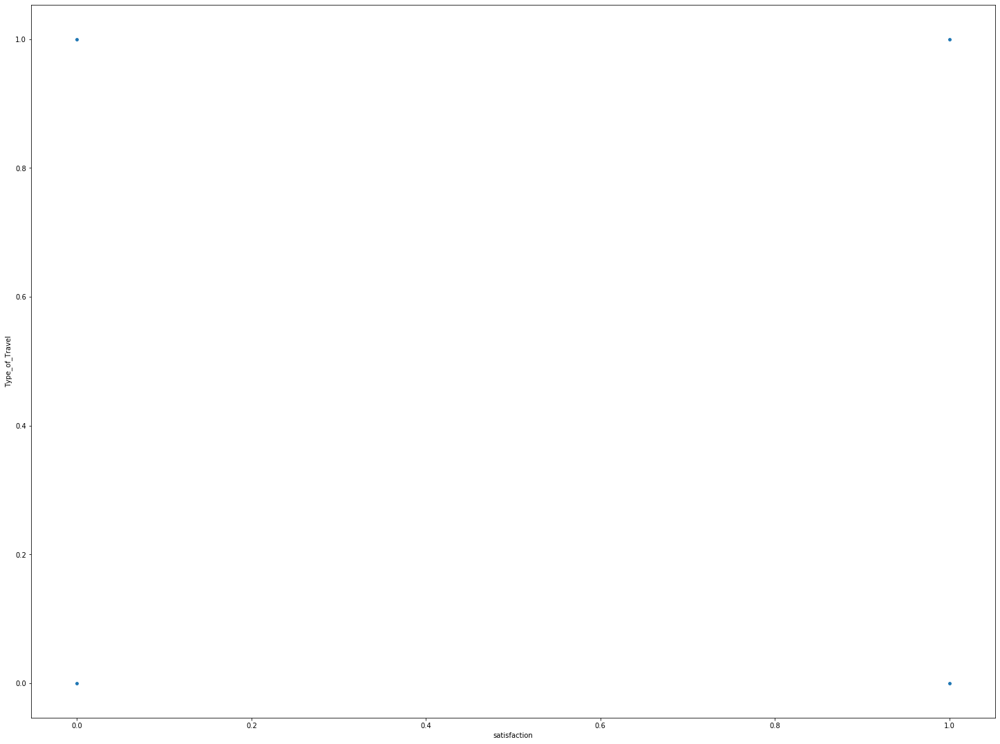

...

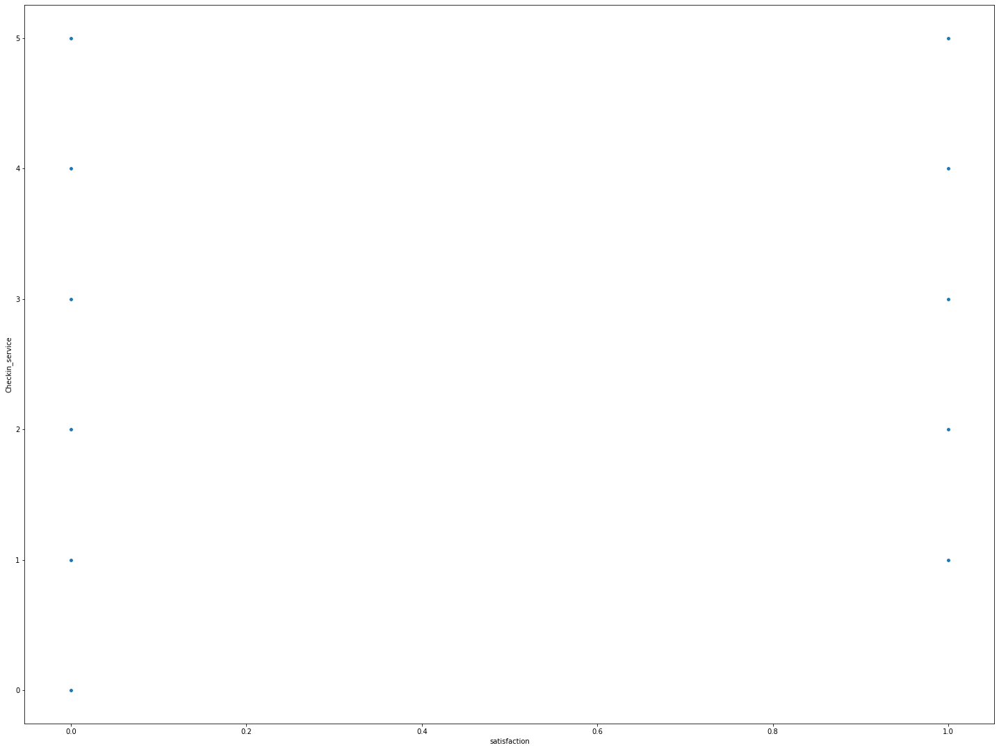

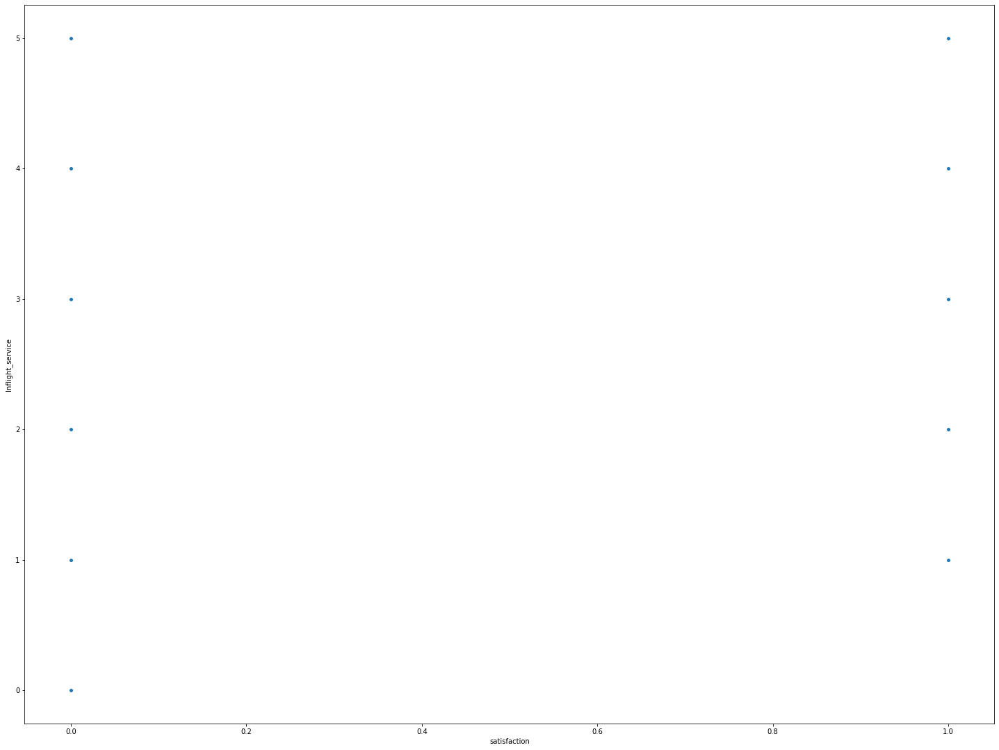

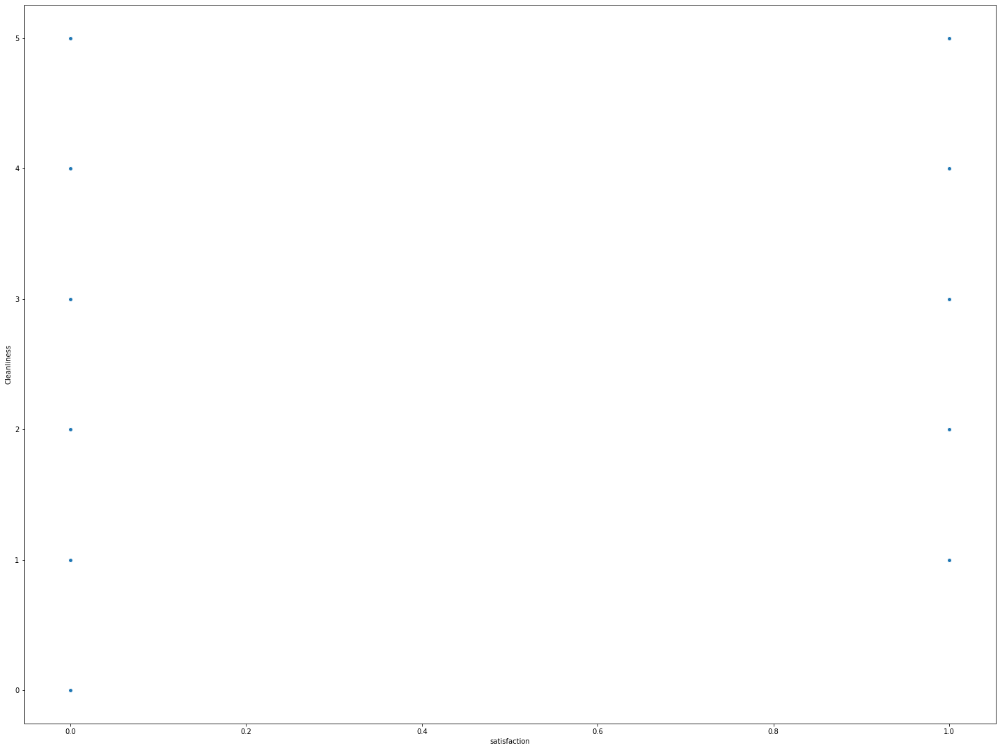

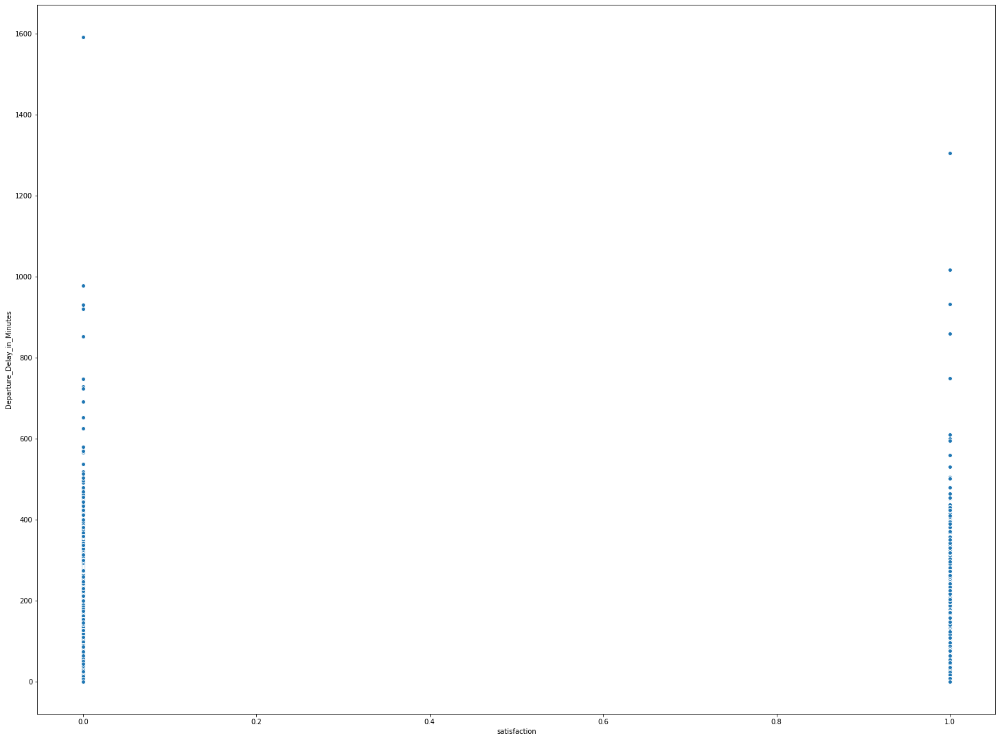

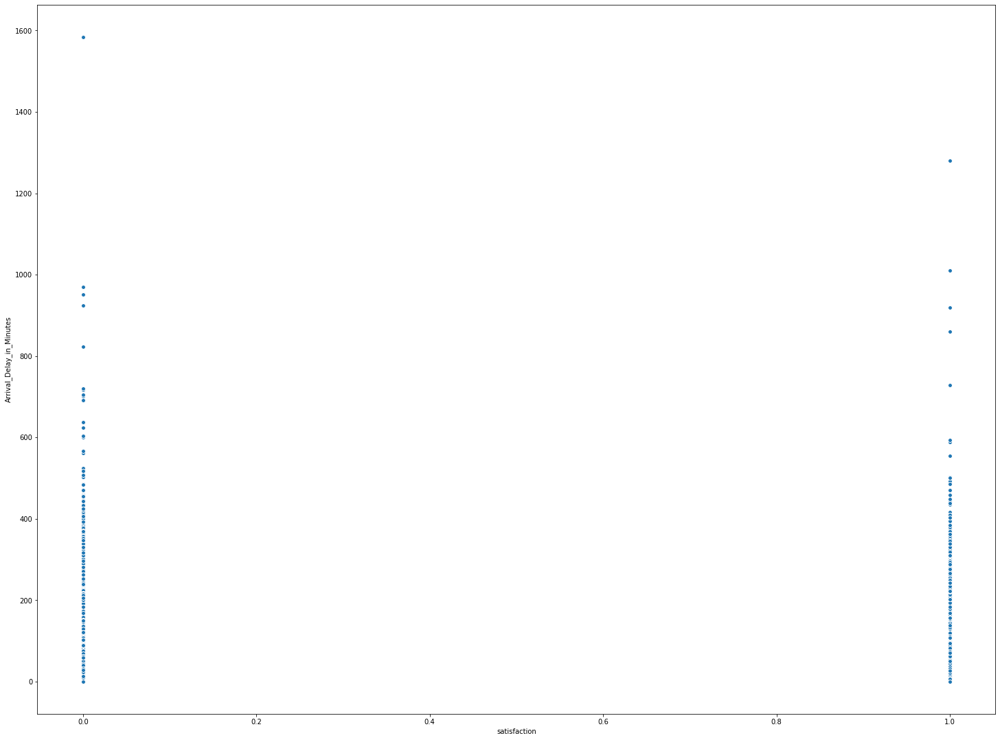

In [38]:
for i in [ 'id', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']:
    plt.figure(figsize=(25,19))
    sns.scatterplot(x=df.satisfaction,y=df[i],data=df,linewidth=1)
    plt.show()

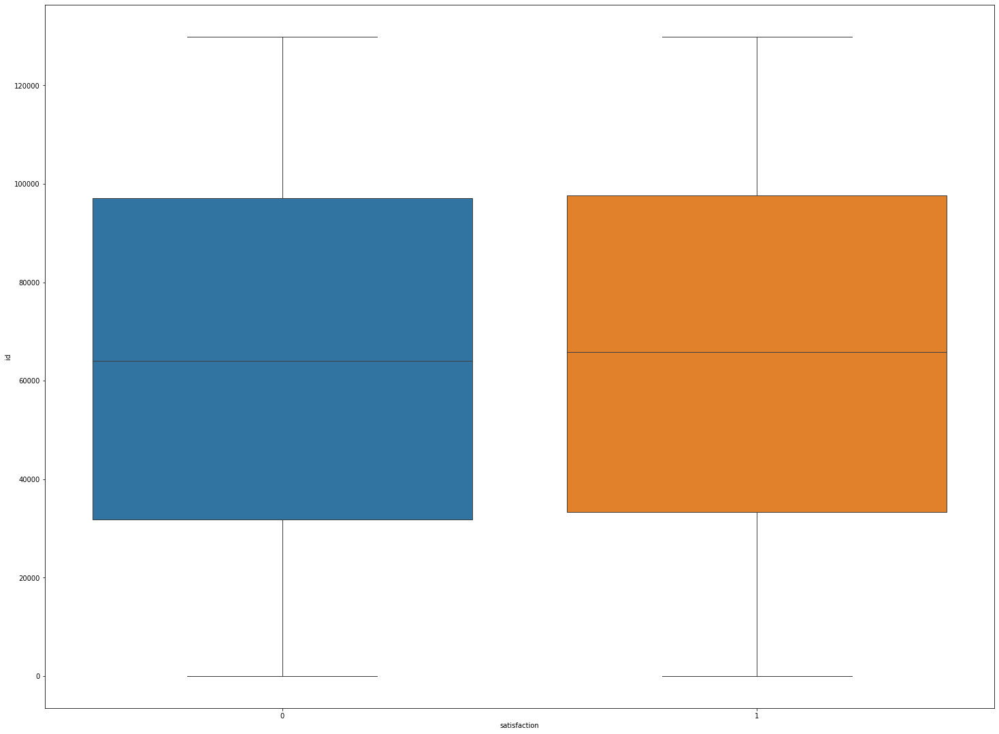

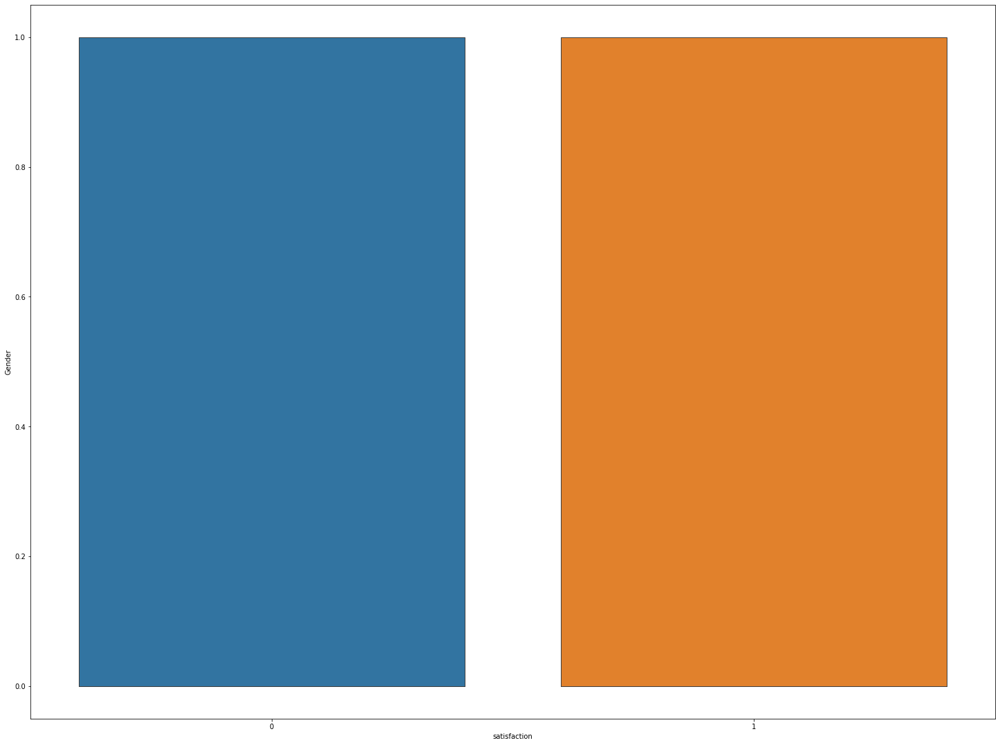

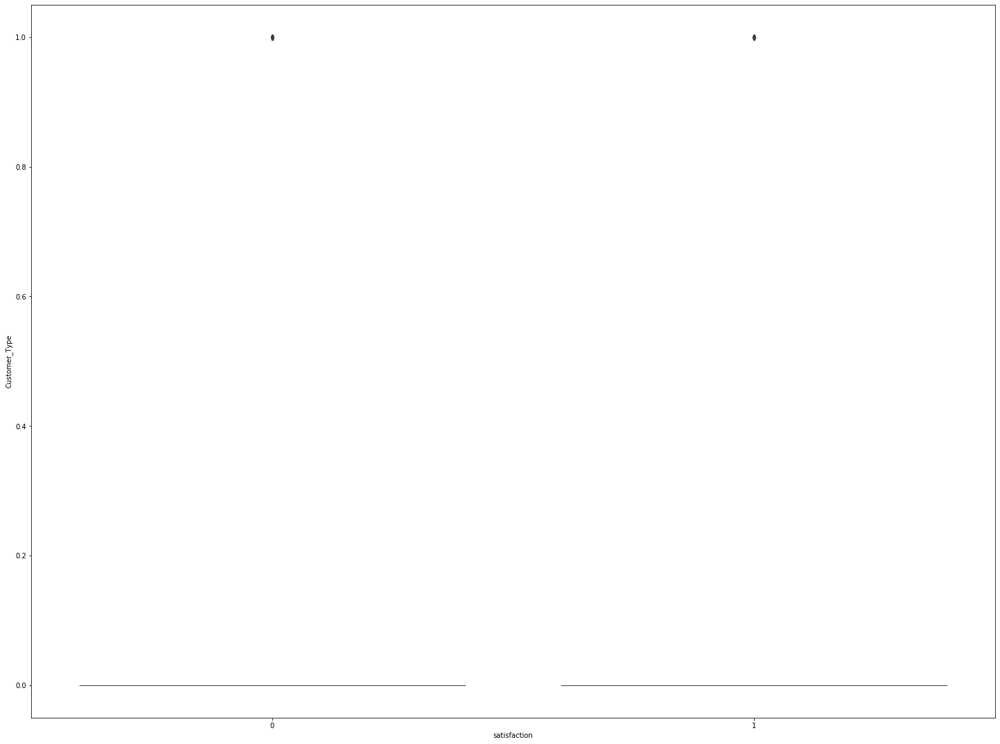

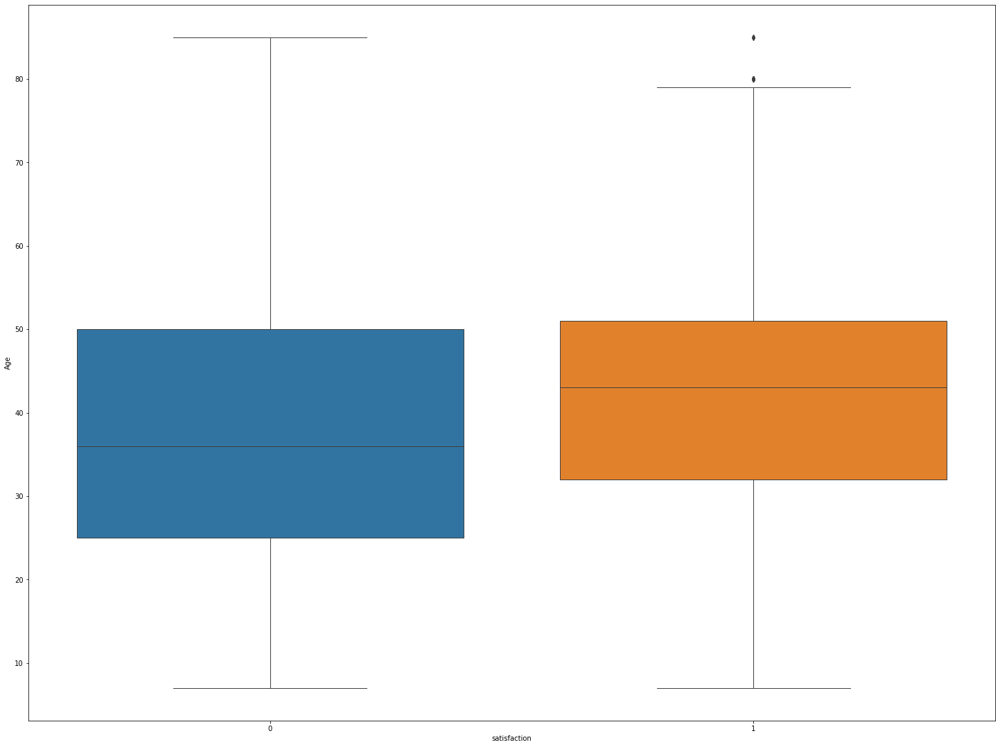

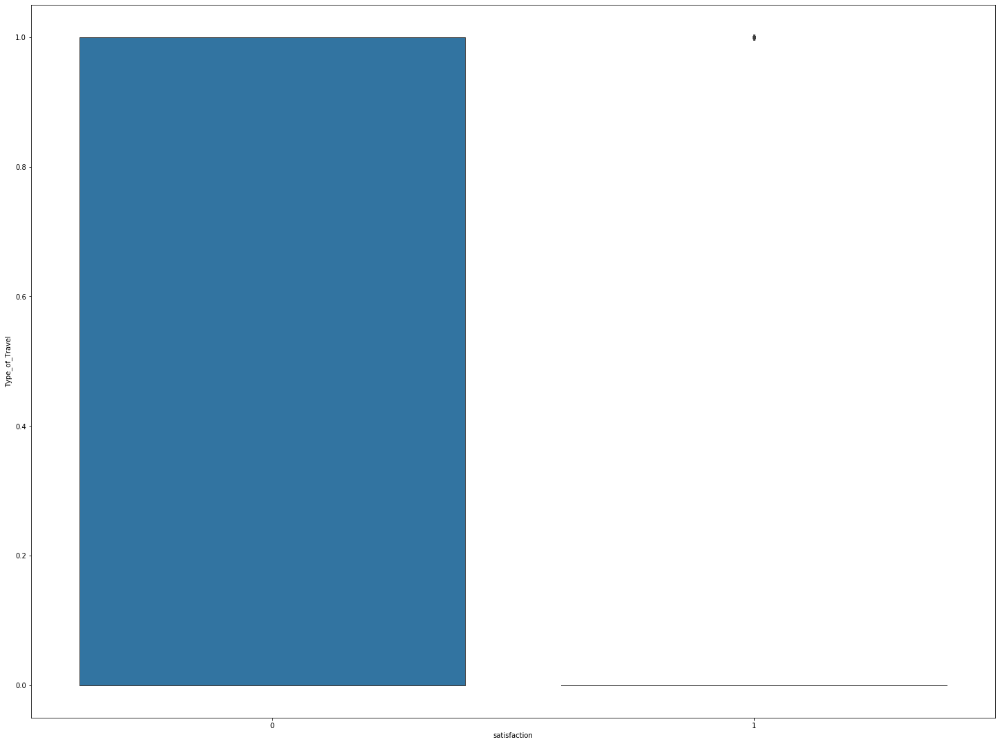

...

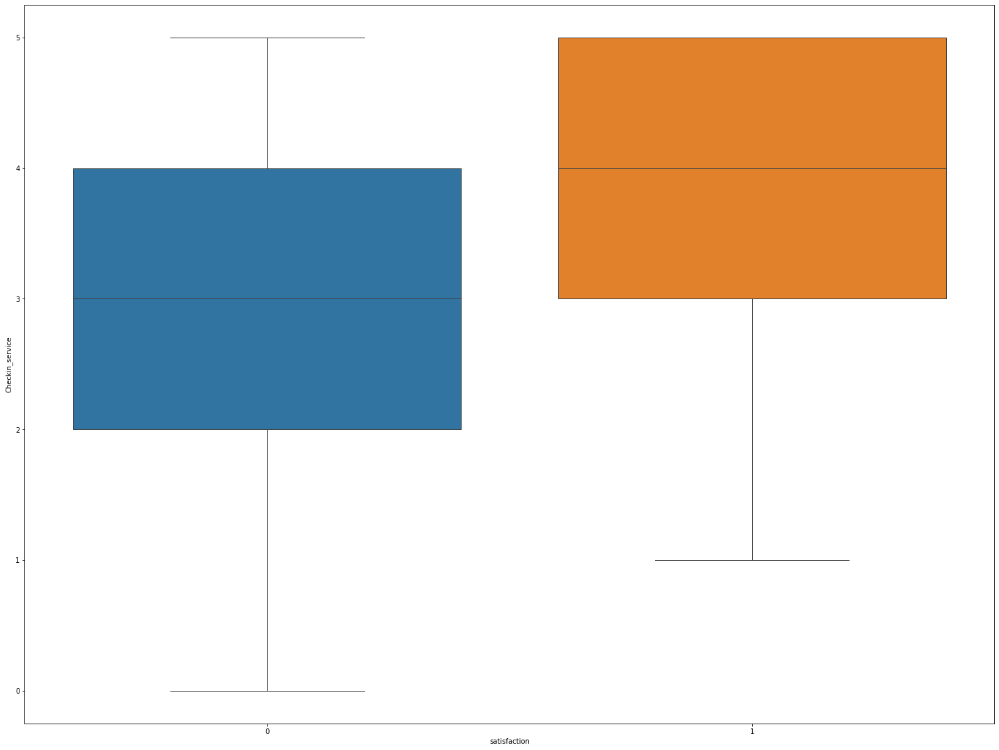

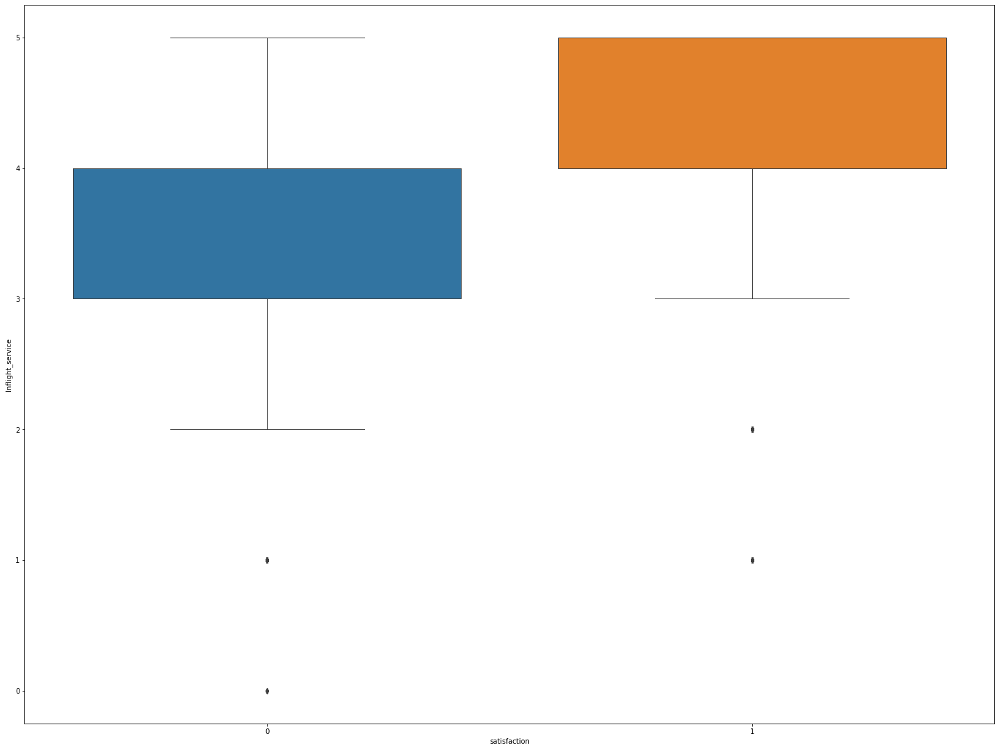

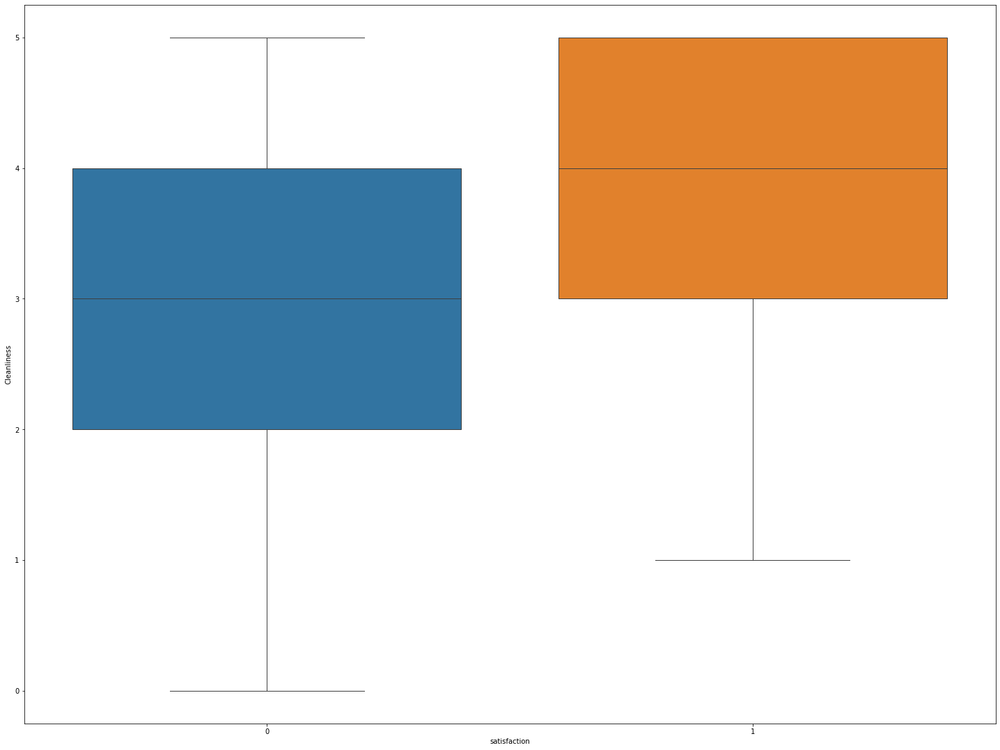

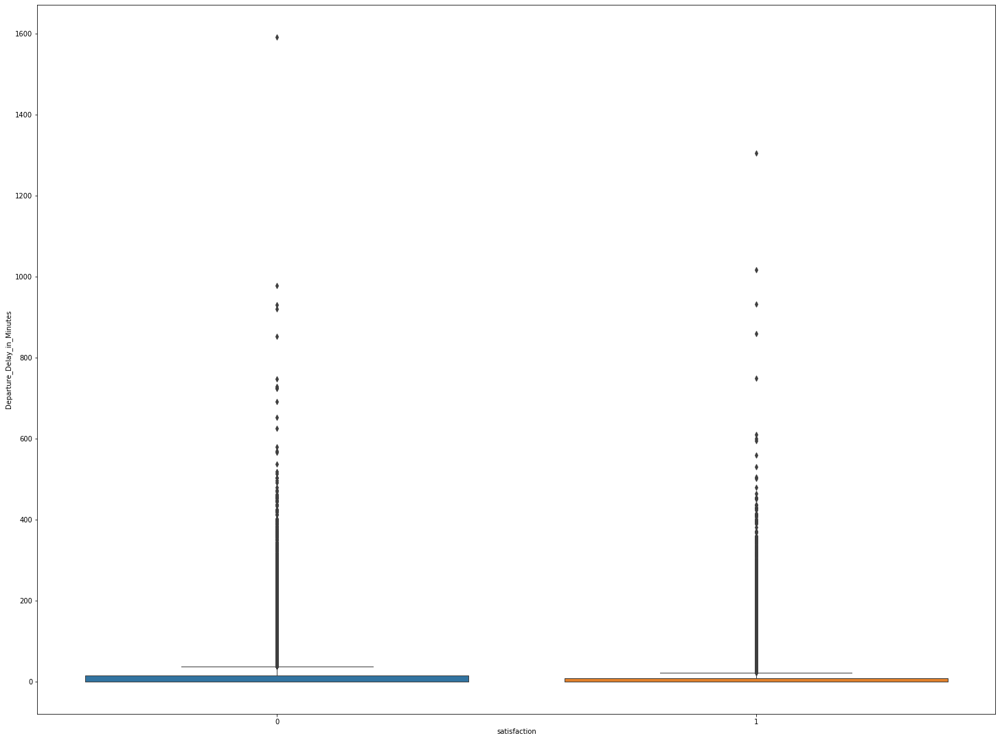

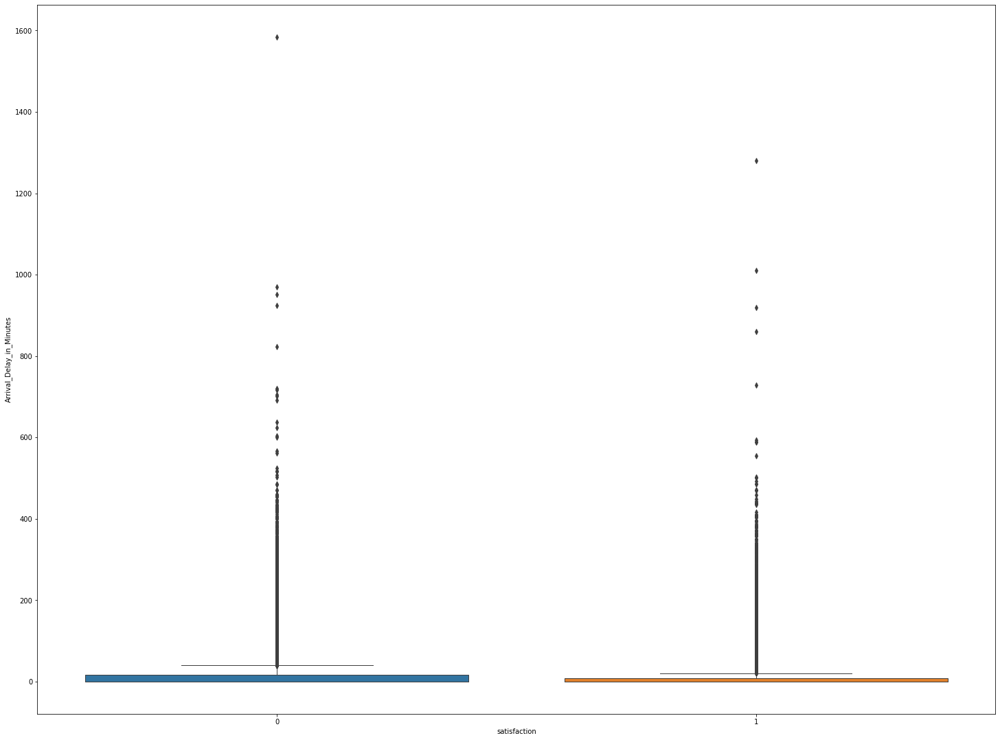

In [39]:
for i in [ 'id', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']:
    plt.figure(figsize=(25,19))
    sns.boxplot(x=df.satisfaction,y=df[i],data=df,linewidth=1)
    plt.show()

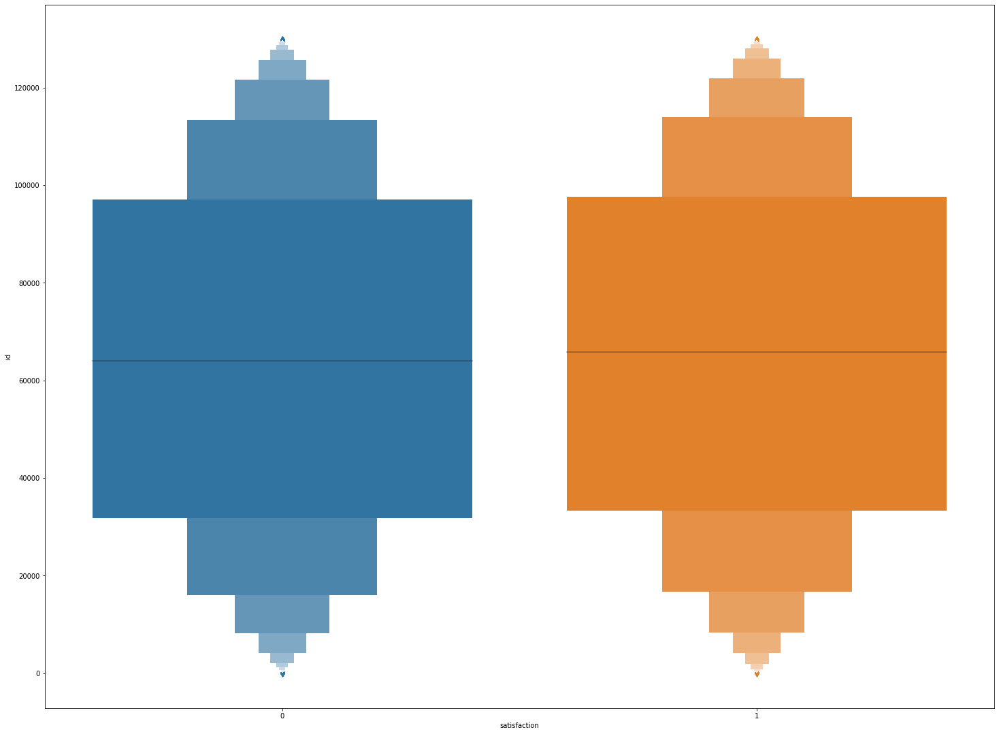

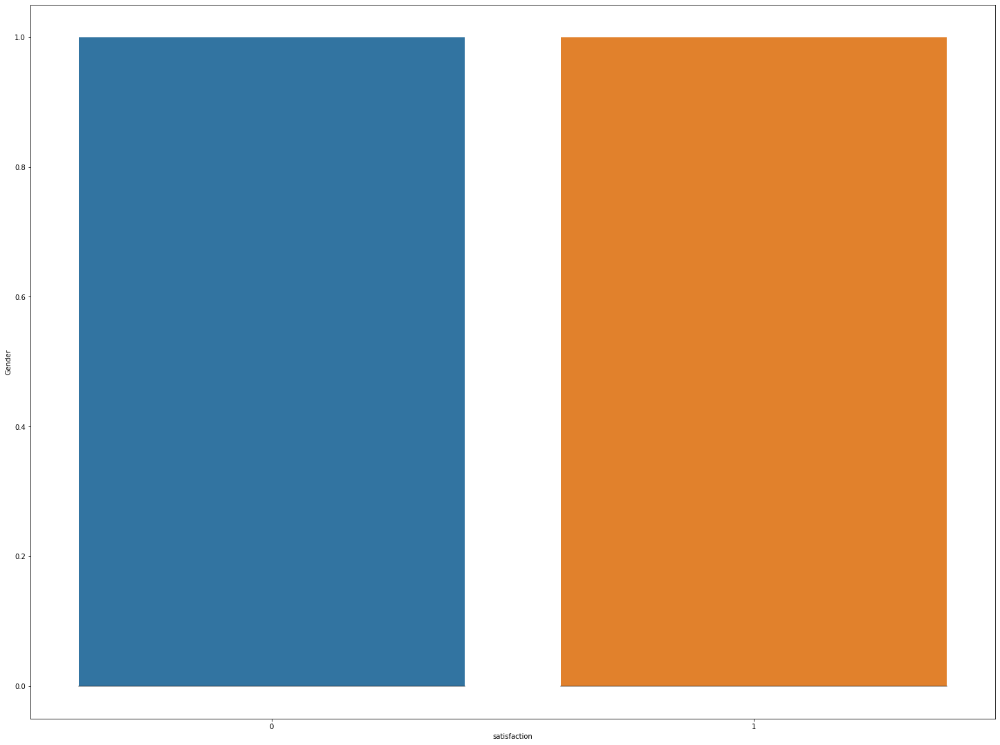

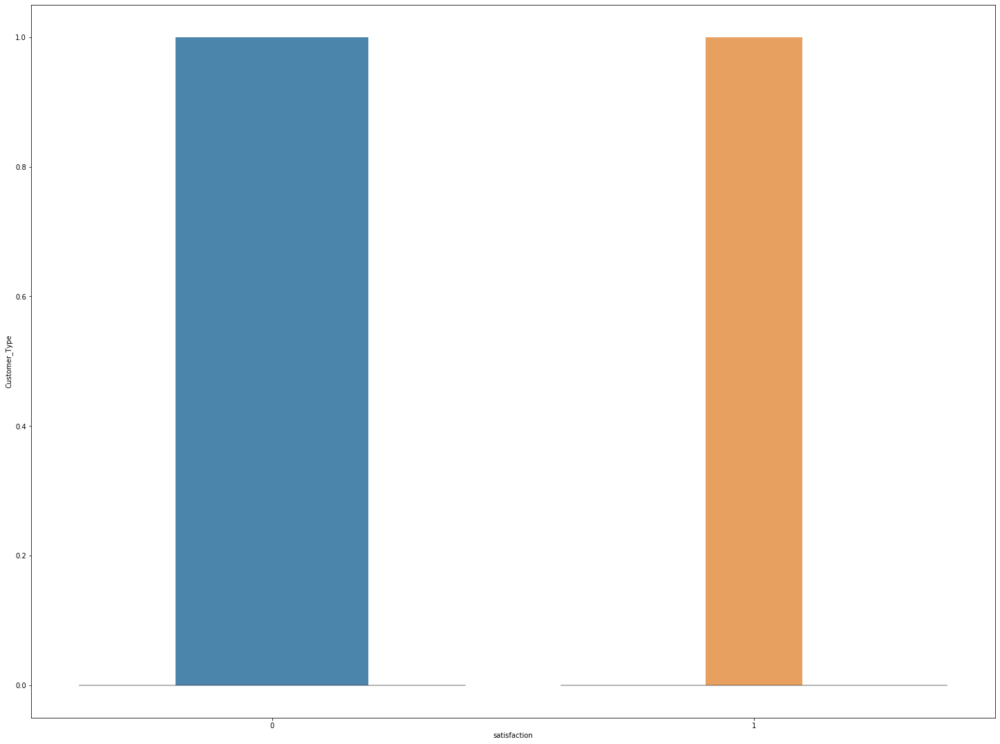

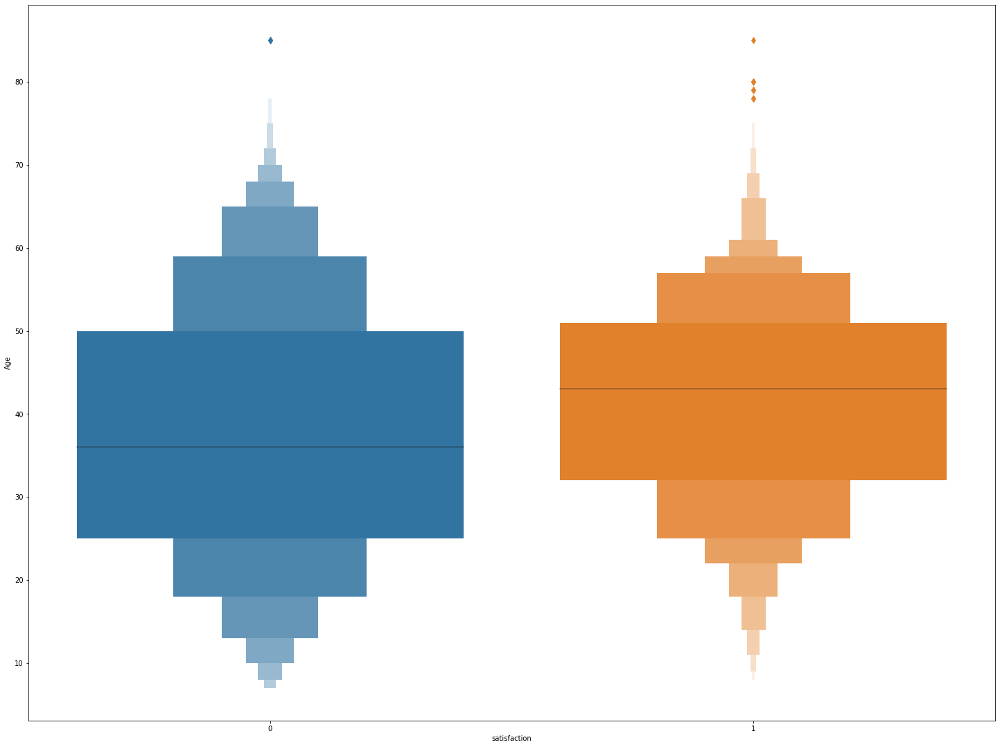

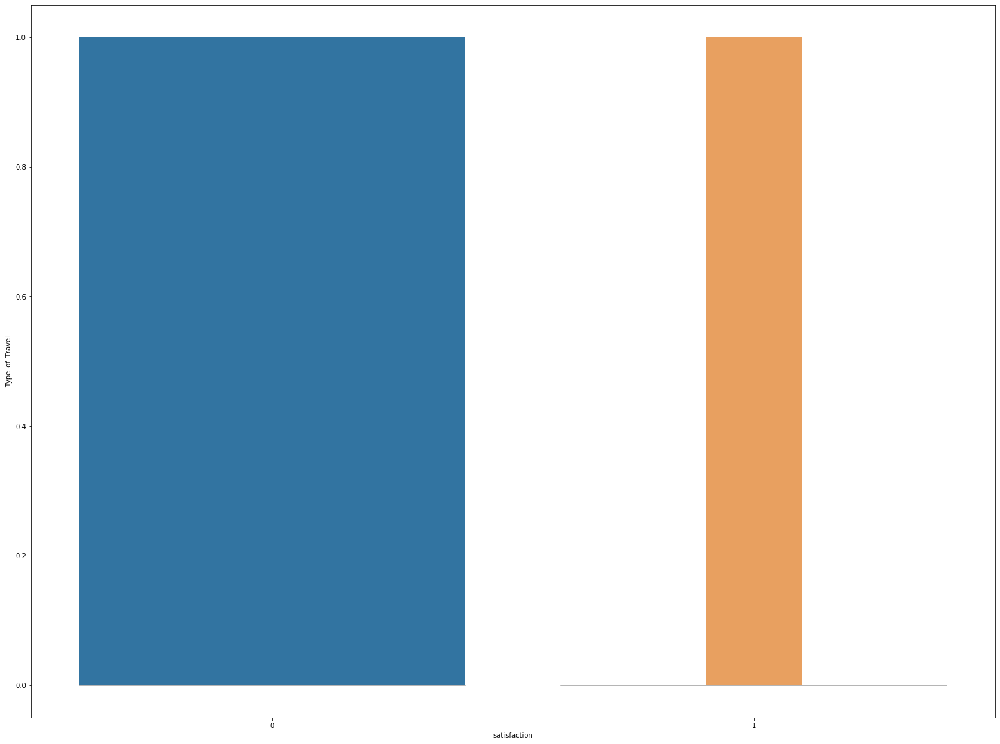

...

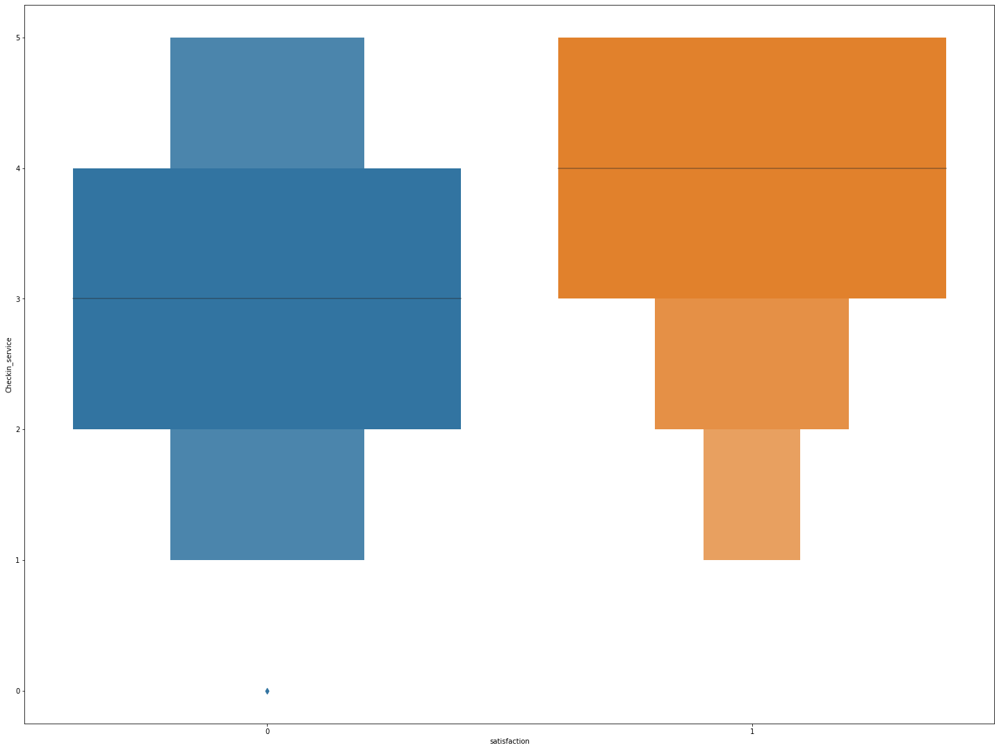

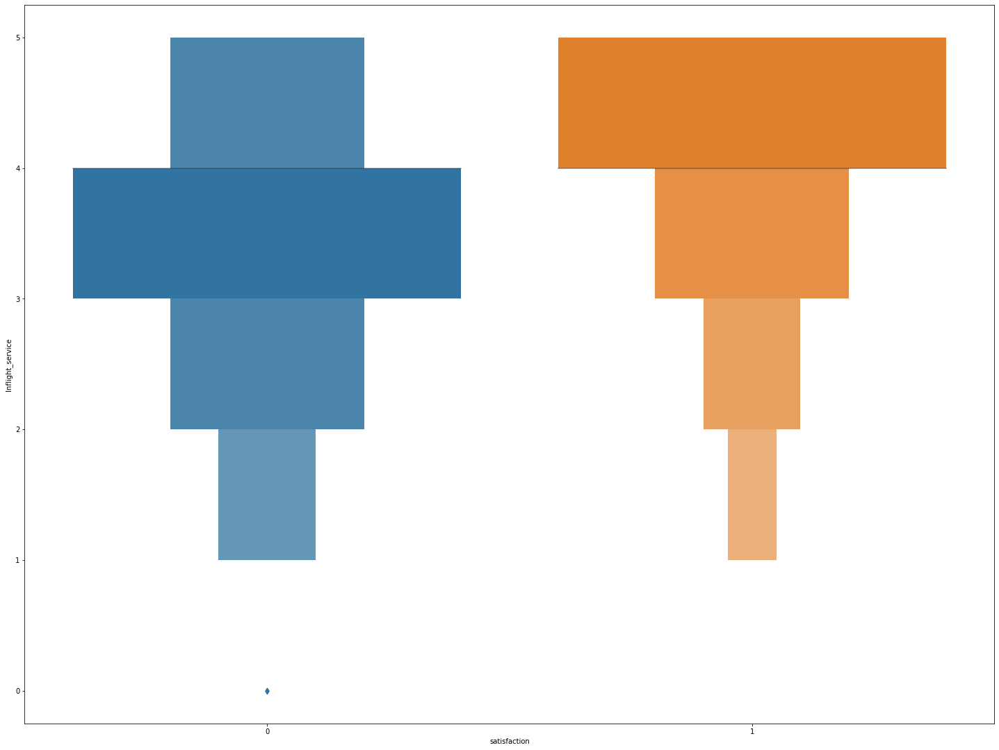

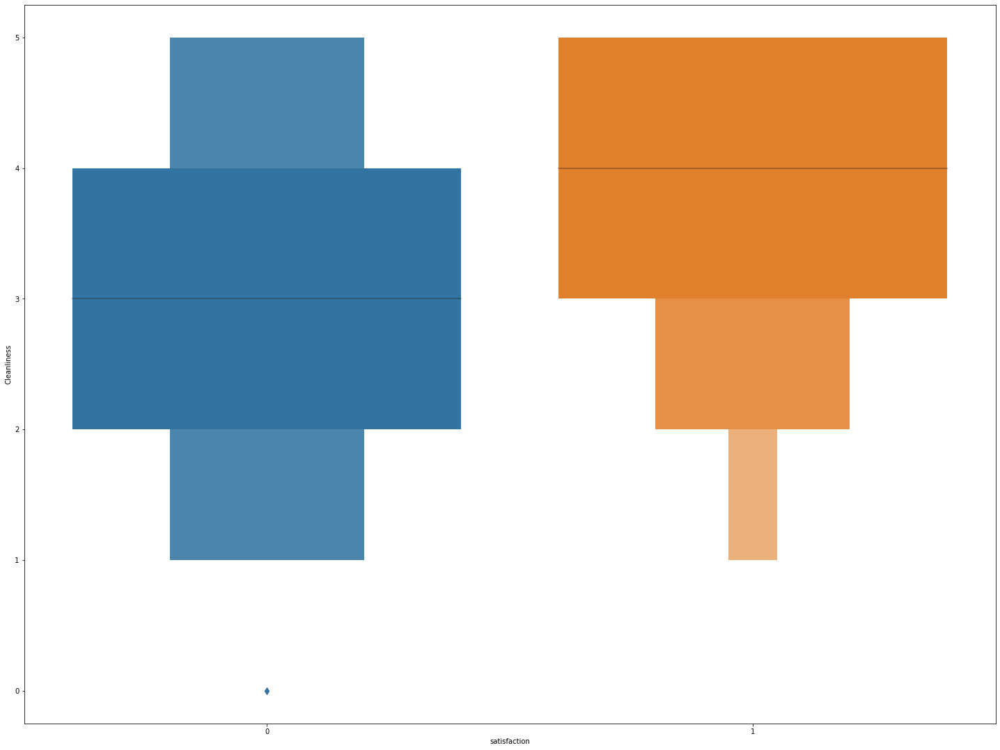

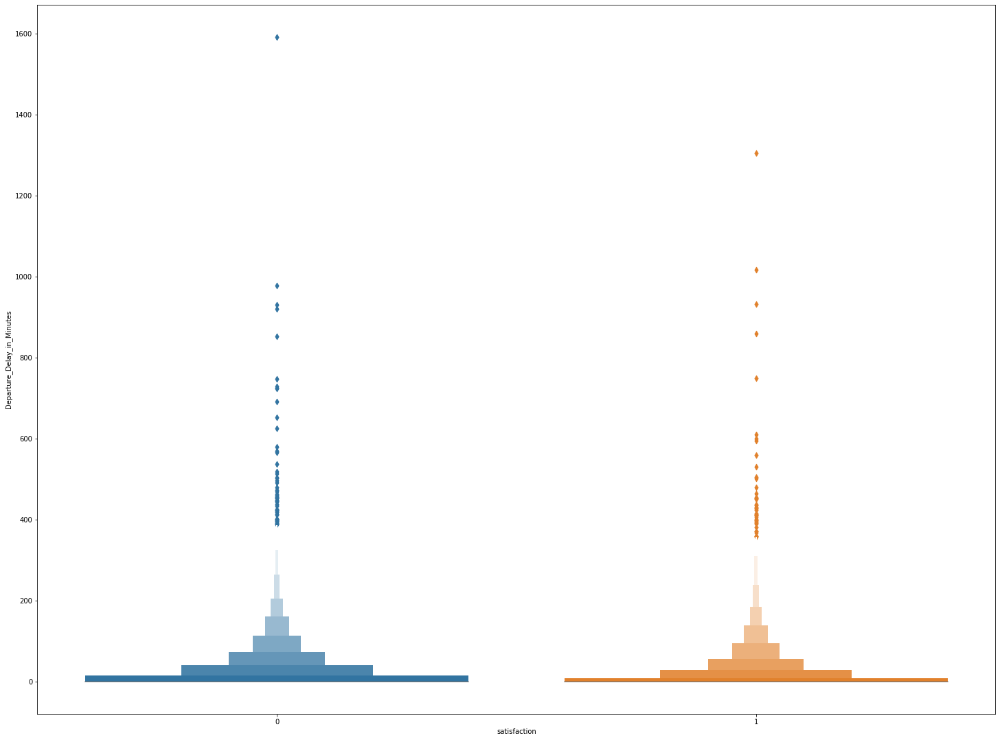

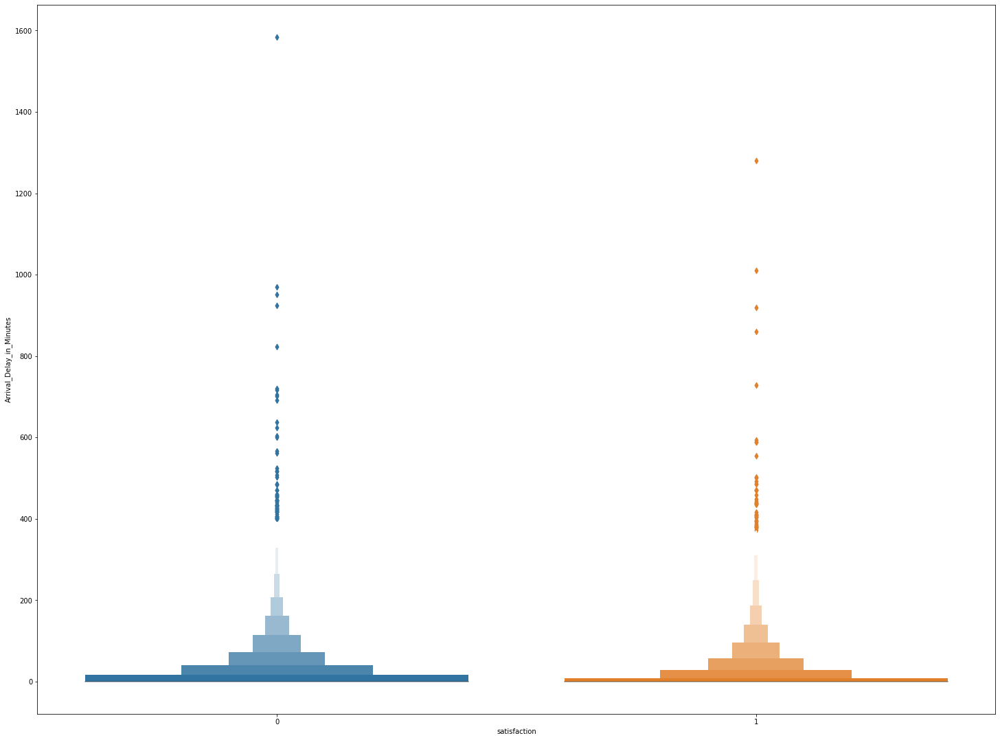

In [40]:
for i in [ 'id', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']:
    plt.figure(figsize=(25,19))
    sns.boxenplot(x=df.satisfaction,y=df[i],data=df,linewidth=1)
    plt.show()

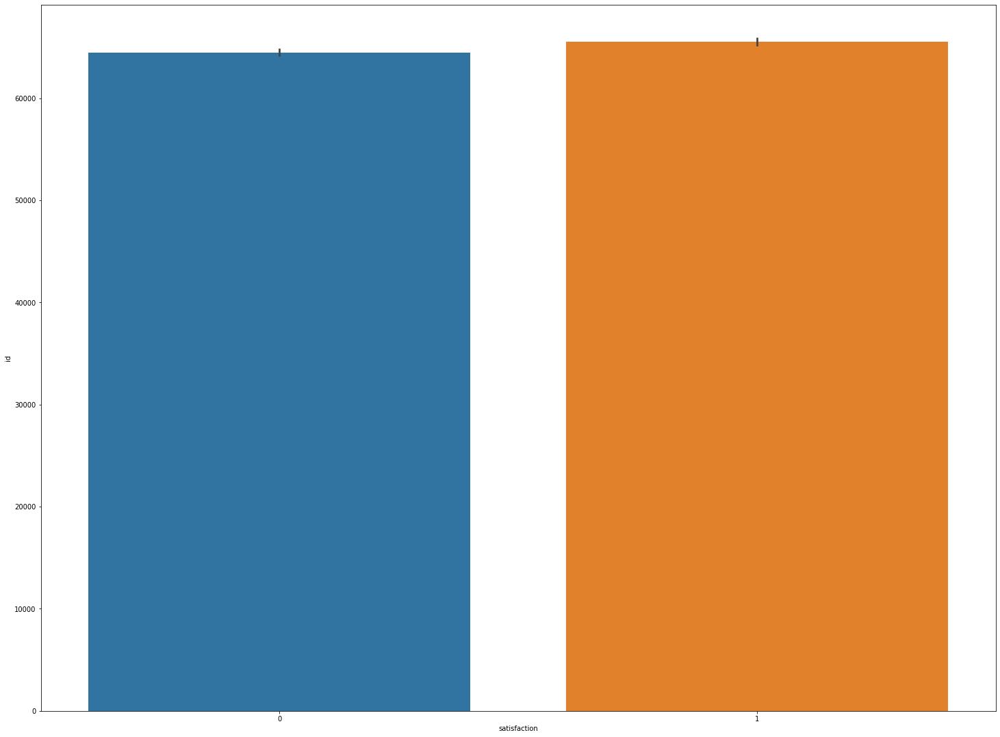

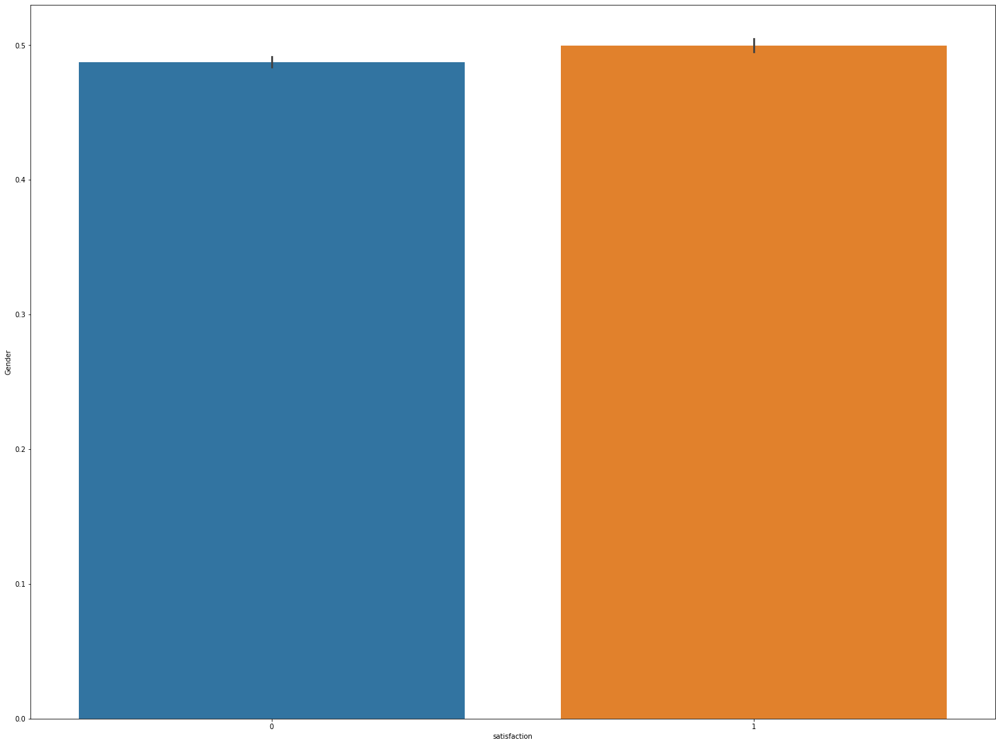

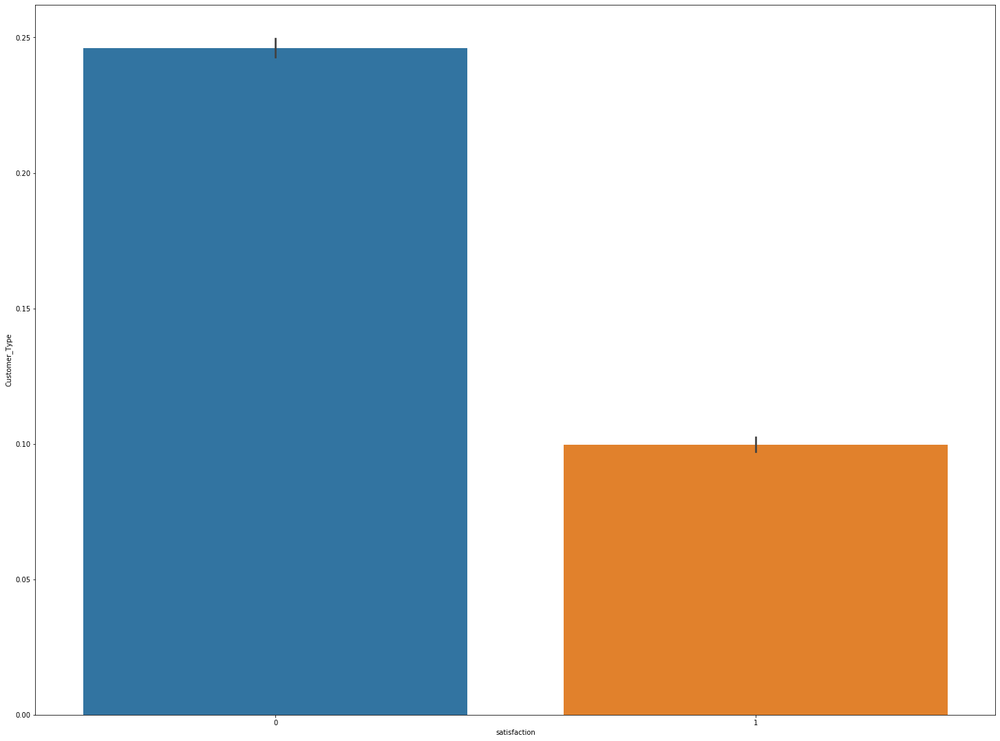

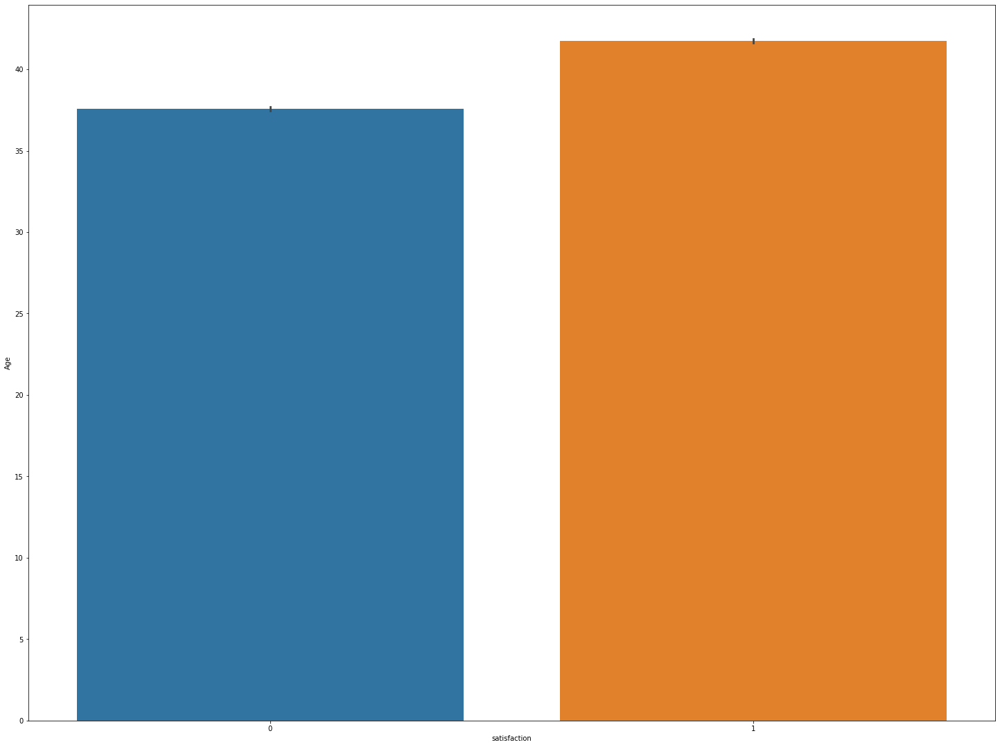

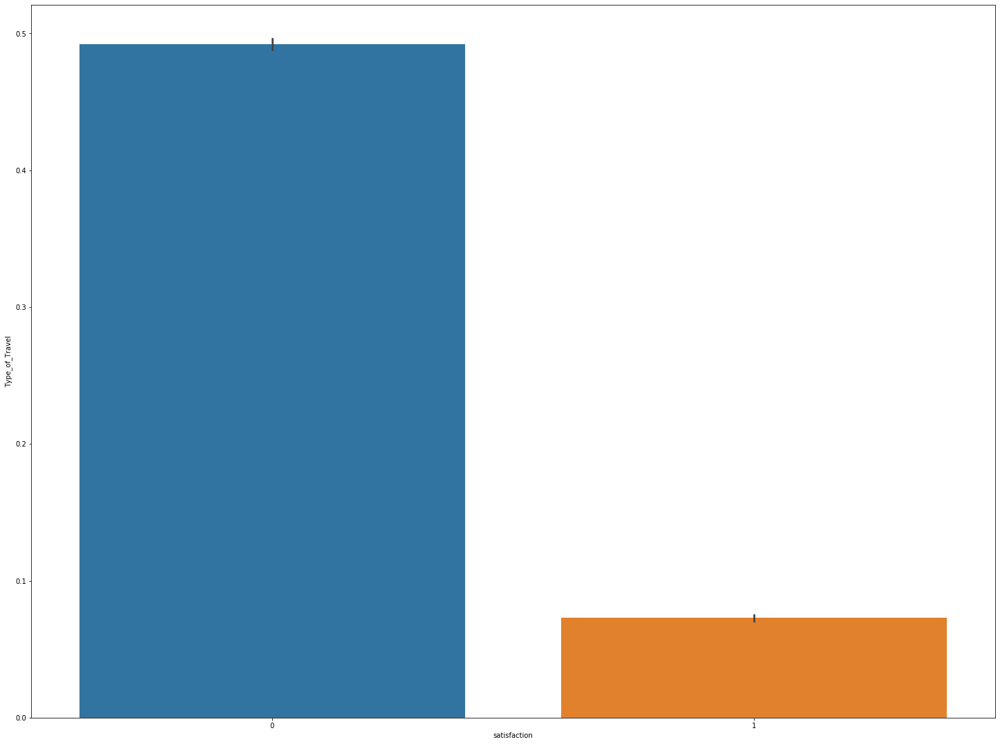

...

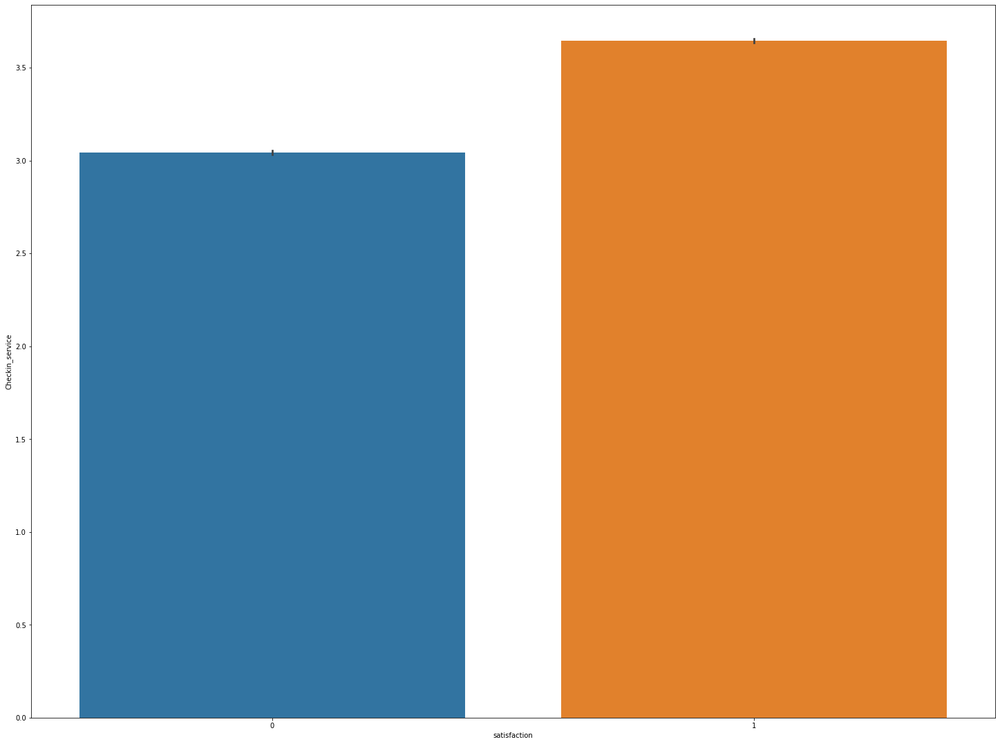

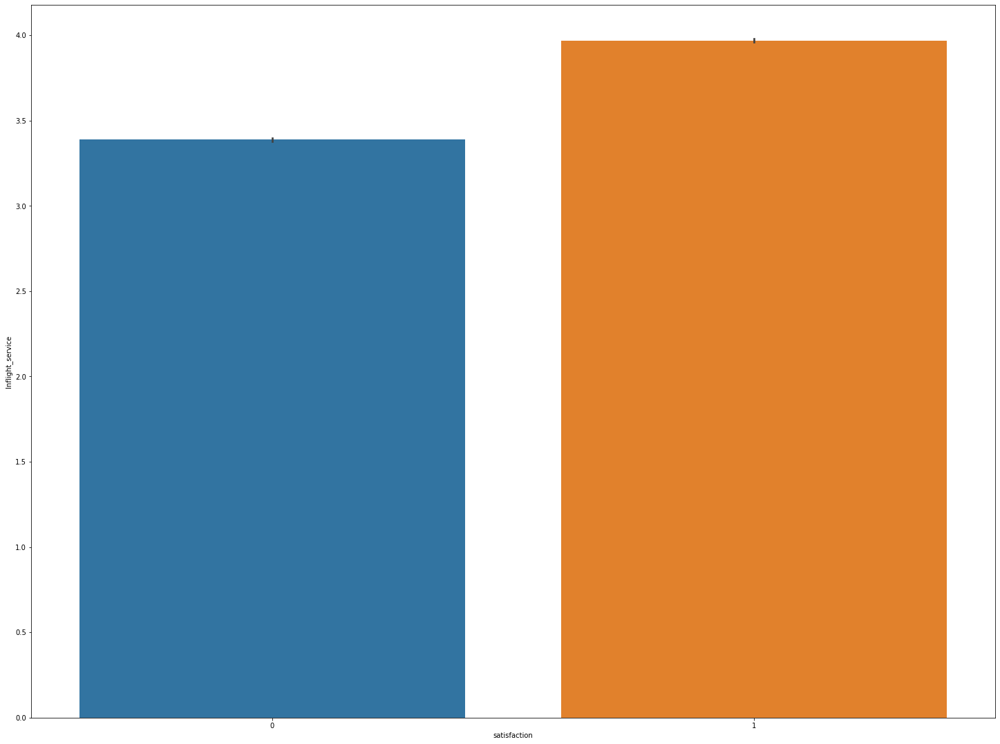

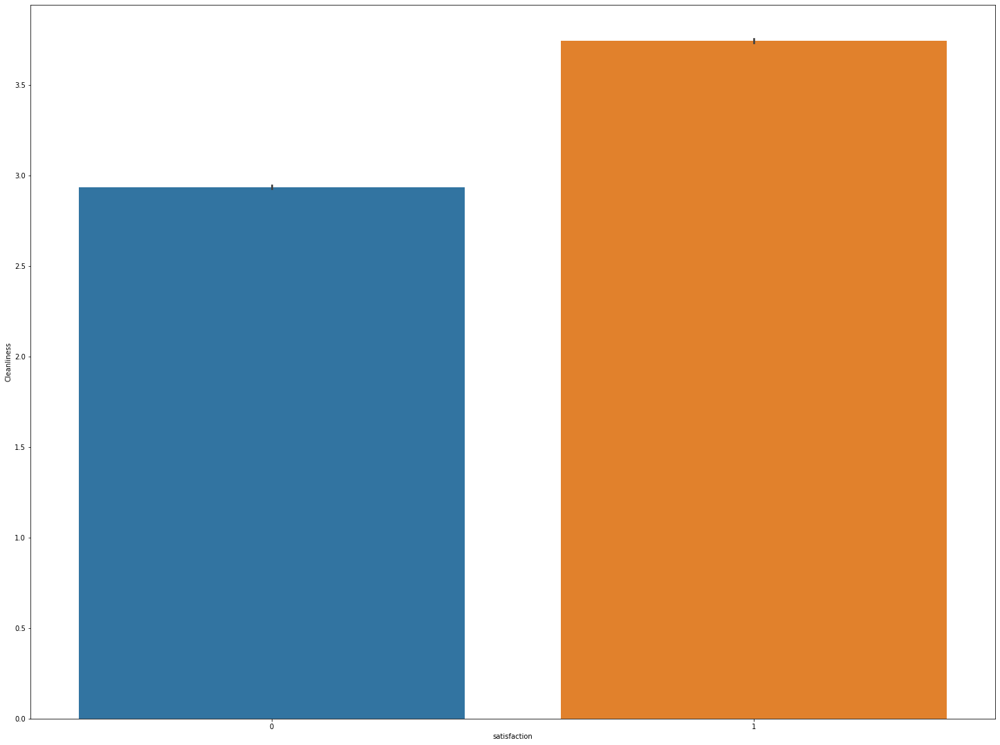

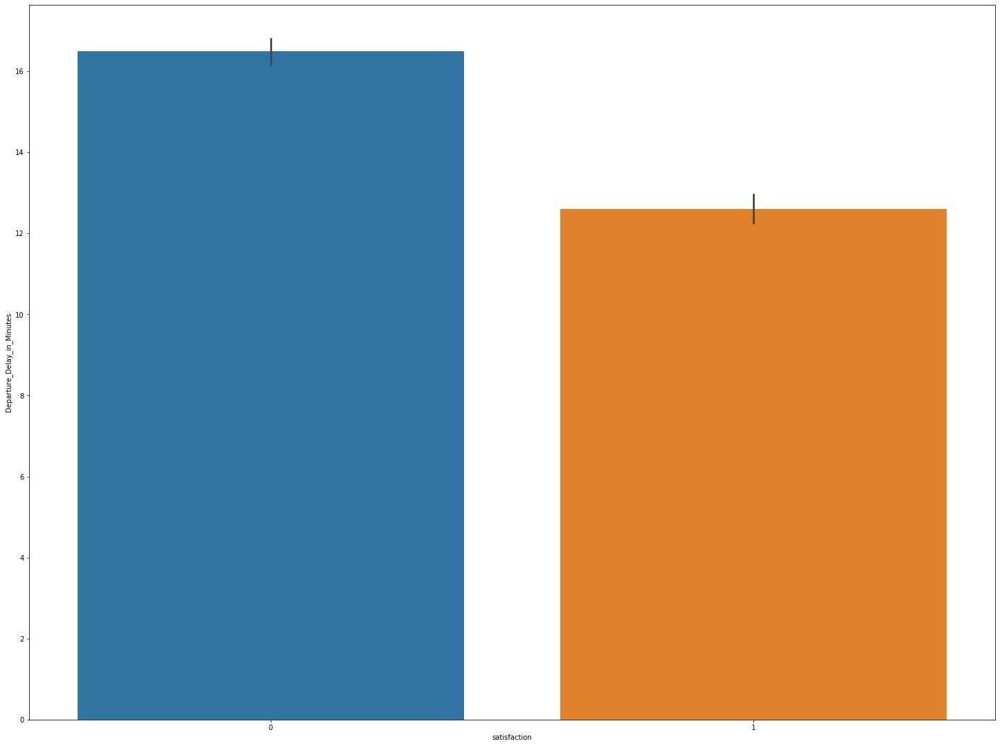

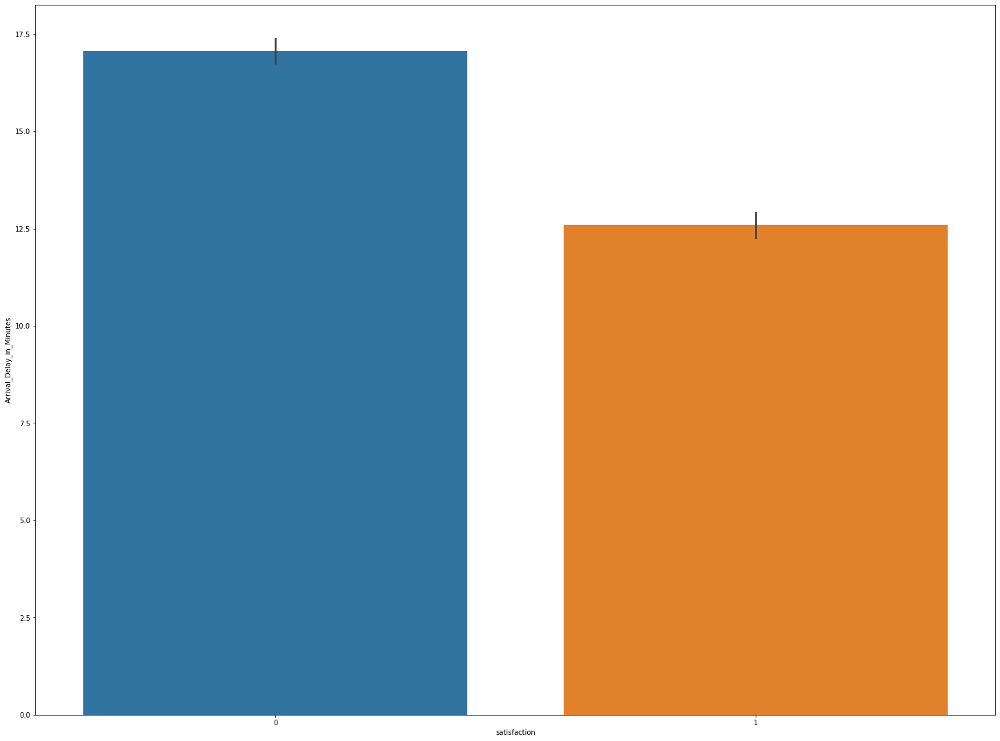

In [41]:
for i in [ 'id', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']:
    plt.figure(figsize=(25,19))
    sns.barplot(x=df.satisfaction,y=df[i],data=df,linewidth=1)
    plt.show()

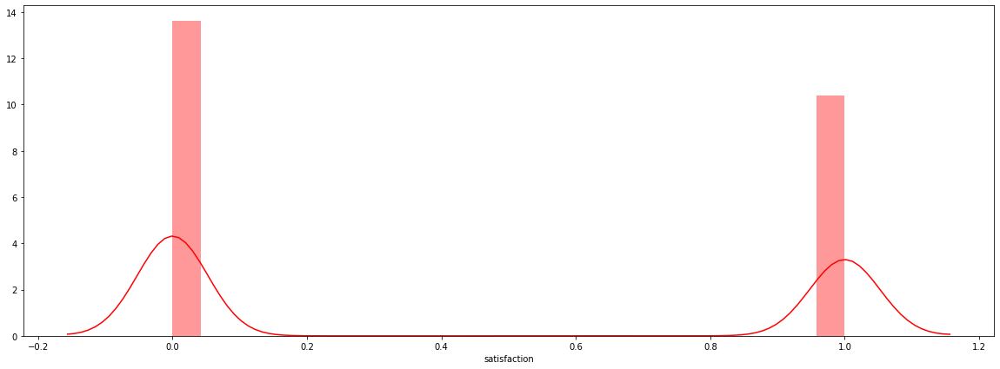

In [46]:
plt.figure(figsize=(20,7))
sns.distplot(df['satisfaction'],color='red')

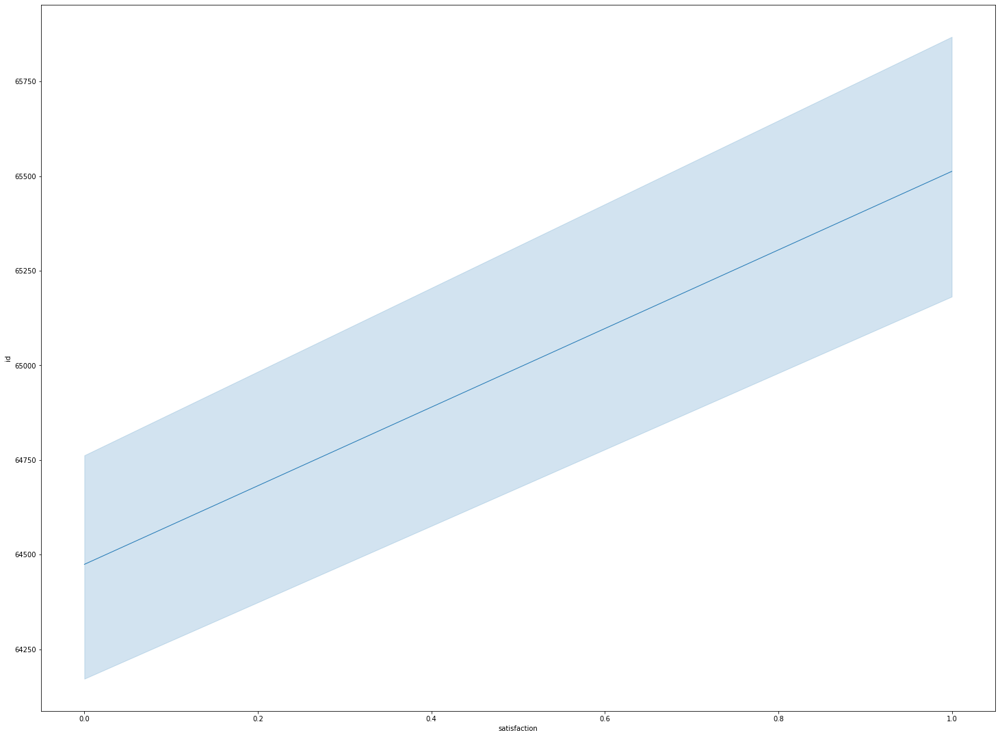

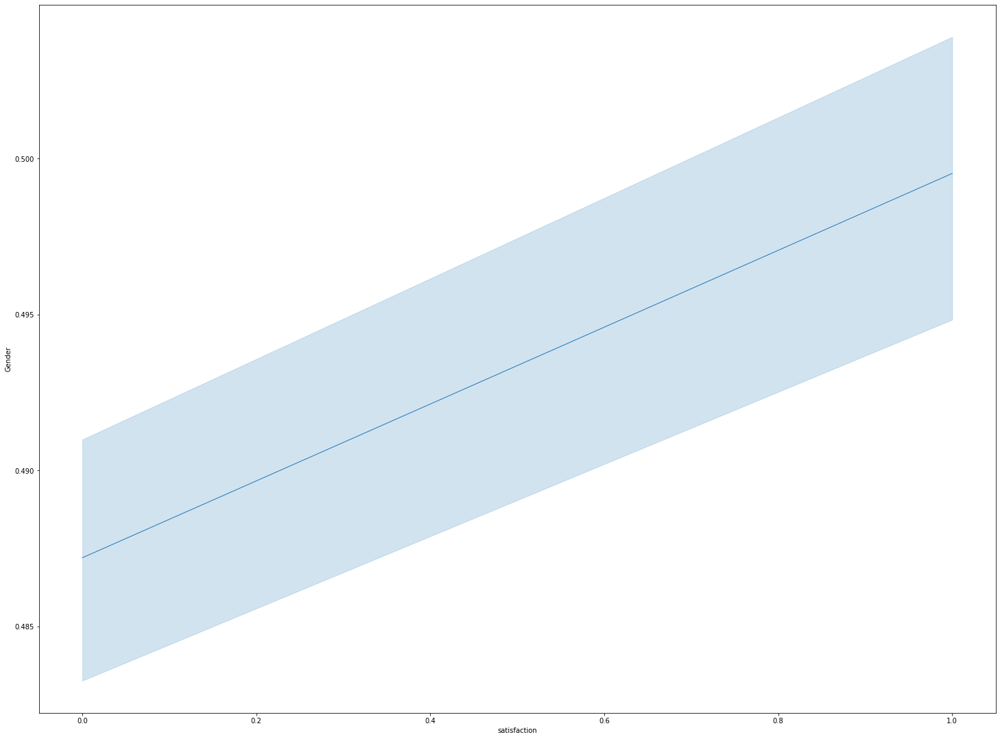

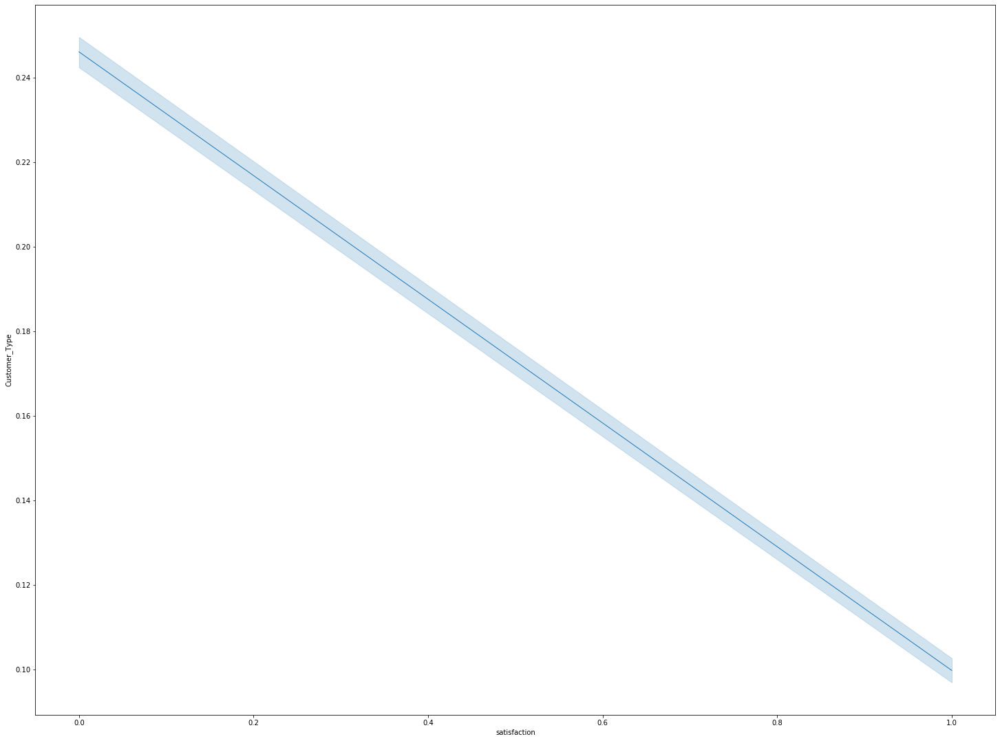

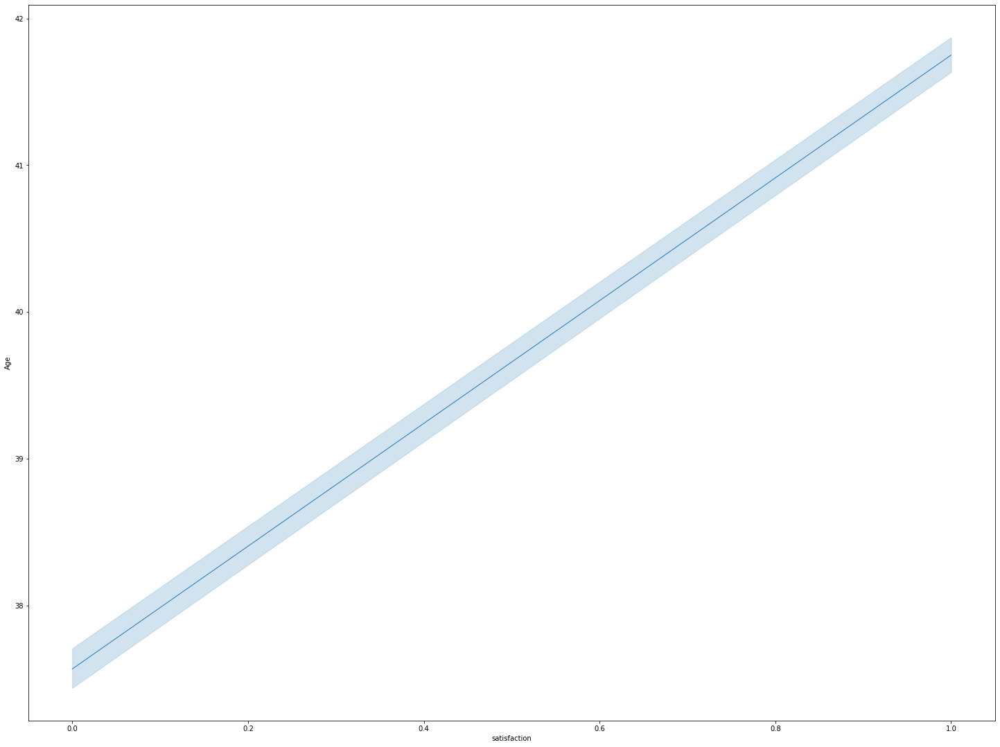

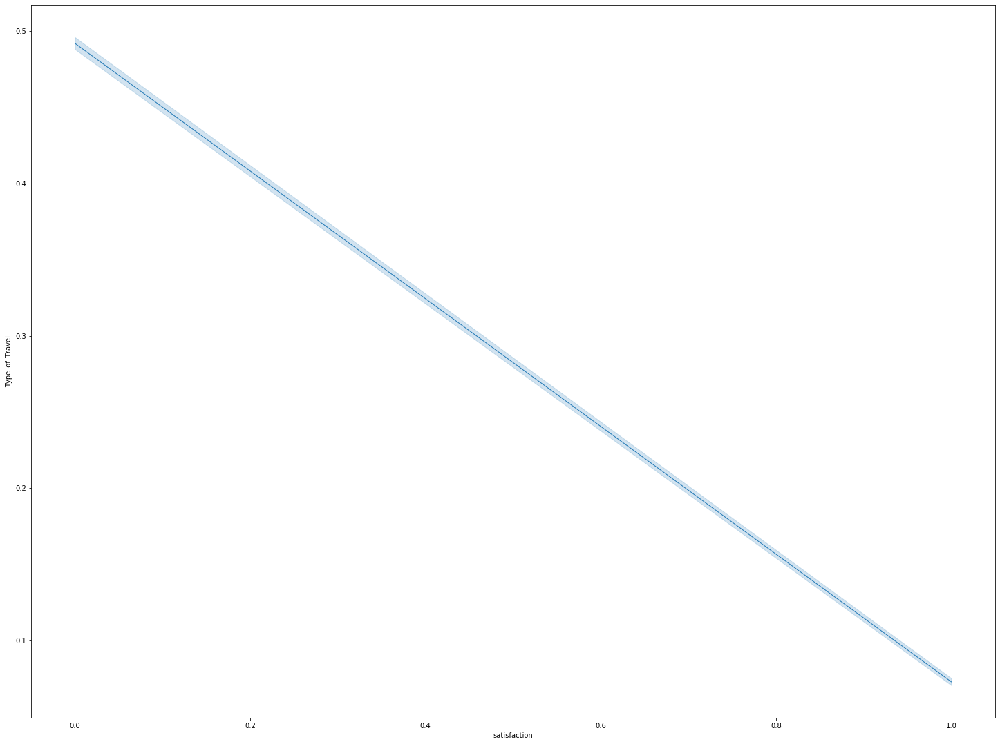

...

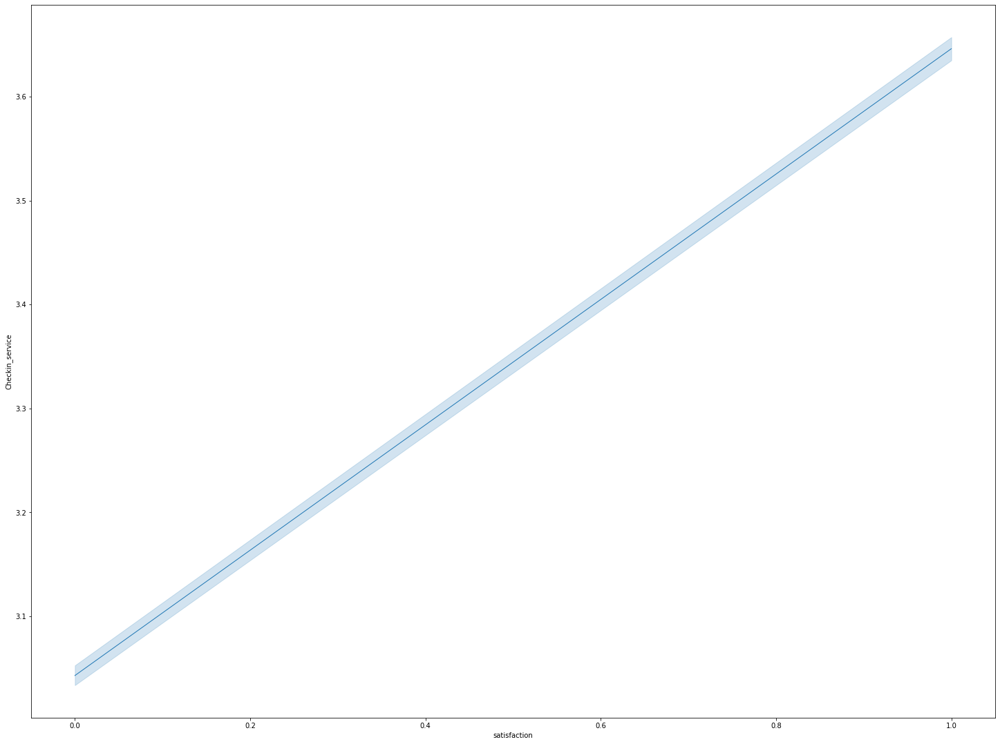

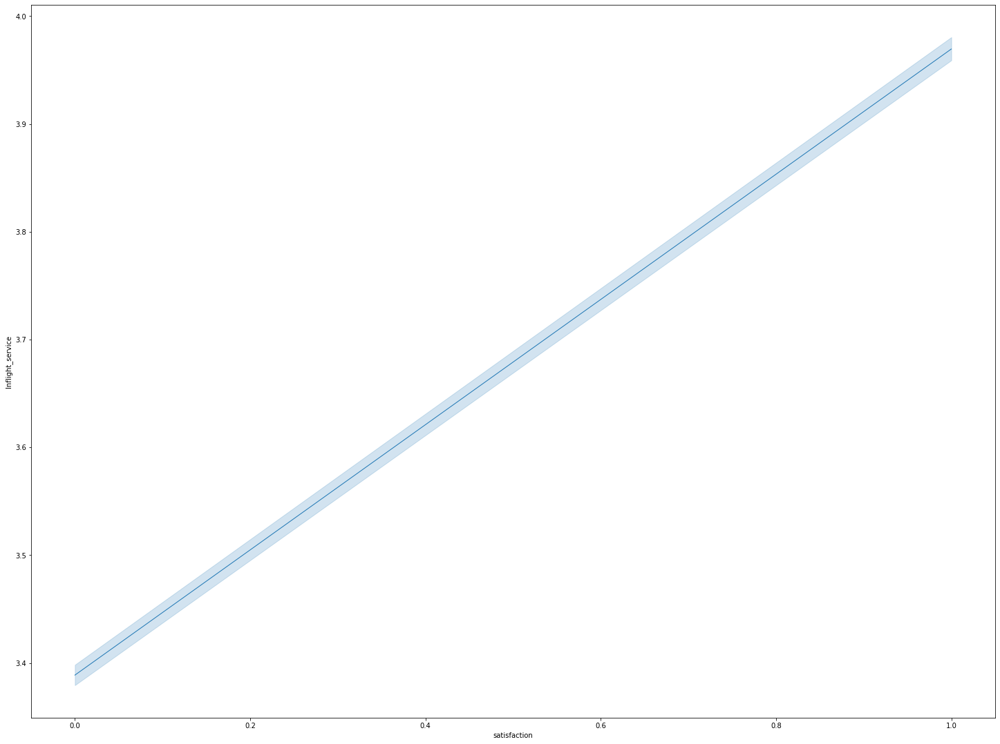

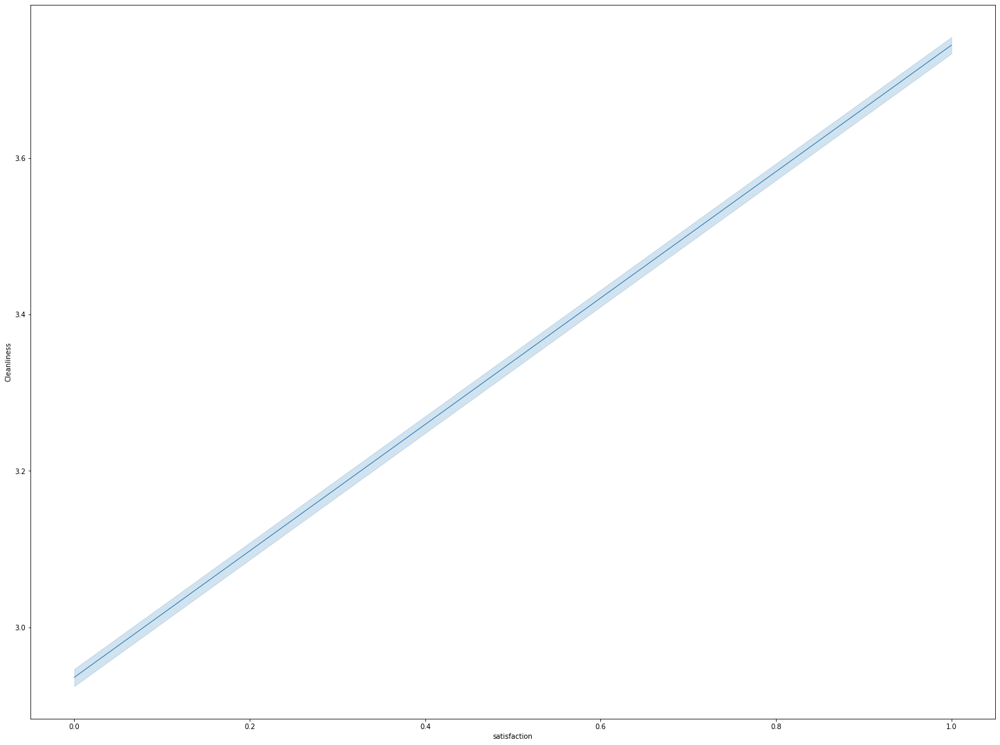

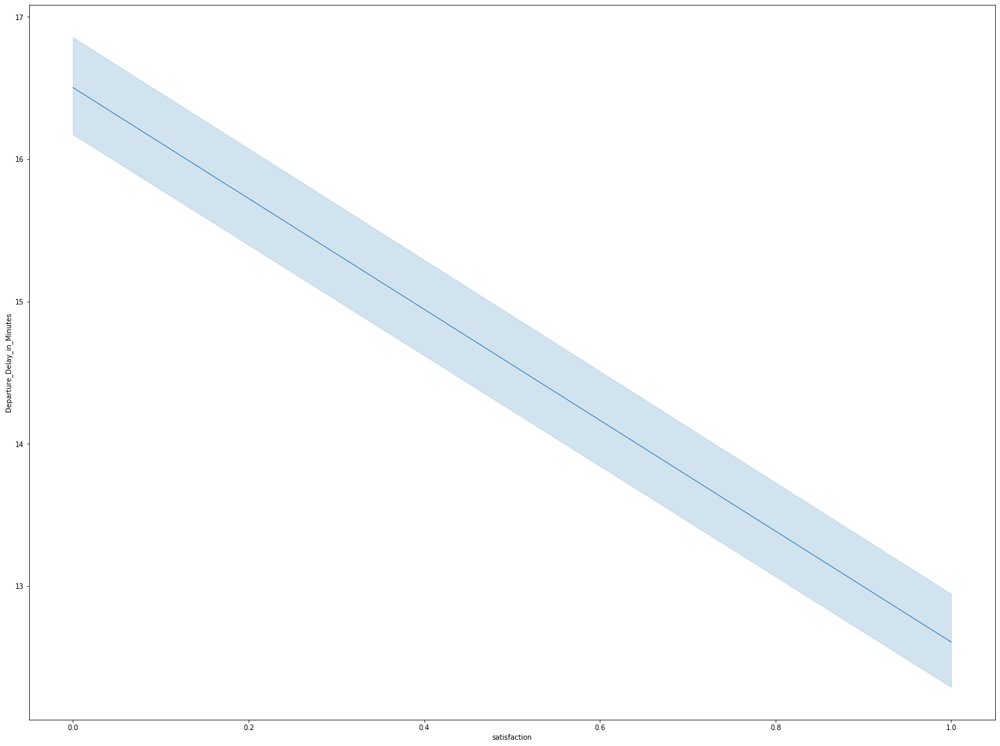

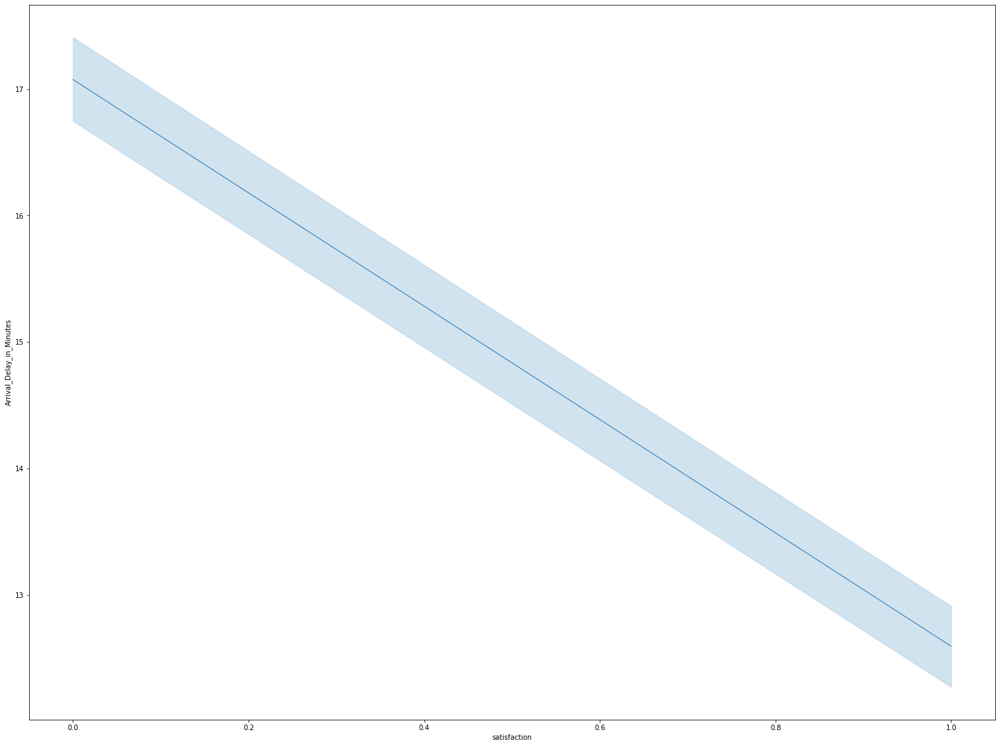

In [47]:
for i in [ 'id', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']:
    plt.figure(figsize=(25,19))
    sns.lineplot(x=df.satisfaction,y=df[i],data=df,linewidth=1)
    plt.show()

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


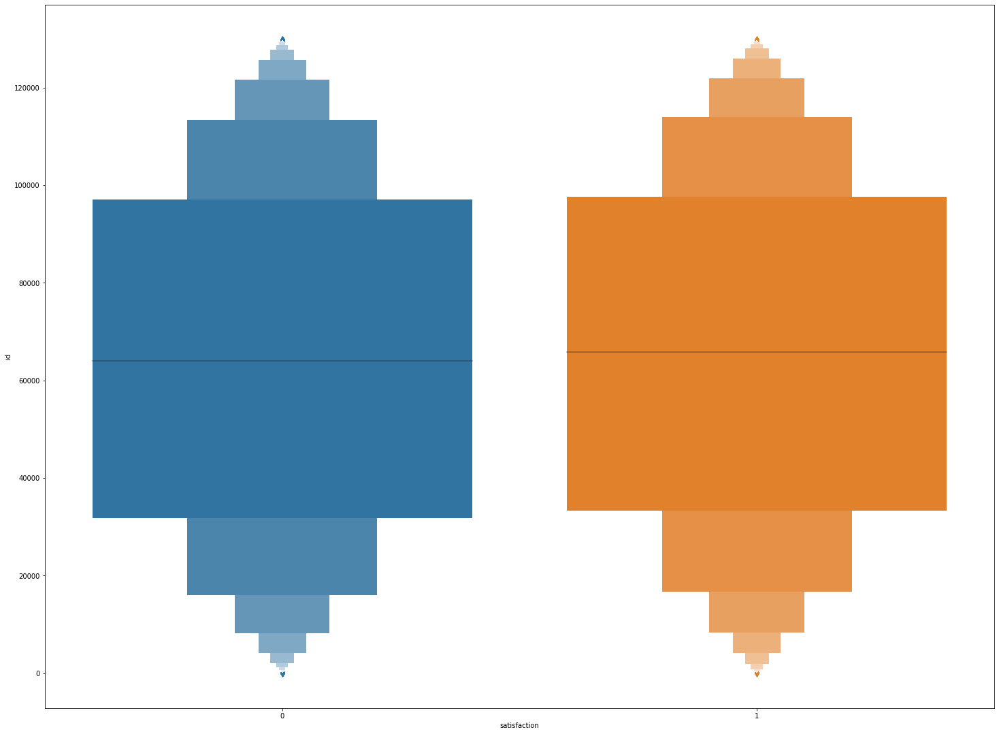

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


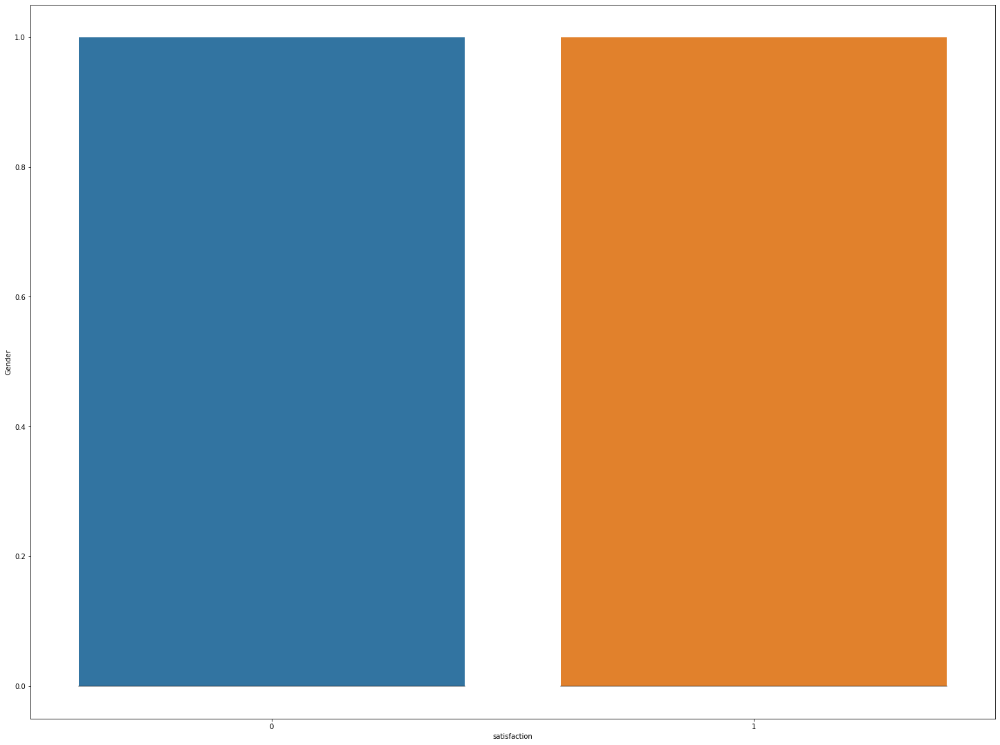

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


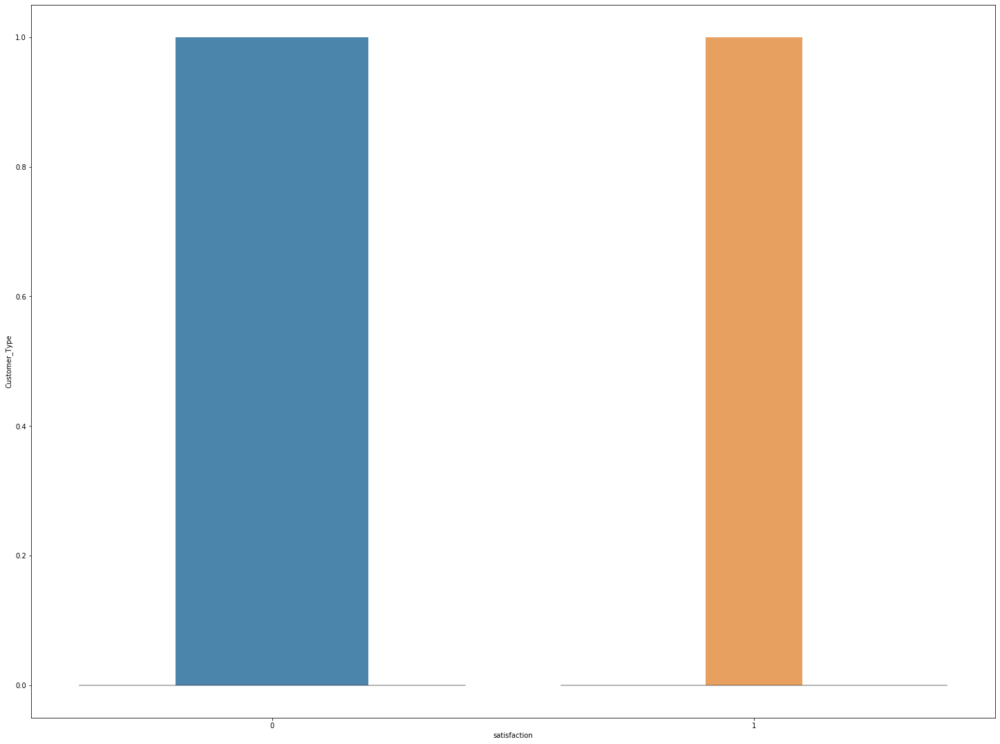

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


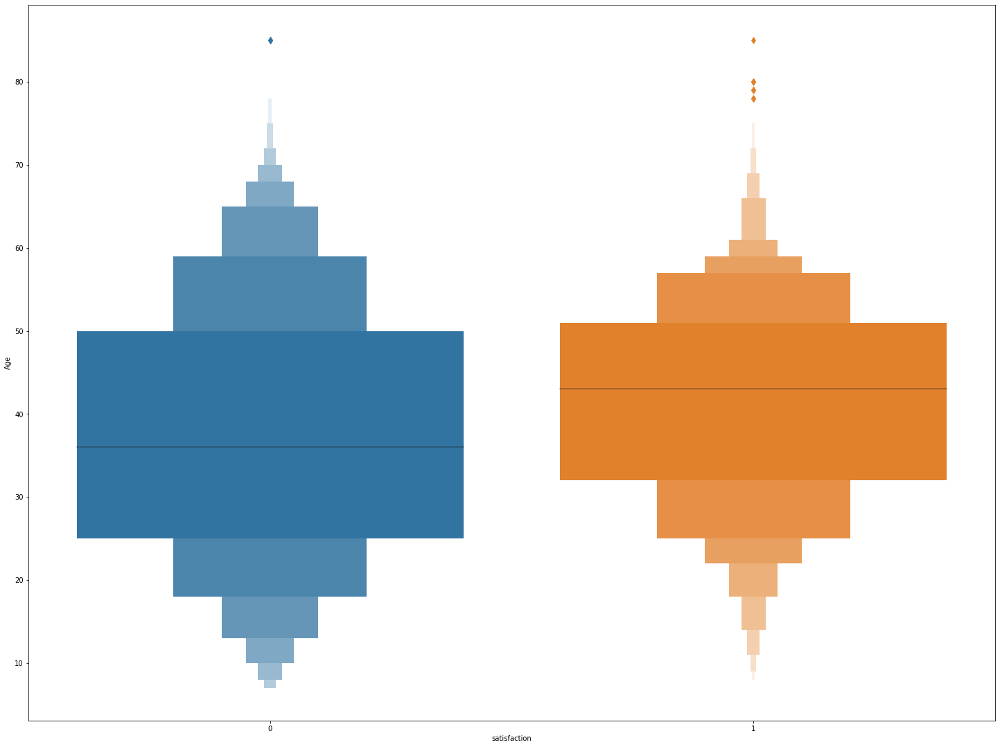

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


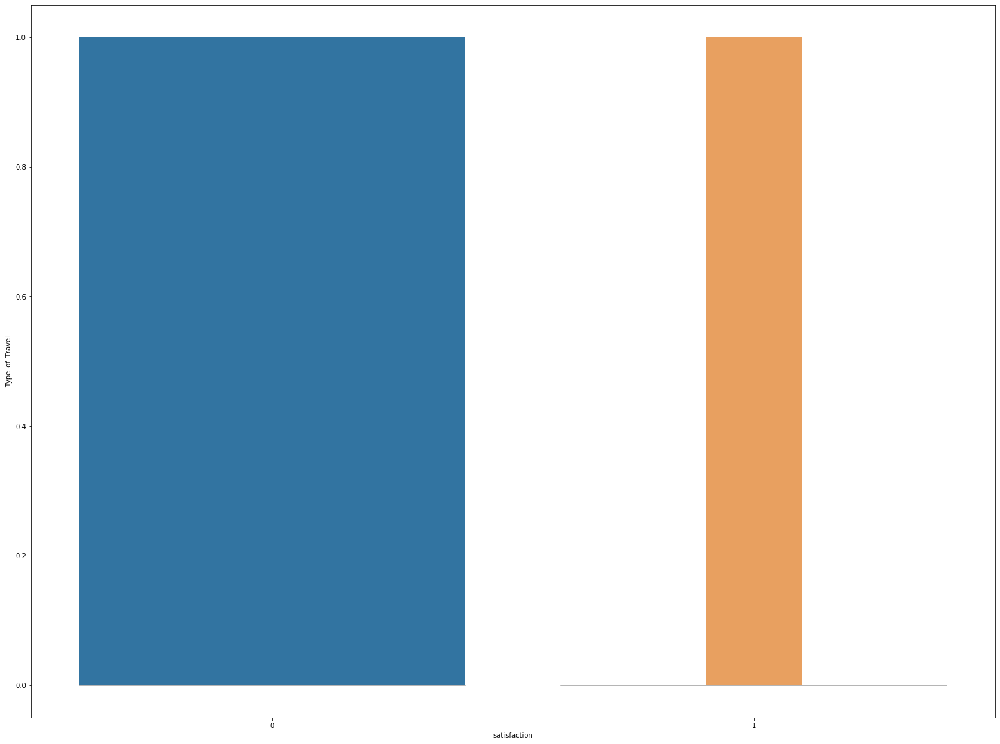

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


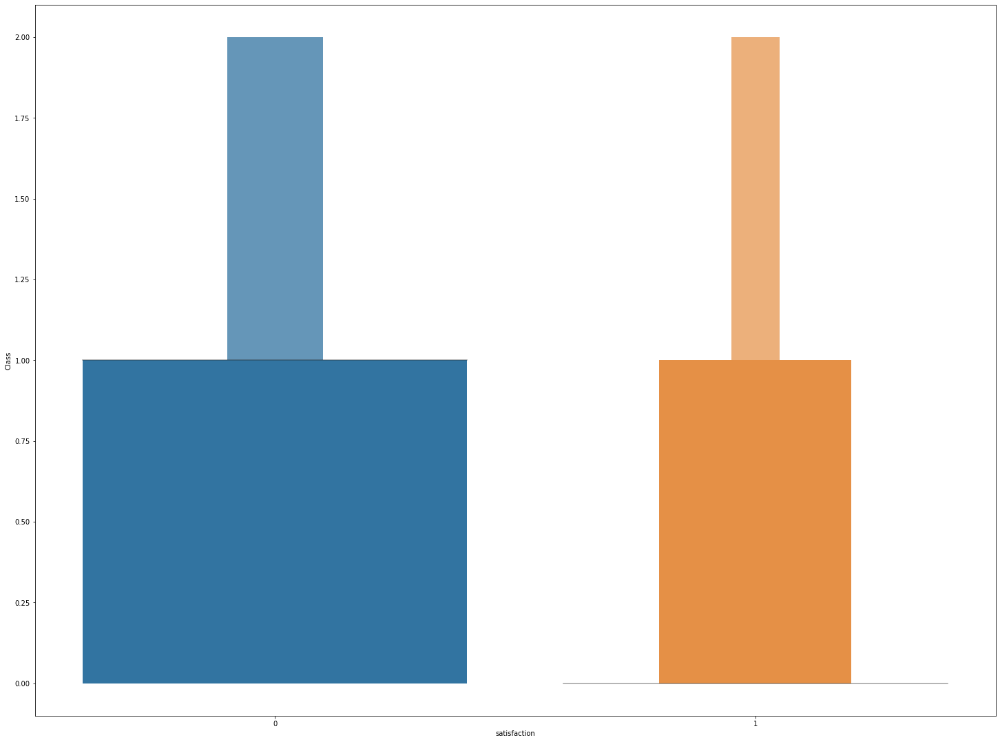

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


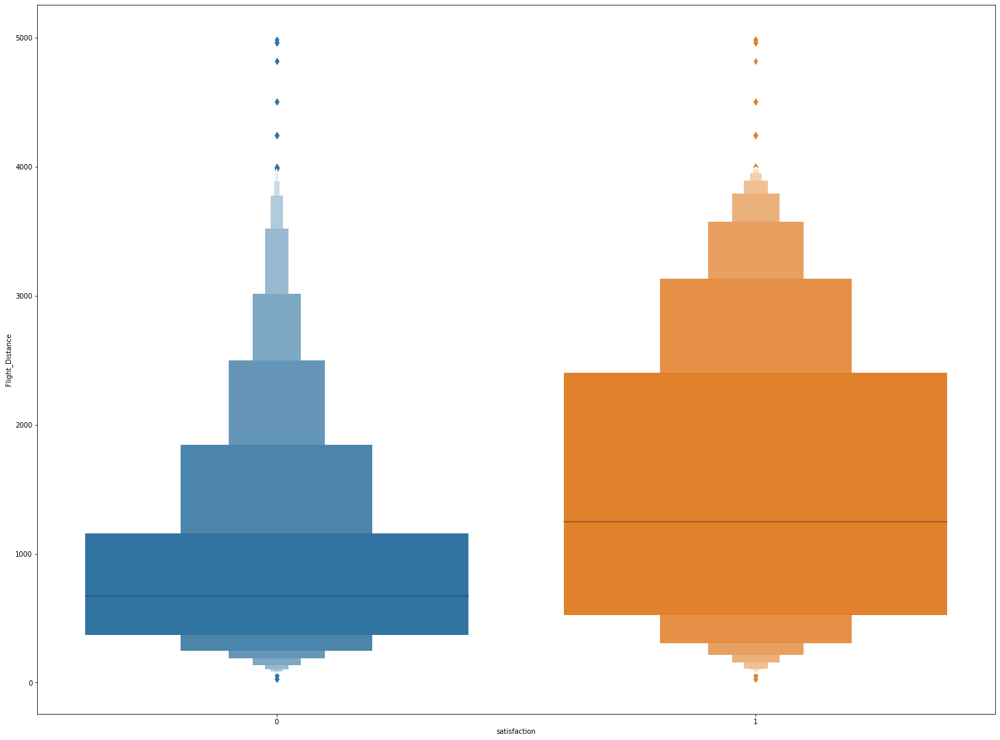

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


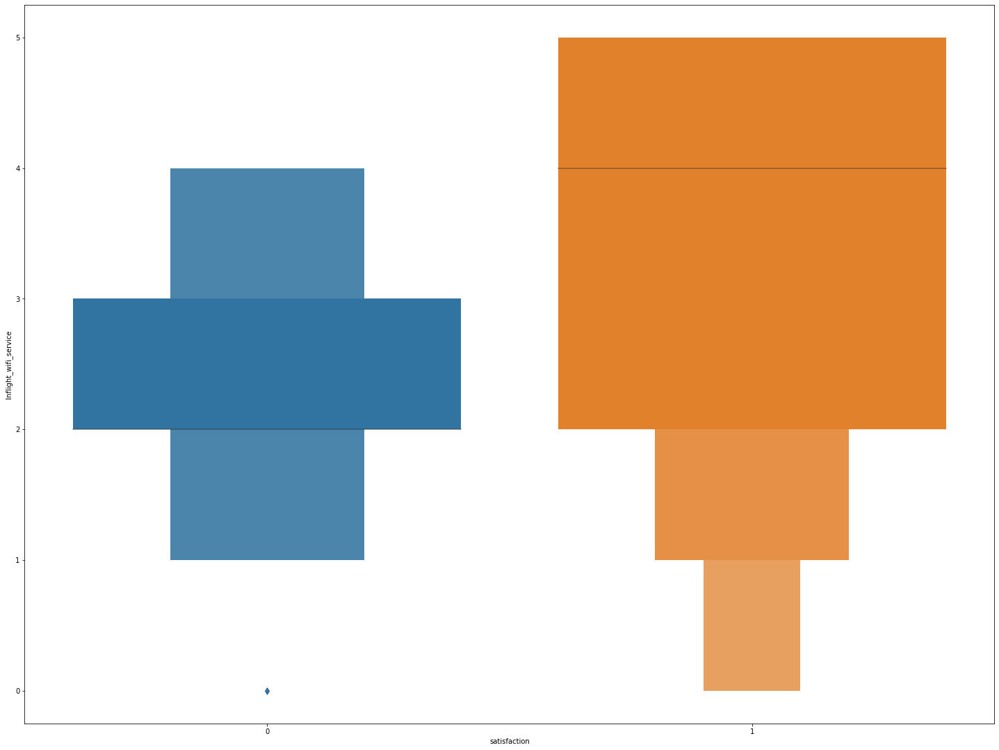

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


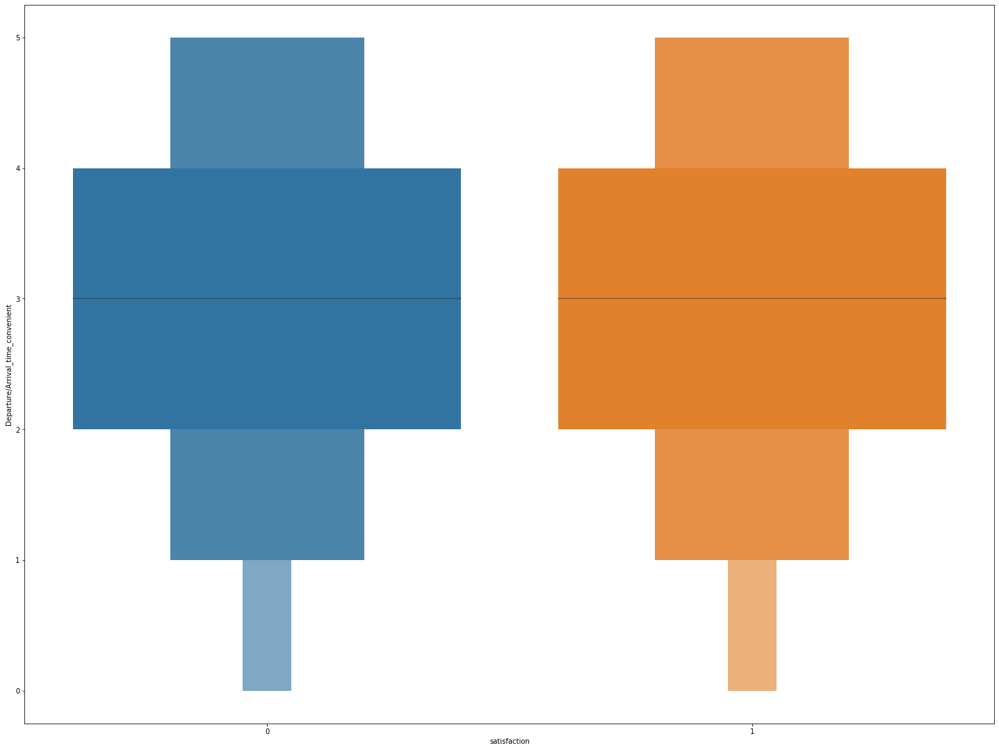

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


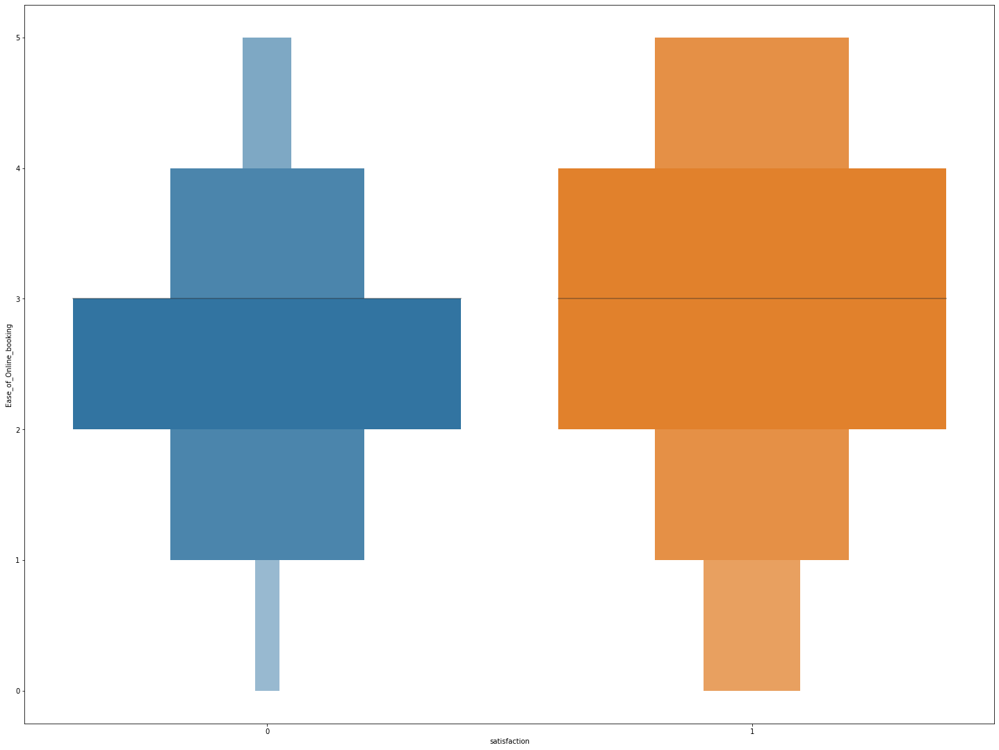

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


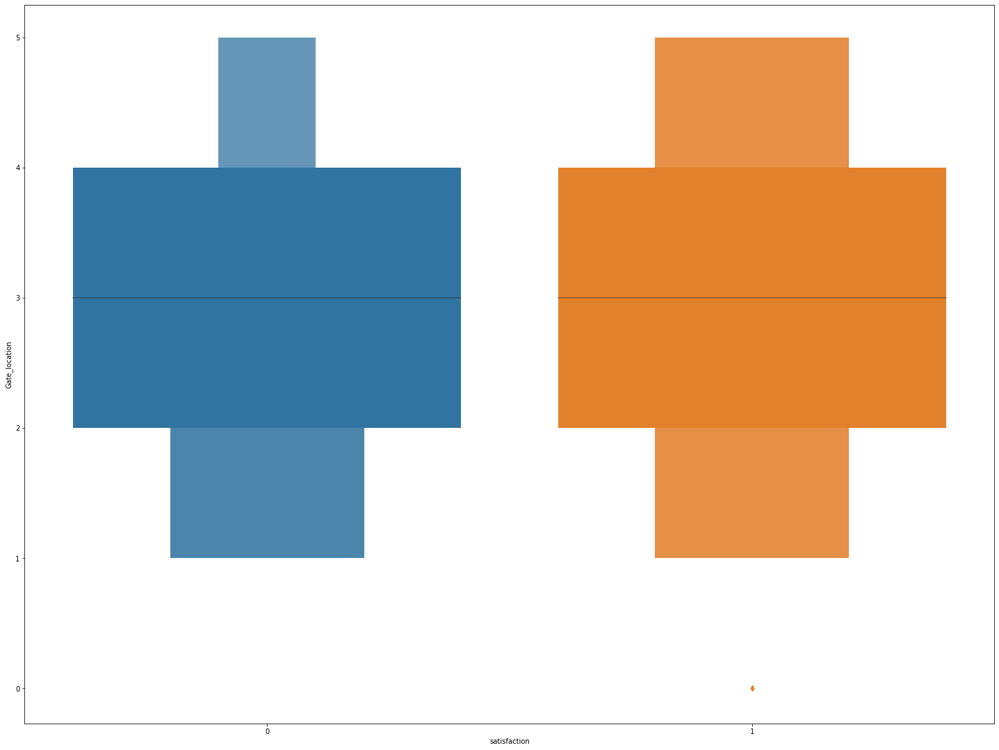

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


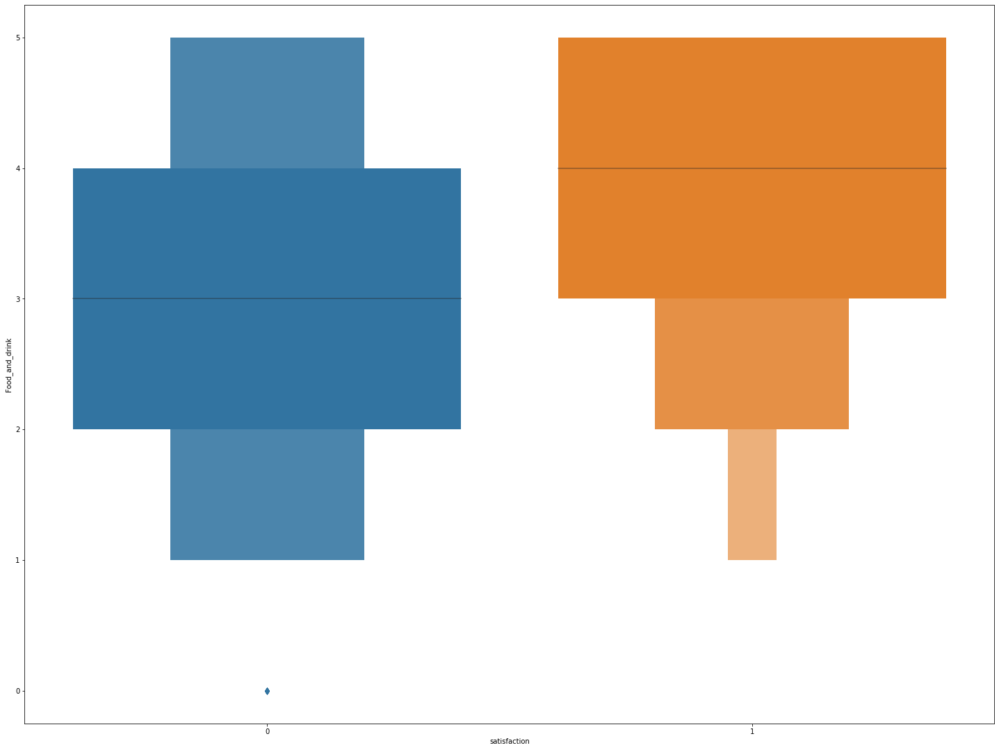

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


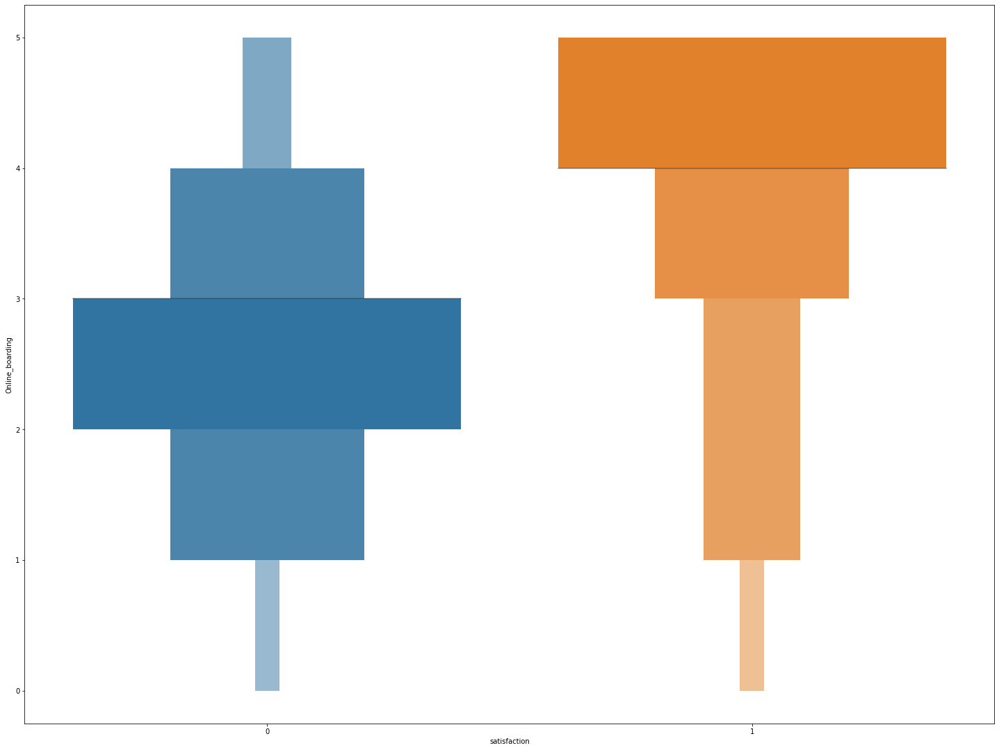

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


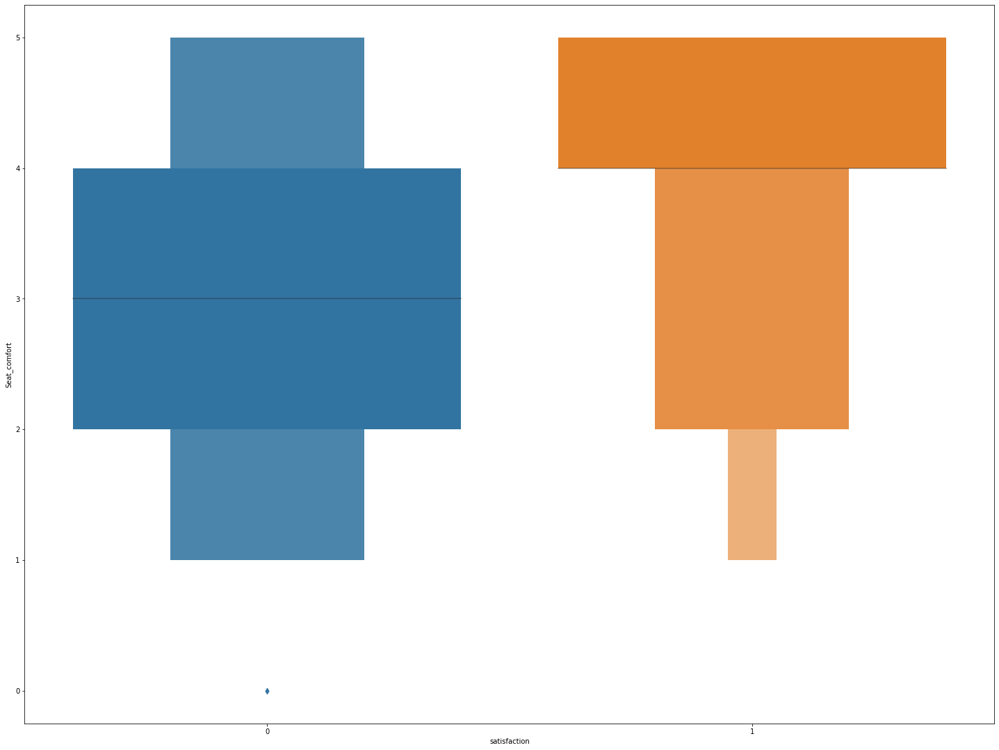

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


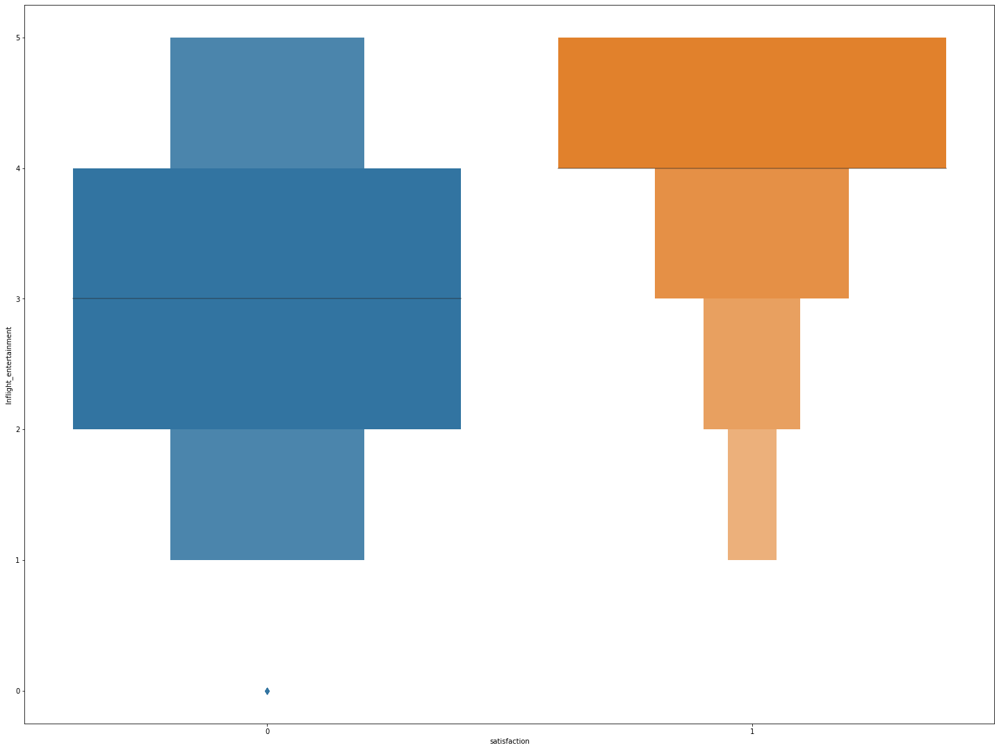

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


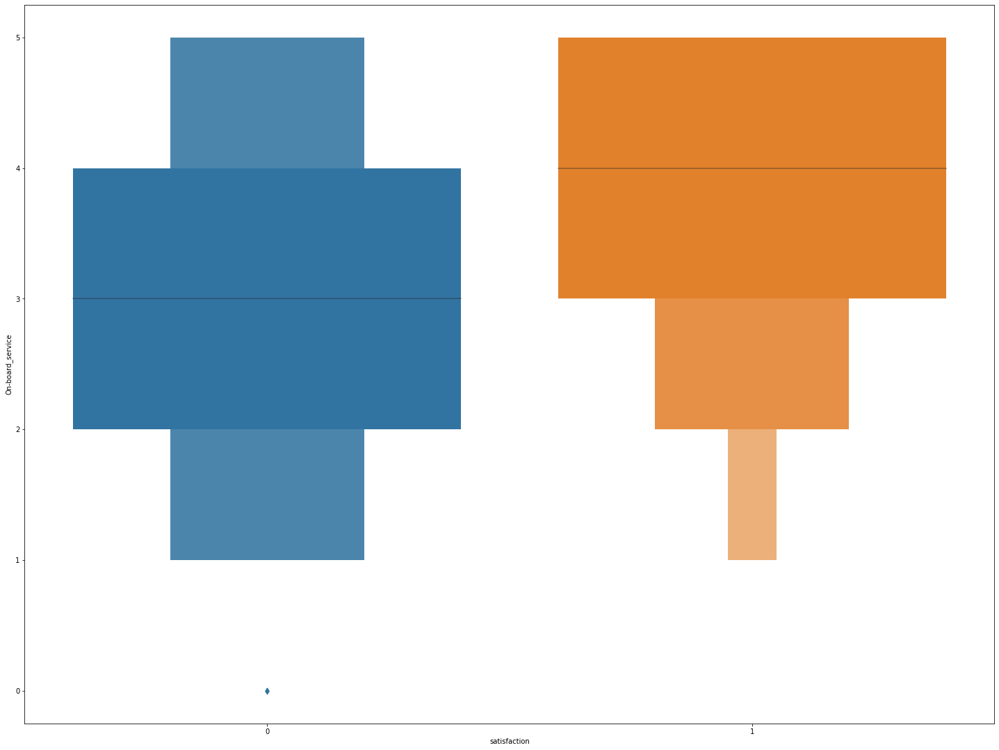

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


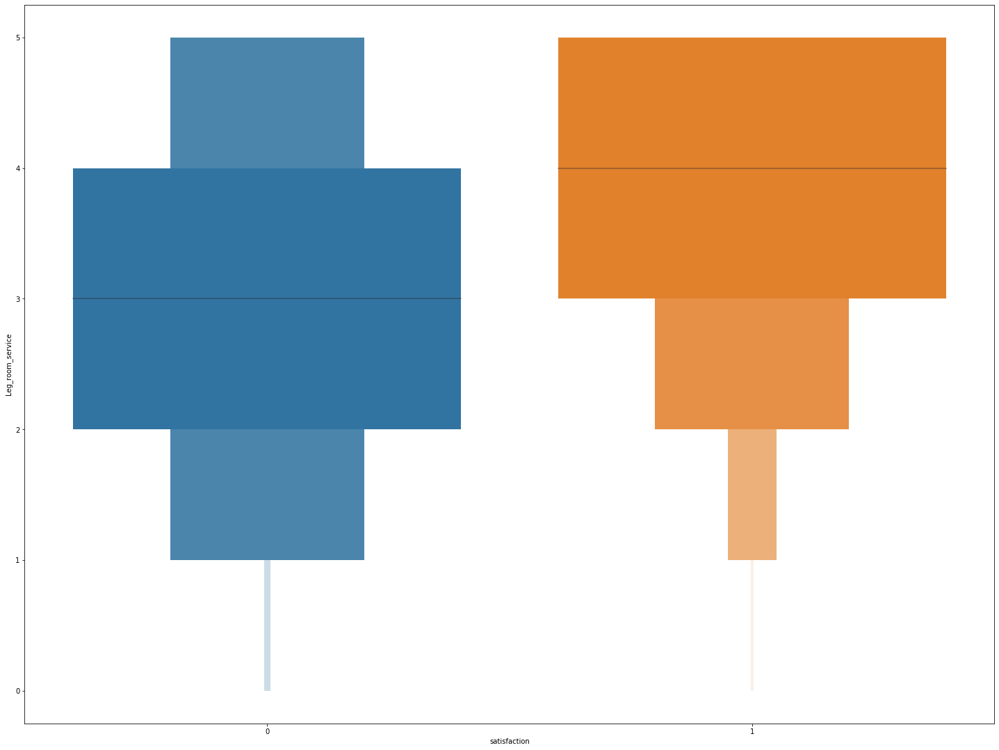

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


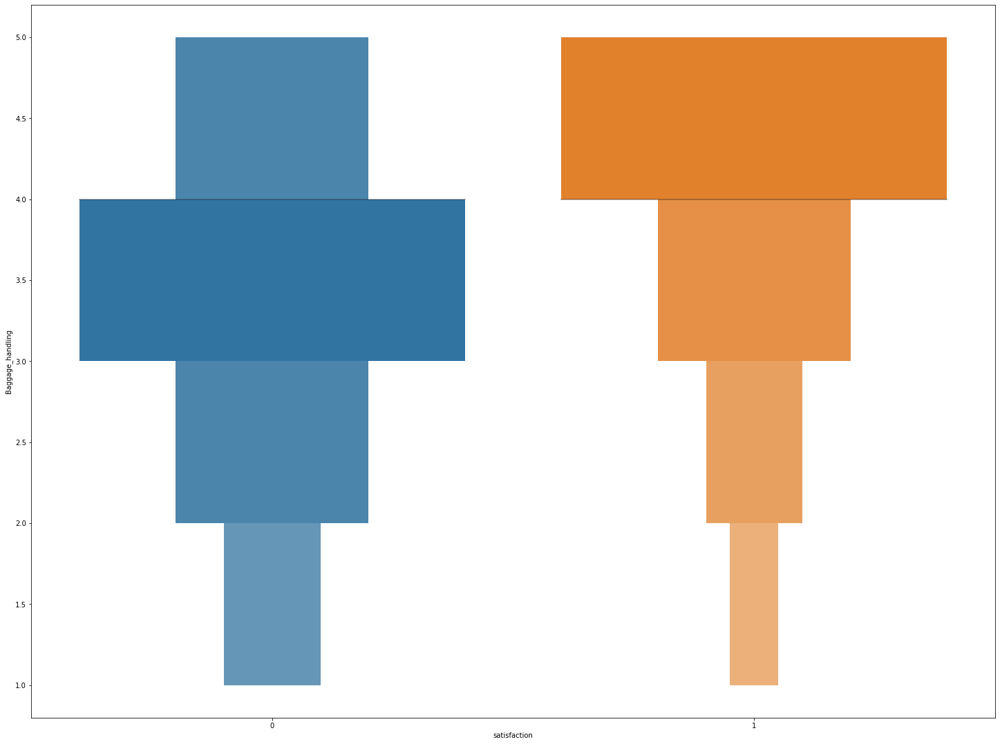

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


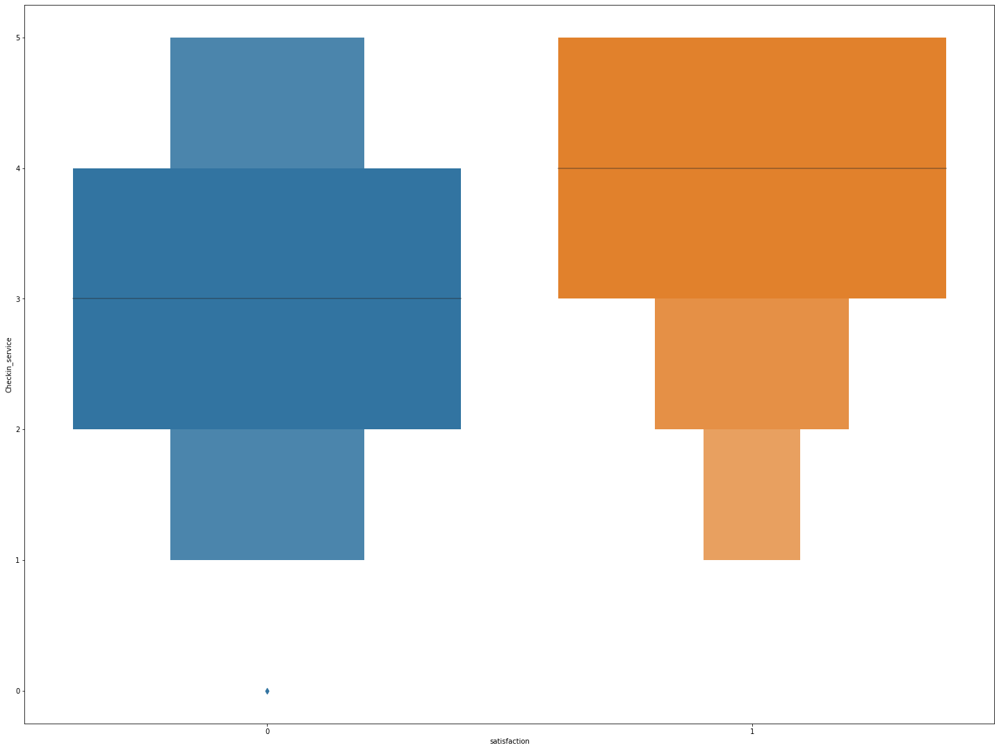

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


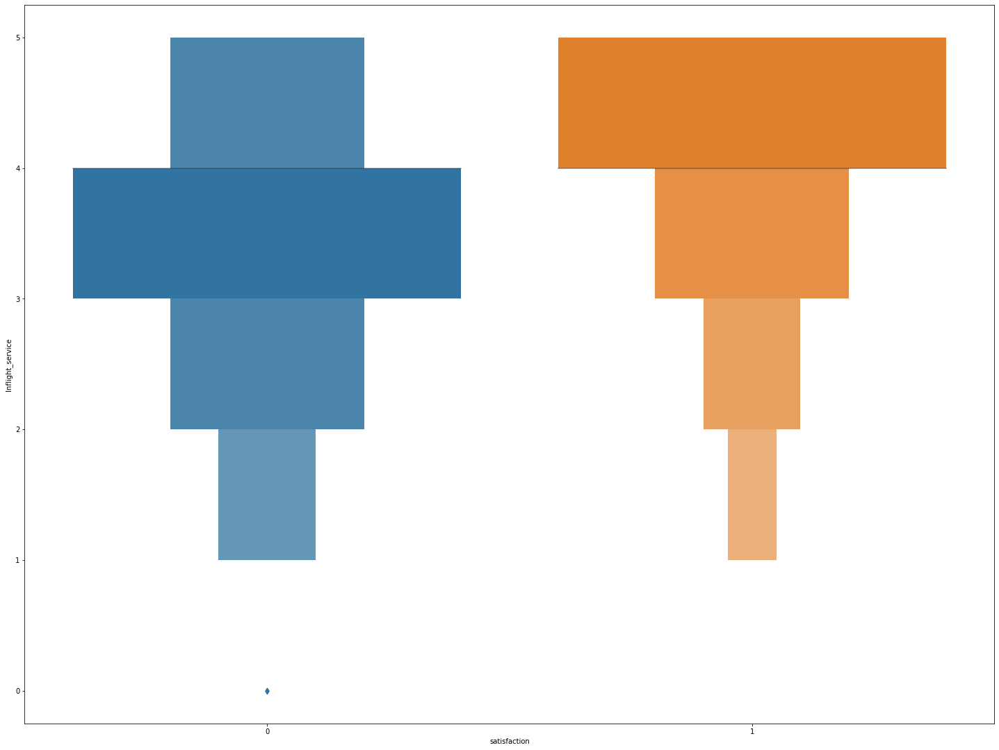

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


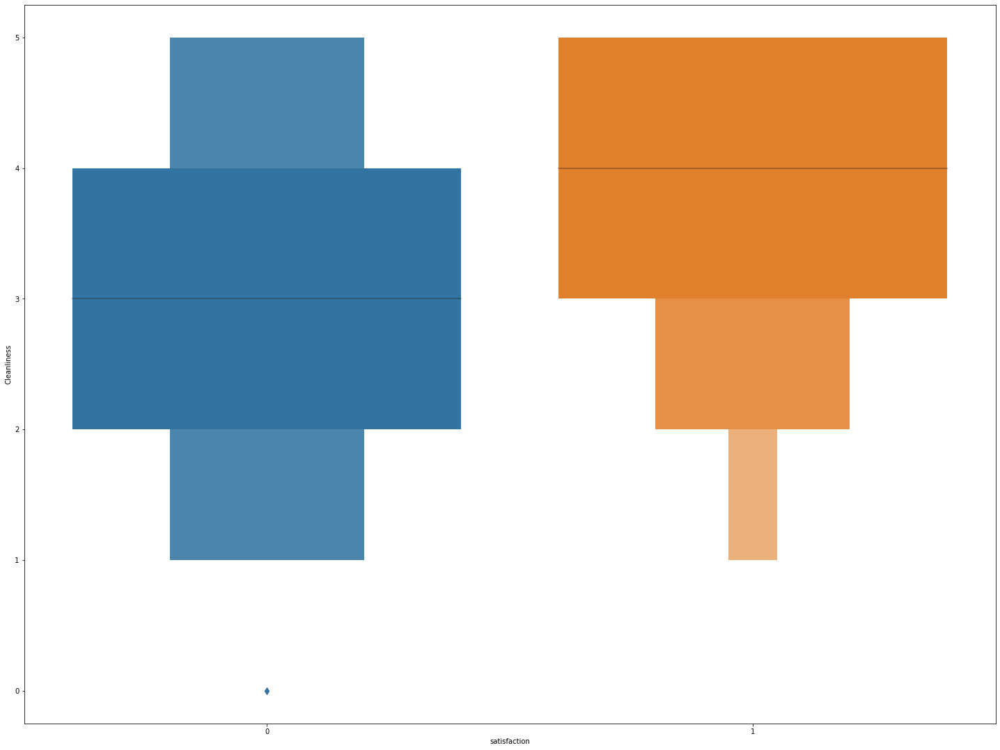

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


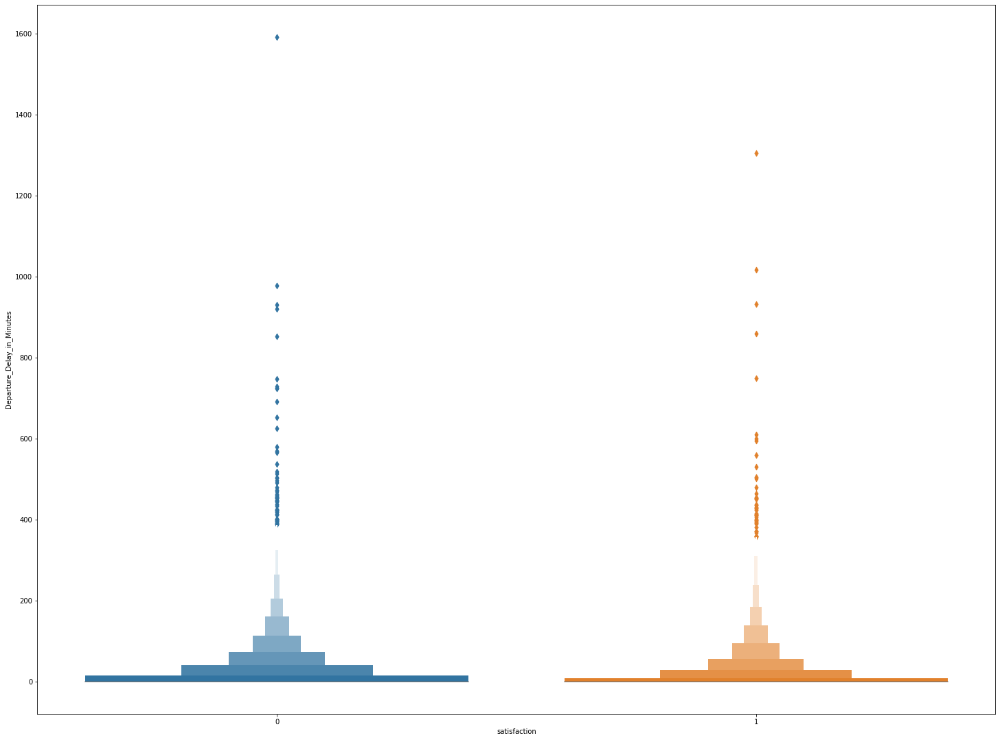

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


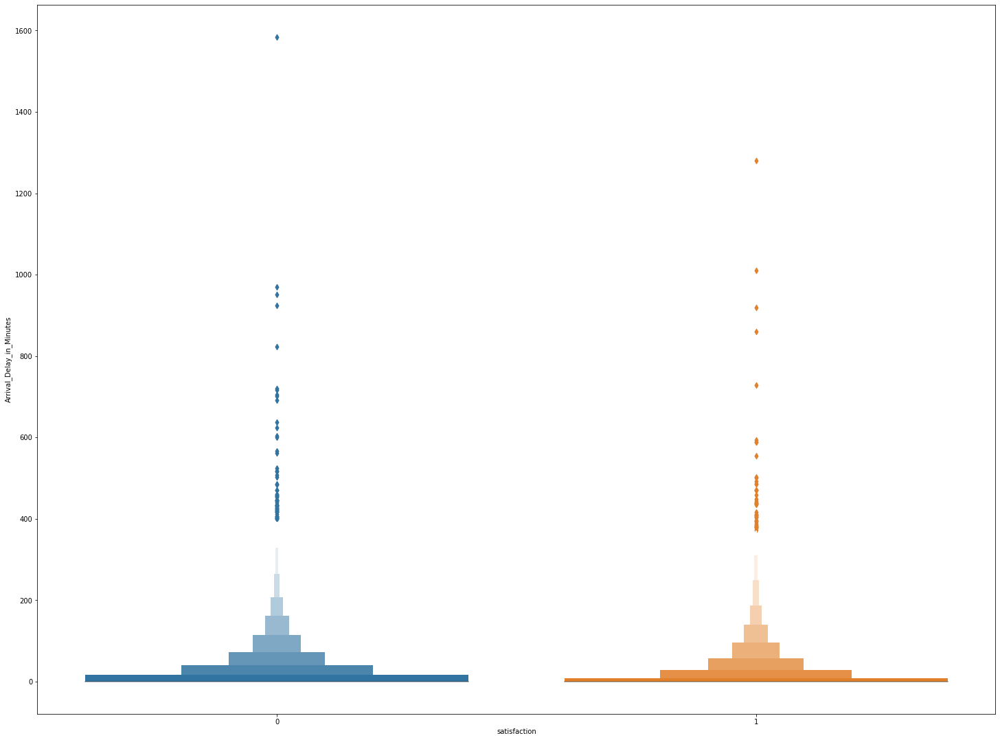

In [48]:
for i in [ 'id', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']:
    plt.figure(figsize=(25,19))
    sns.lvplot(x=df.satisfaction,y=df[i],data=df,linewidth=1)
    plt.show()

<Figure size 1800x1368 with 0 Axes>

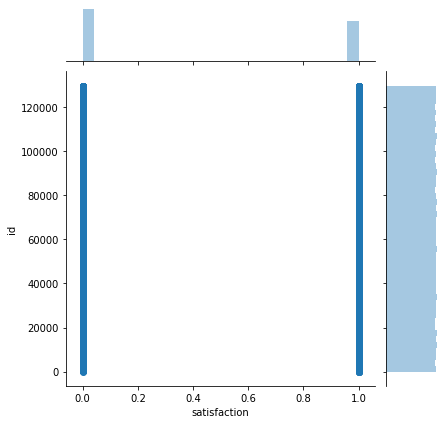

<Figure size 1800x1368 with 0 Axes>

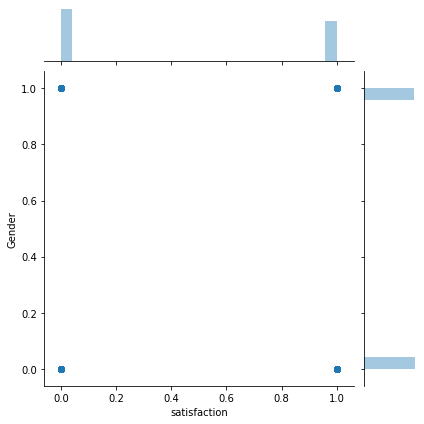

<Figure size 1800x1368 with 0 Axes>

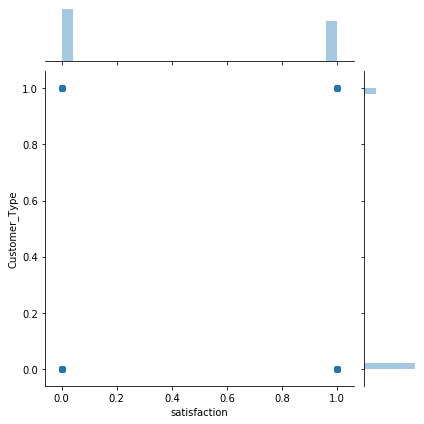

<Figure size 1800x1368 with 0 Axes>

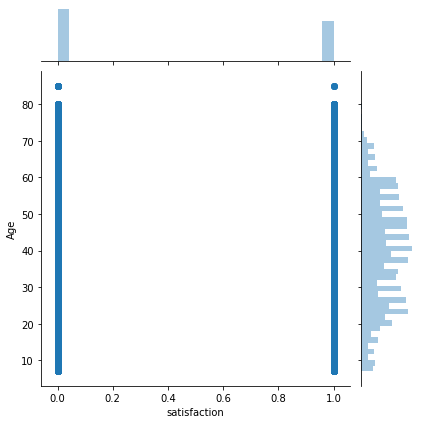

<Figure size 1800x1368 with 0 Axes>

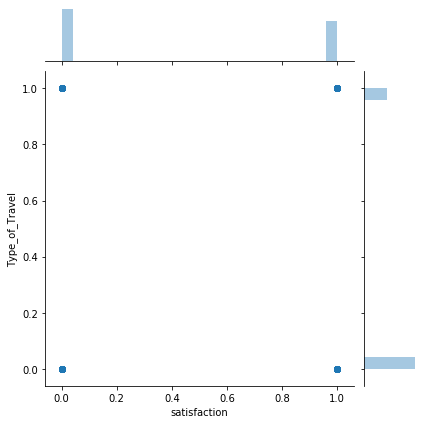

<Figure size 1800x1368 with 0 Axes>

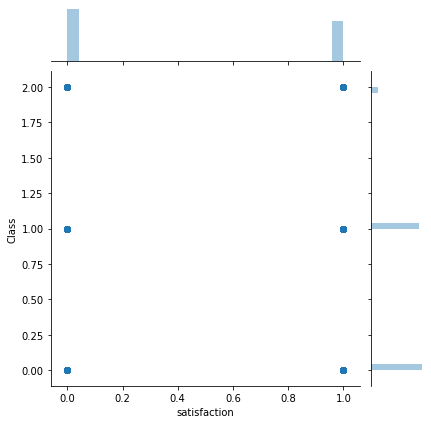

<Figure size 1800x1368 with 0 Axes>

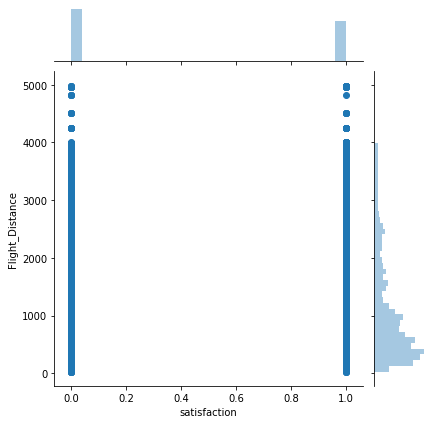

<Figure size 1800x1368 with 0 Axes>

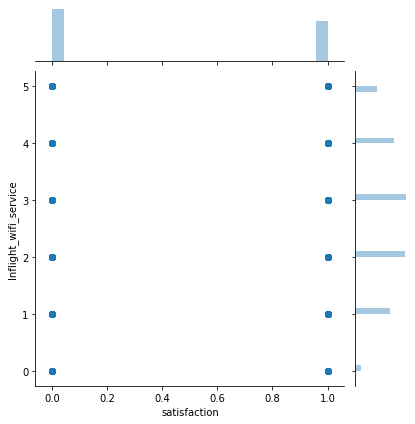

<Figure size 1800x1368 with 0 Axes>

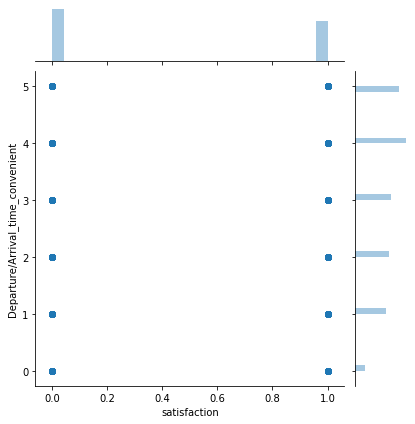

<Figure size 1800x1368 with 0 Axes>

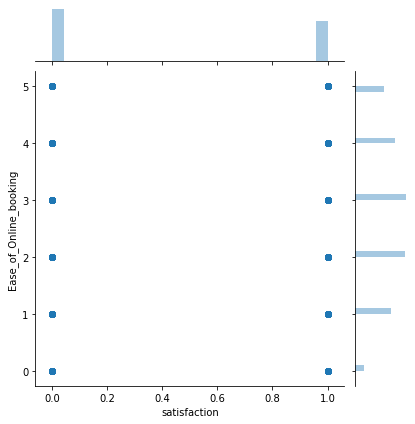

<Figure size 1800x1368 with 0 Axes>

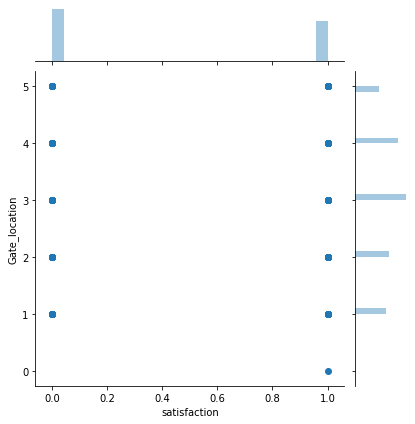

<Figure size 1800x1368 with 0 Axes>

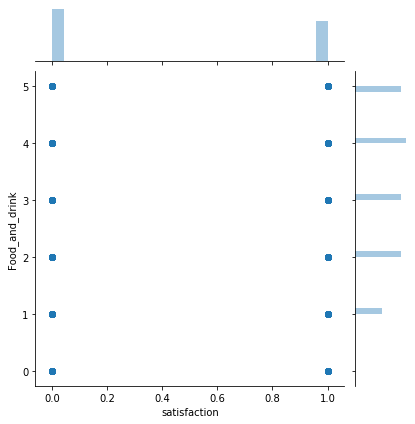

<Figure size 1800x1368 with 0 Axes>

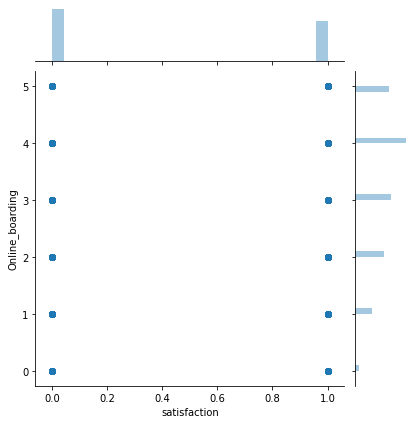

<Figure size 1800x1368 with 0 Axes>

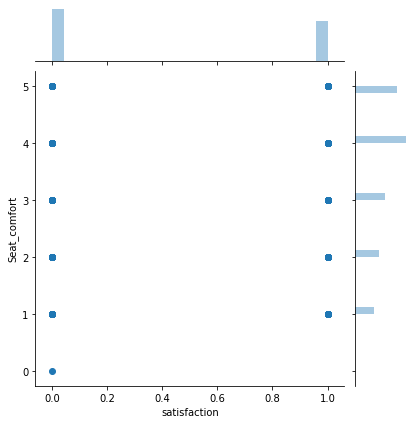

<Figure size 1800x1368 with 0 Axes>

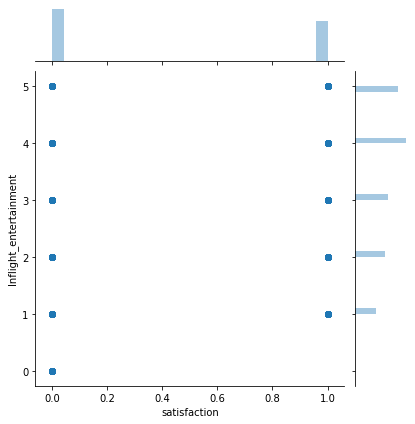

<Figure size 1800x1368 with 0 Axes>

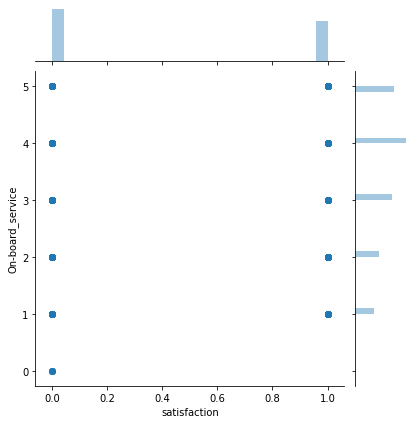

<Figure size 1800x1368 with 0 Axes>

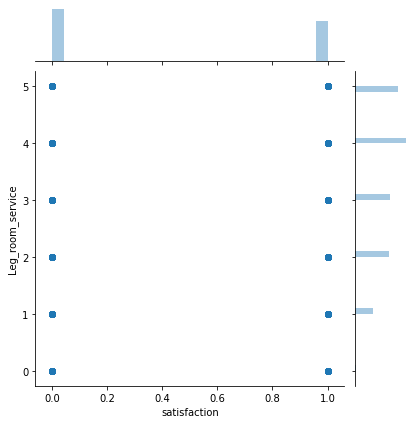

<Figure size 1800x1368 with 0 Axes>

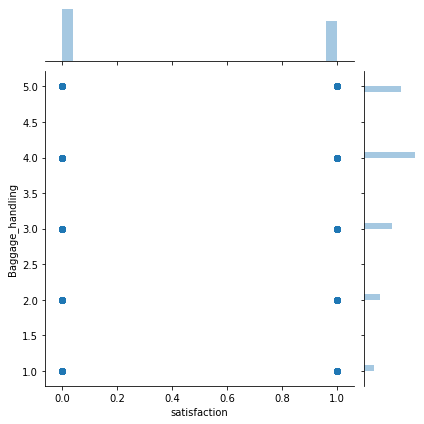

<Figure size 1800x1368 with 0 Axes>

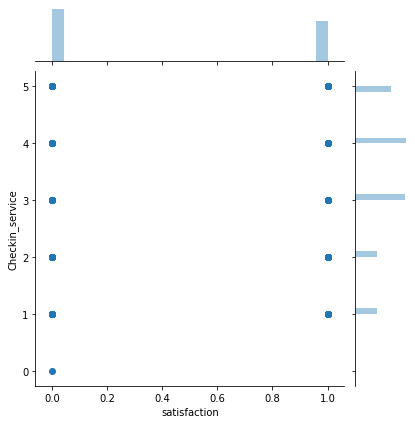

<Figure size 1800x1368 with 0 Axes>

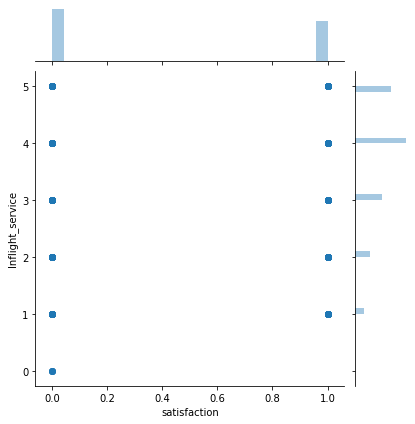

<Figure size 1800x1368 with 0 Axes>

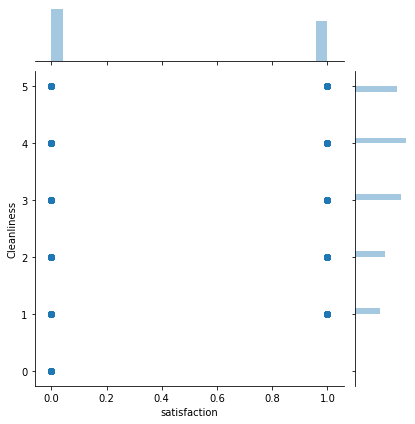

<Figure size 1800x1368 with 0 Axes>

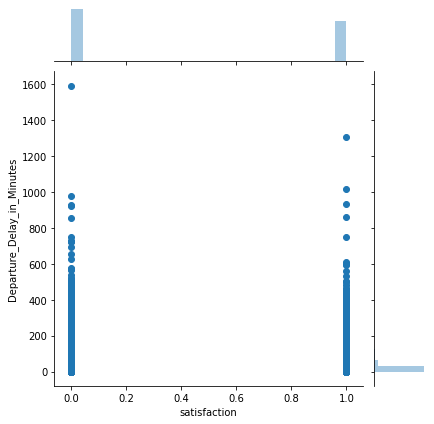

<Figure size 1800x1368 with 0 Axes>

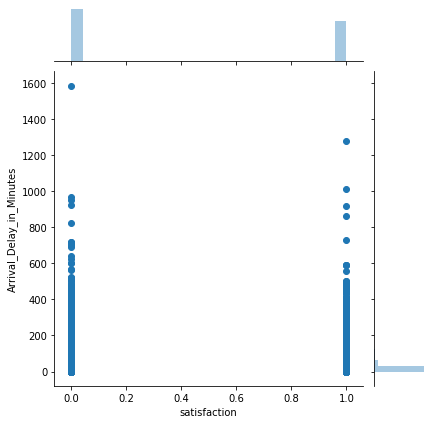

In [49]:
for i in [ 'id', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']:
    plt.figure(figsize=(25,19))
    sns.jointplot(x=df.satisfaction,y=df[i],data=df,linewidth=1)
    plt.show()

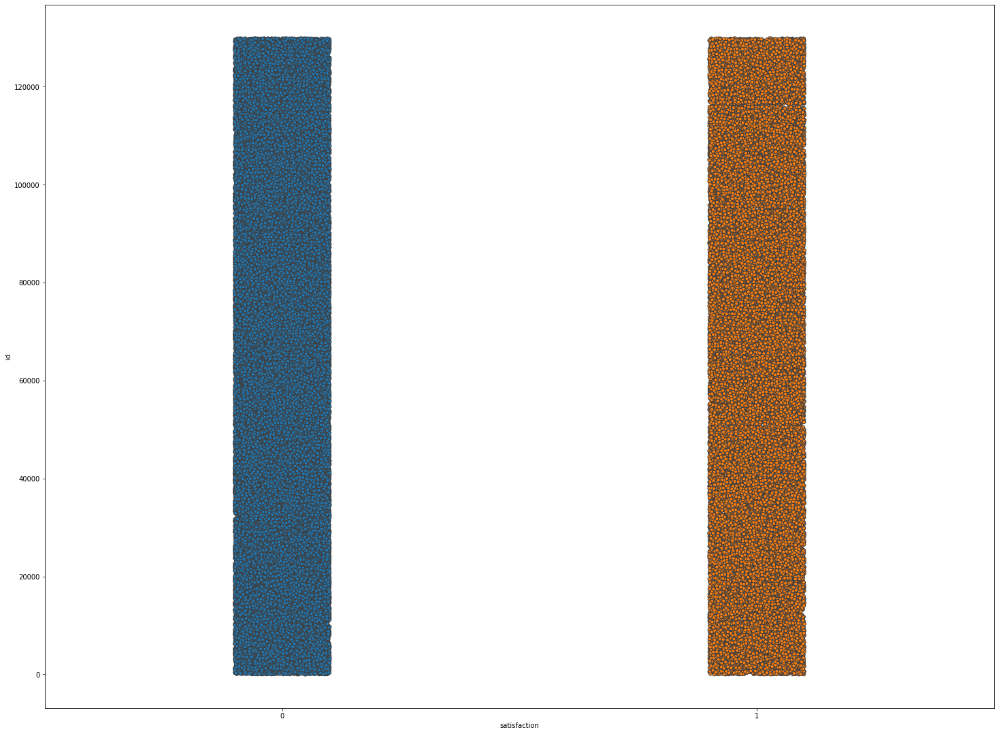

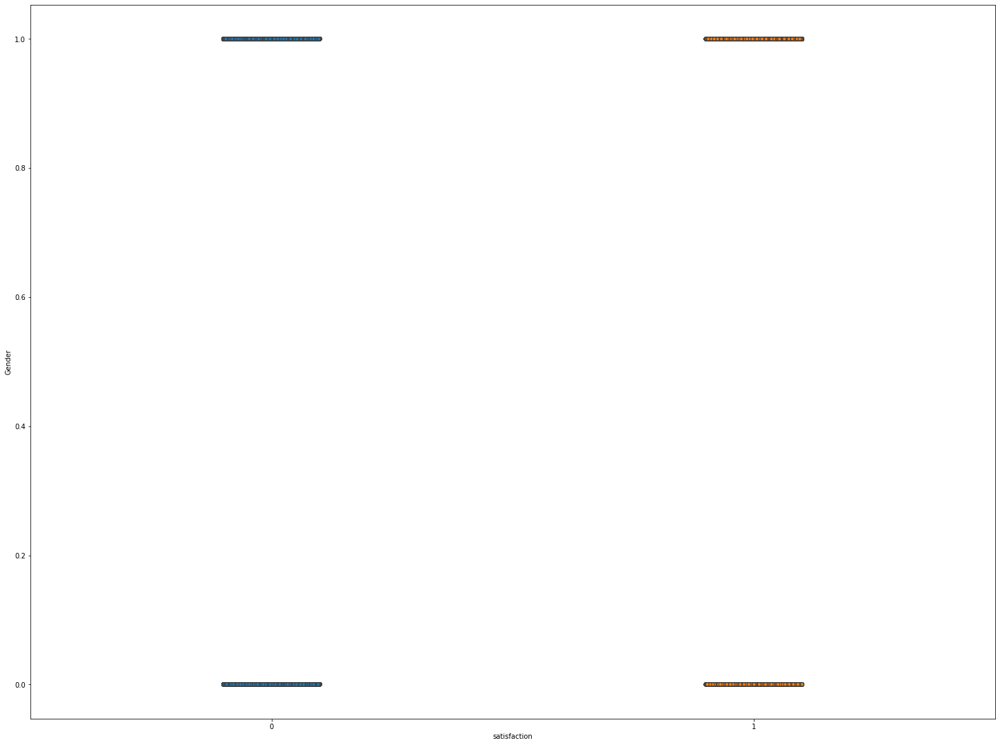

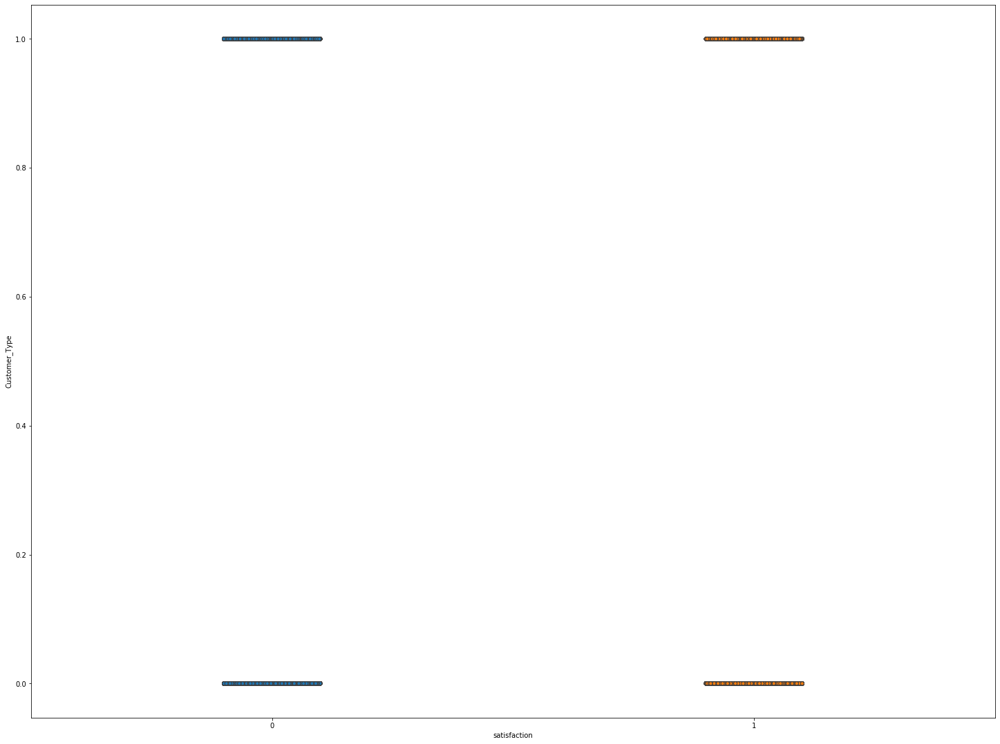

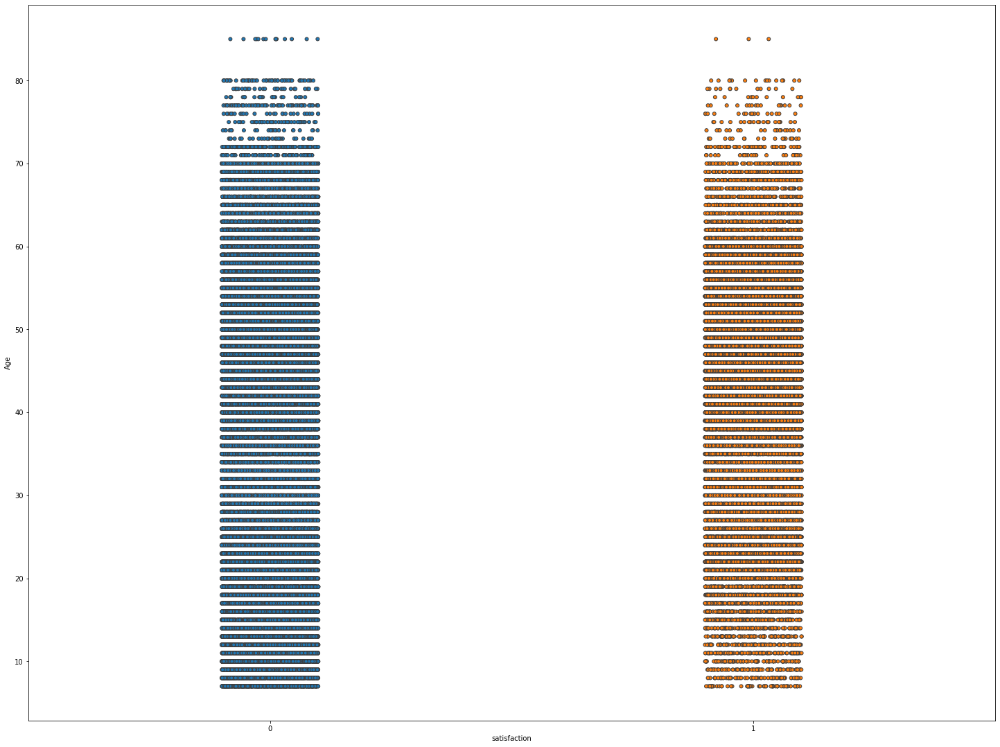

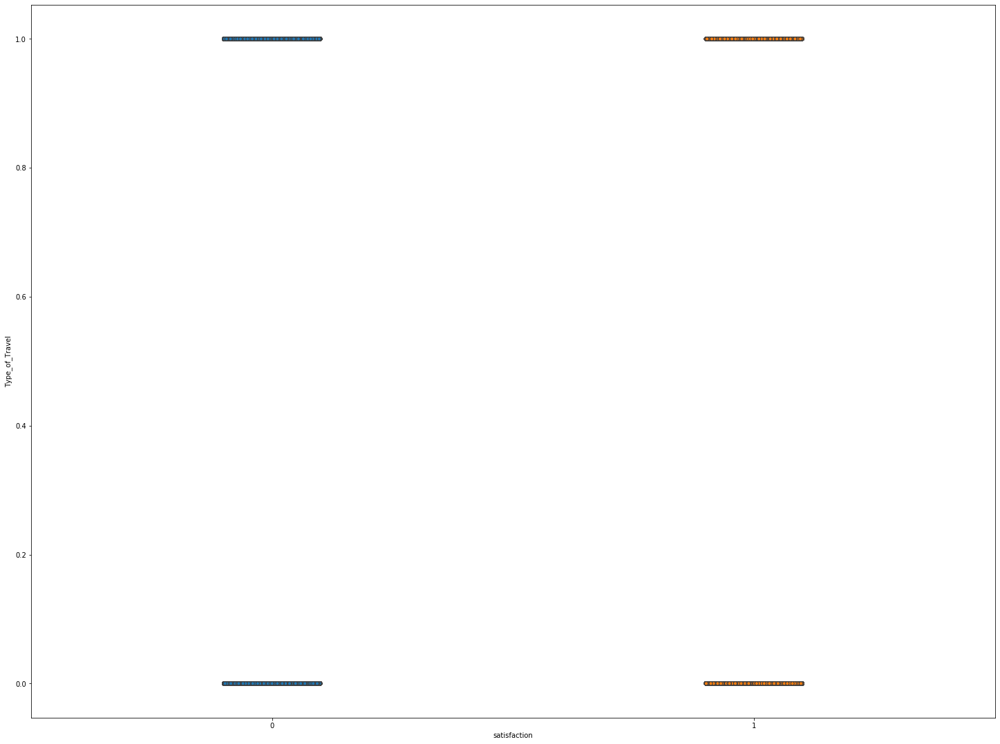

...

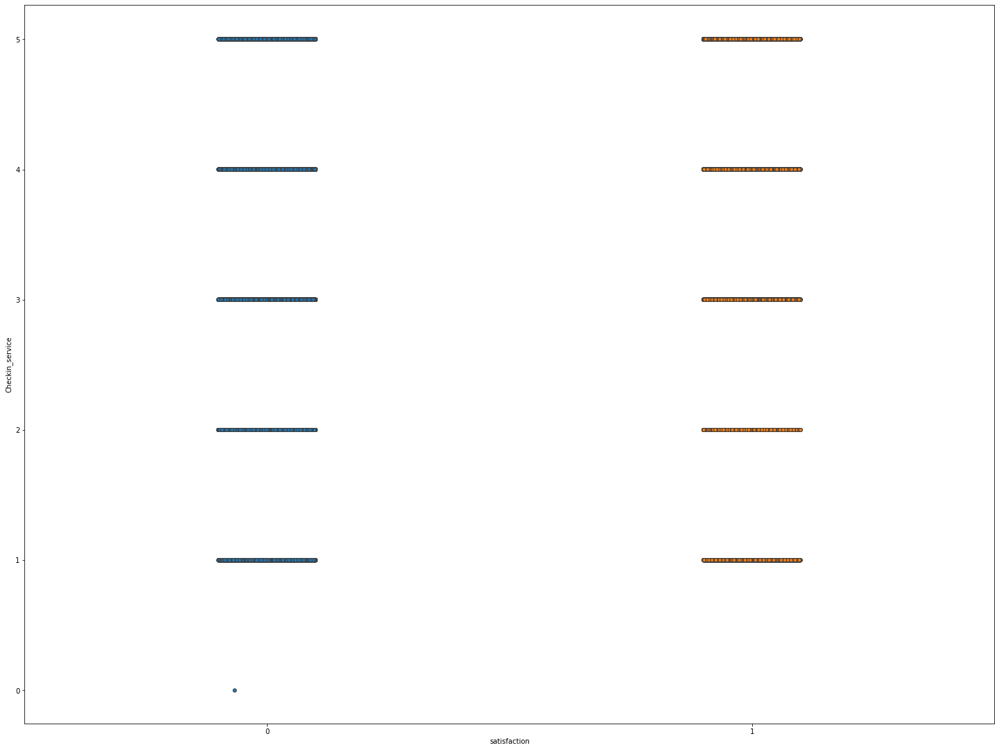

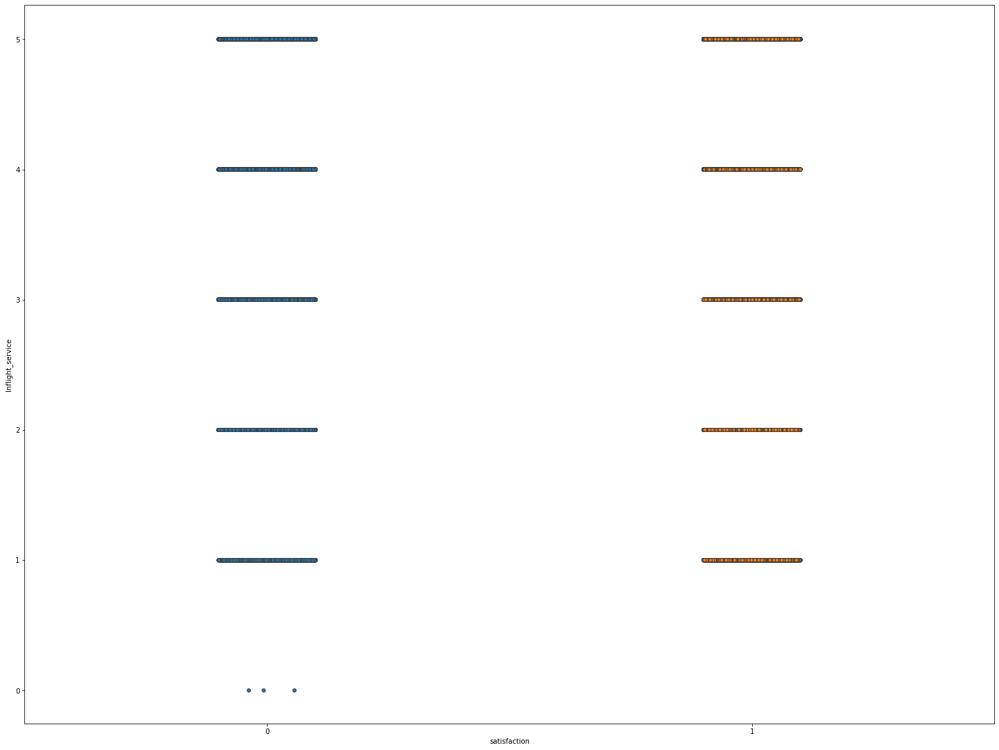

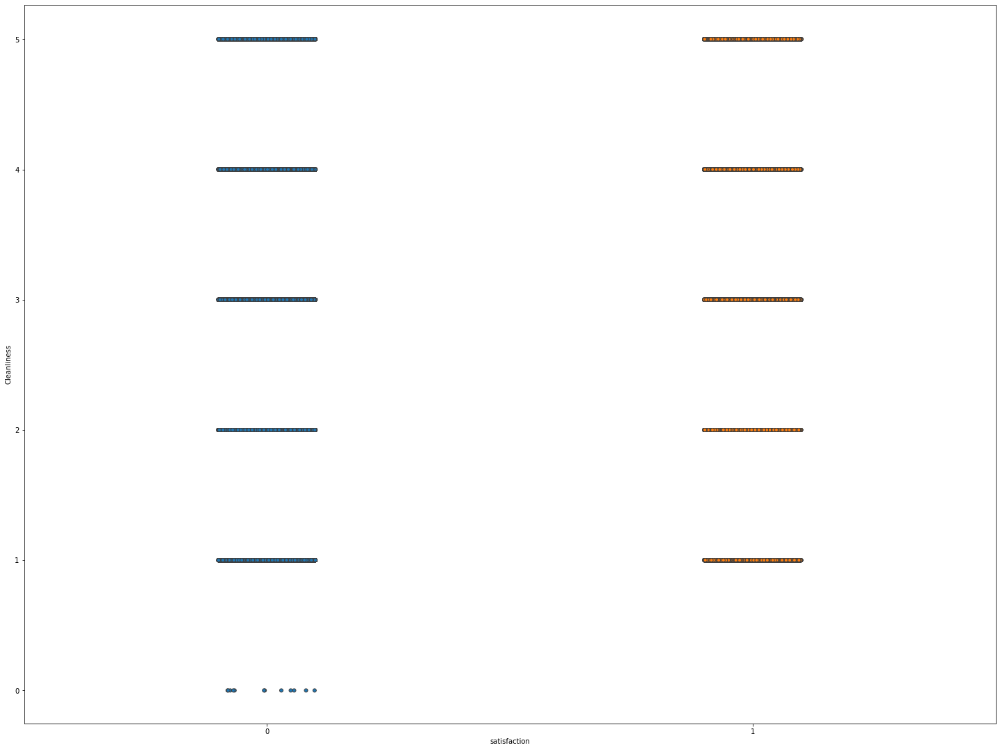

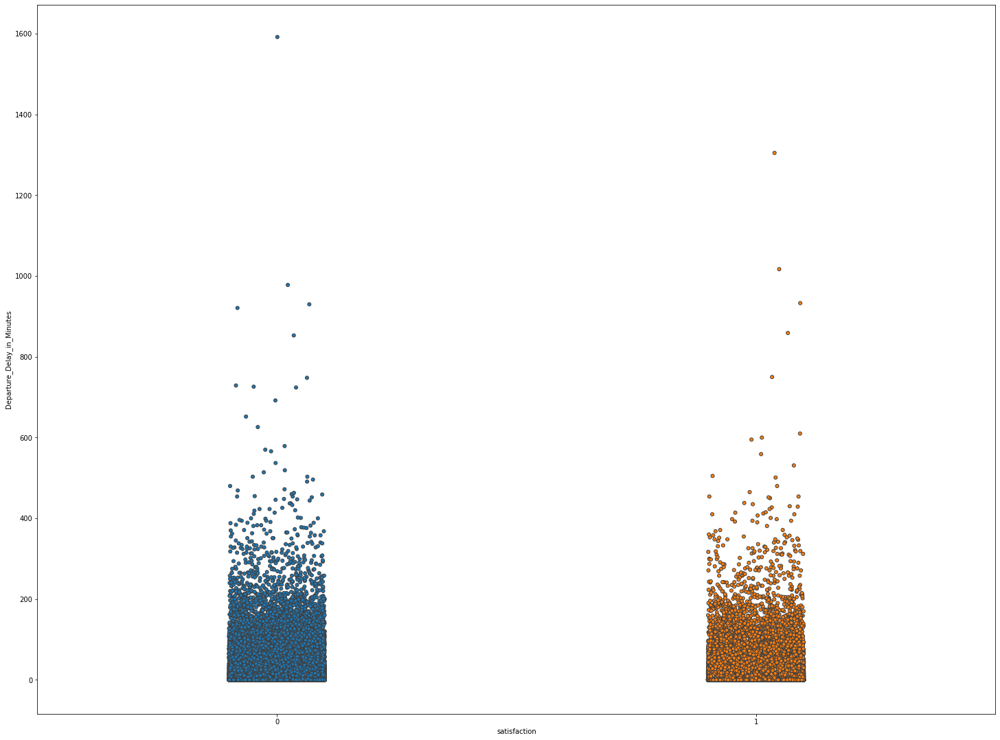

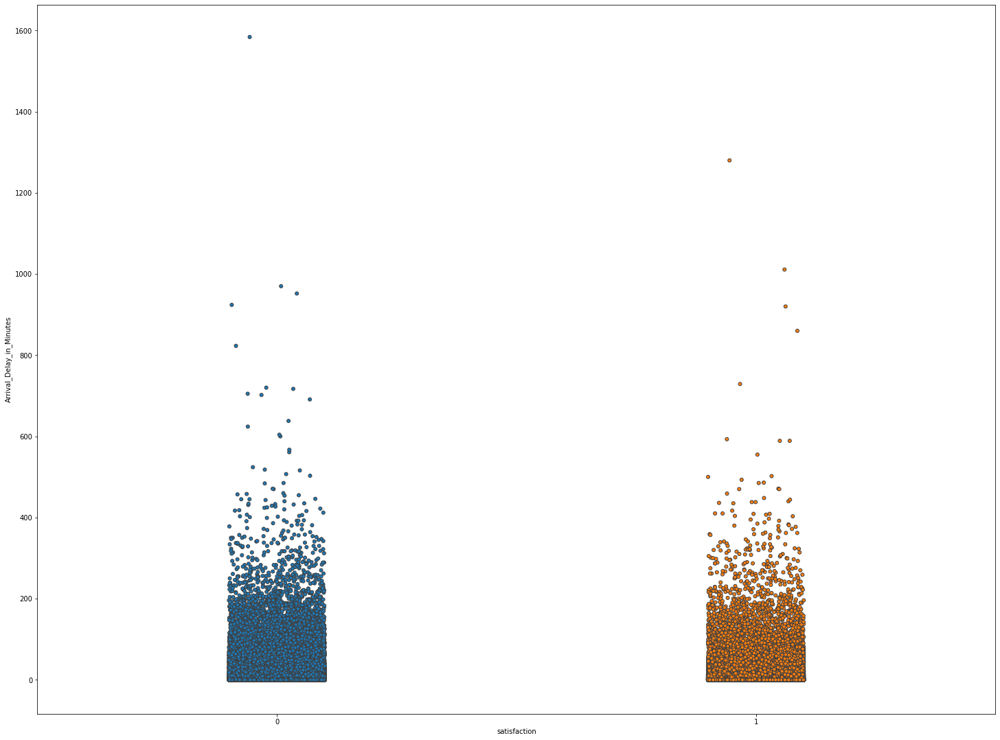

In [51]:
for i in [ 'id', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']:
    plt.figure(figsize=(25,19))
    sns.stripplot(x=df.satisfaction,y=df[i],data=df,linewidth=1)
    plt.show()

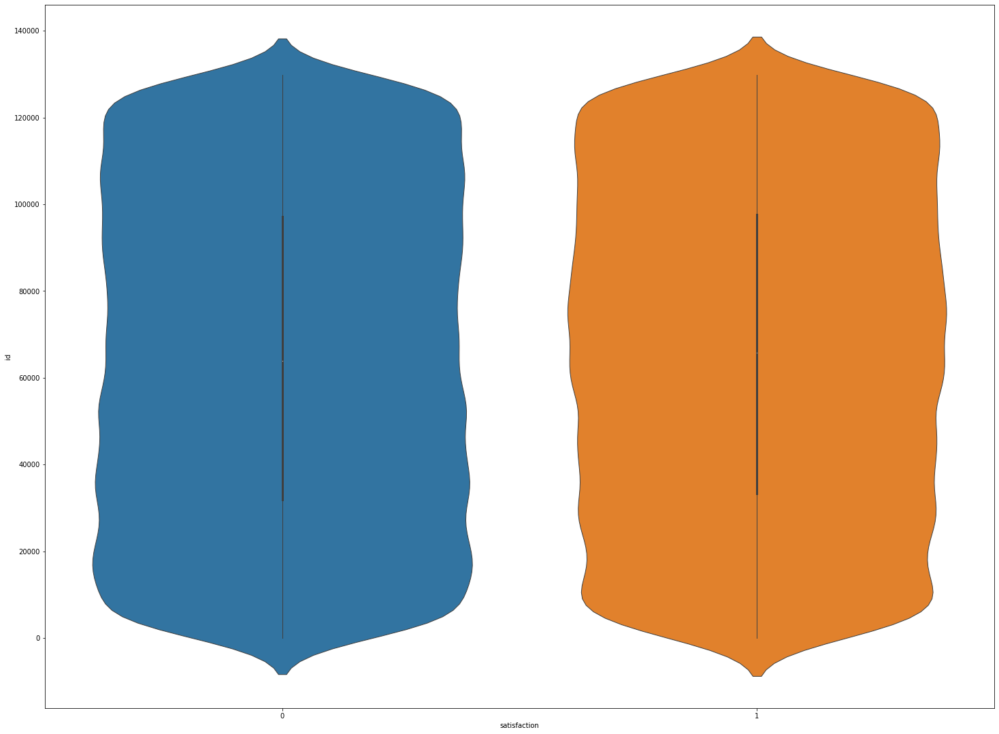

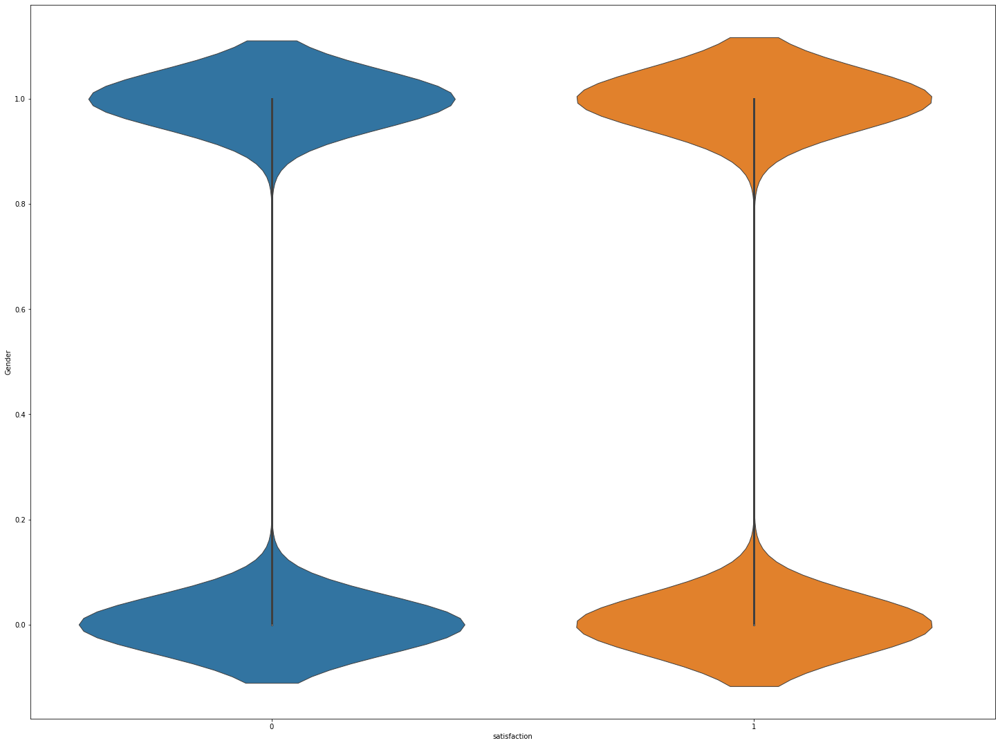

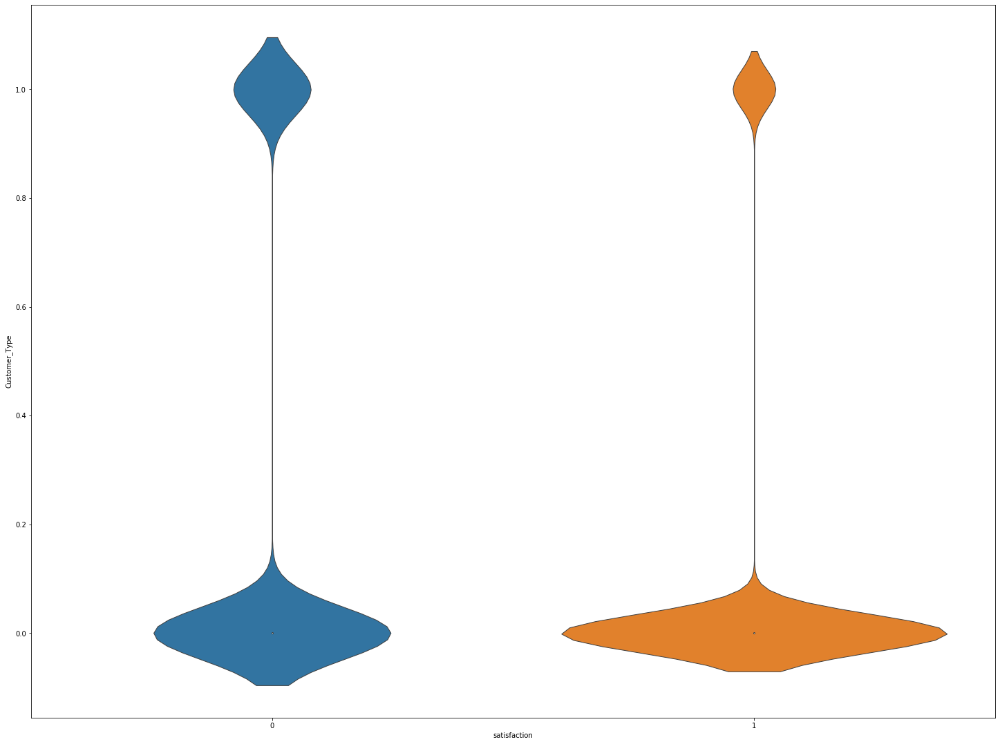

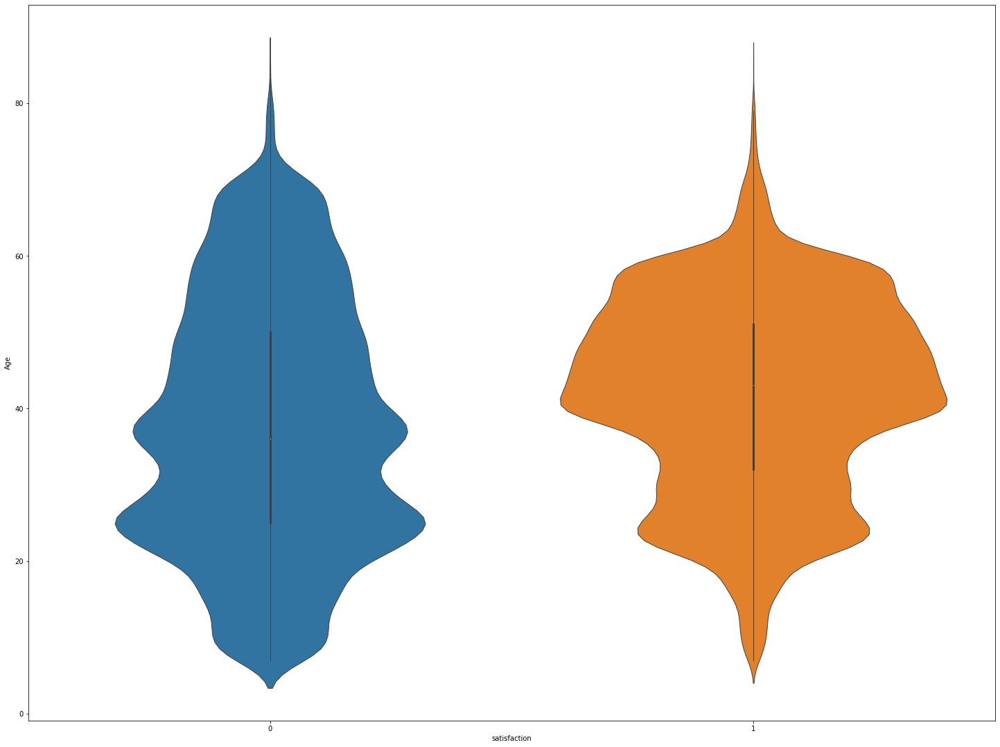

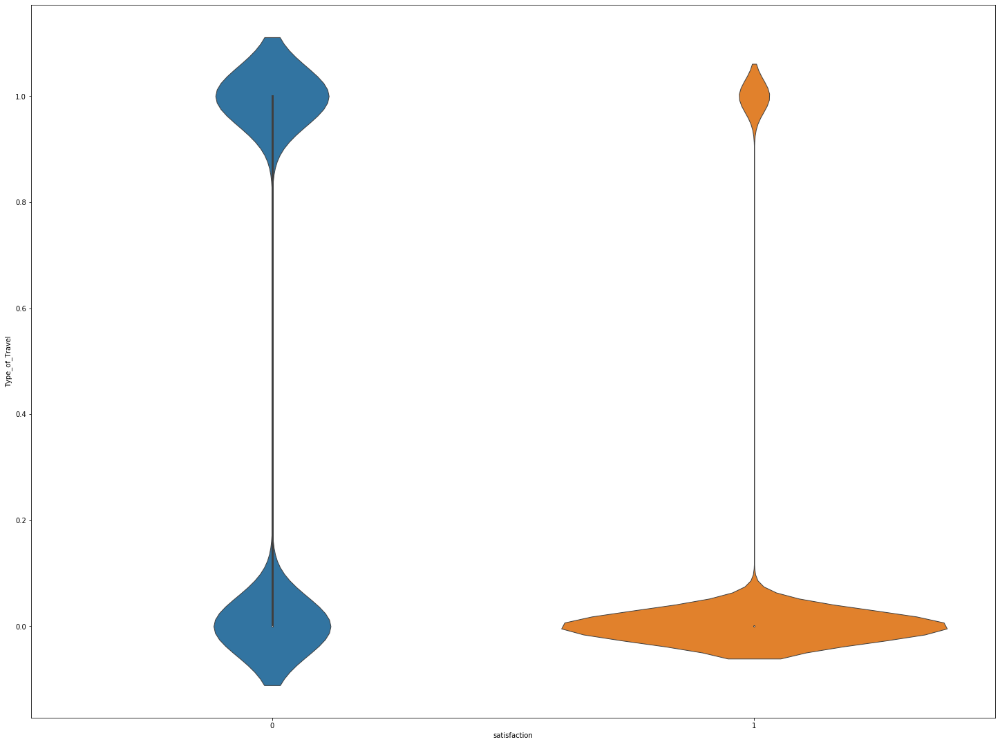

...

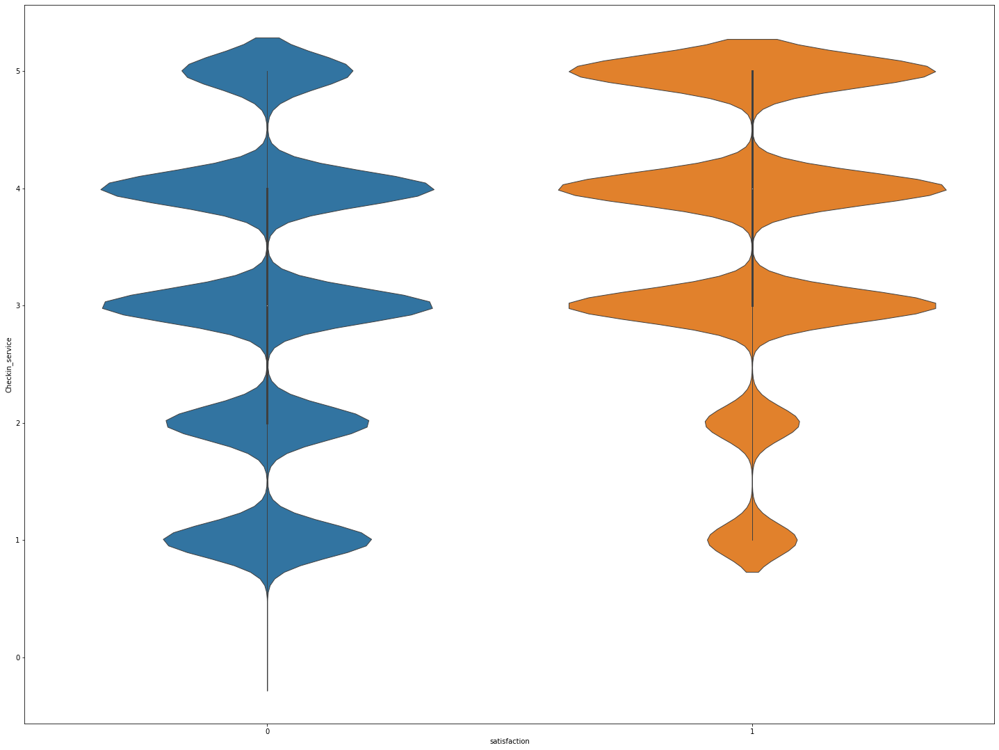

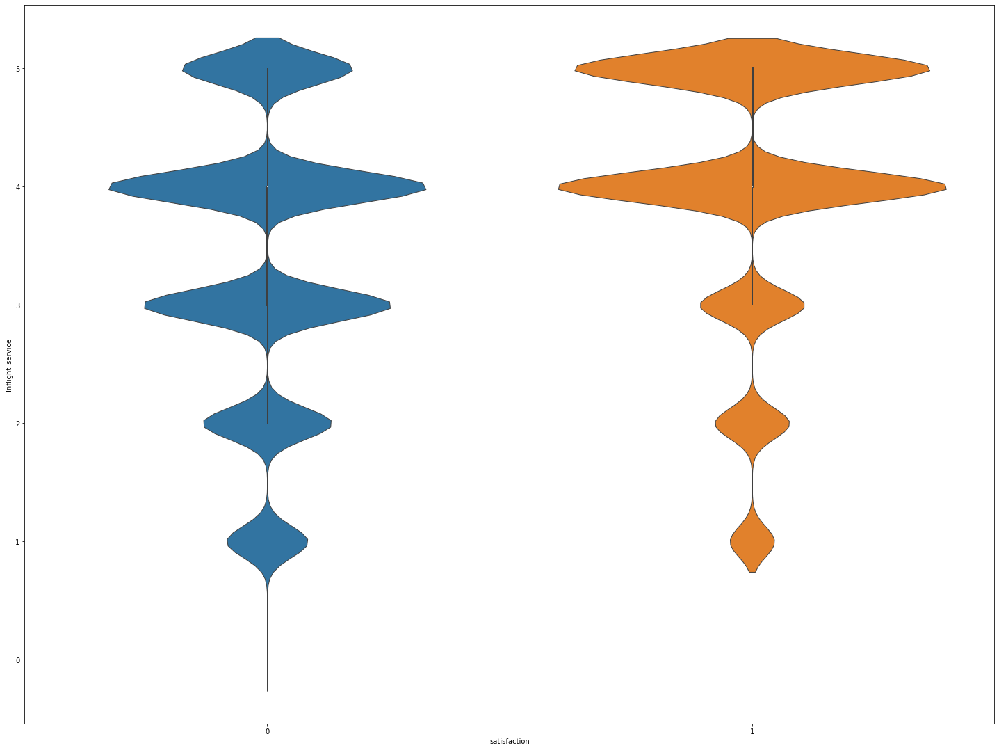

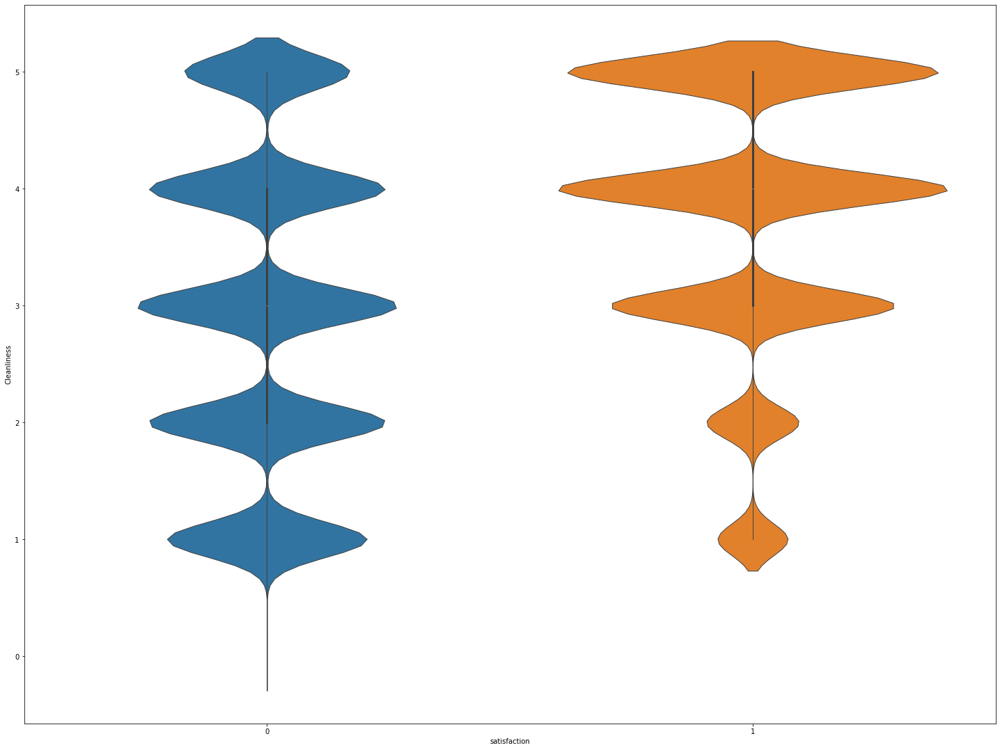

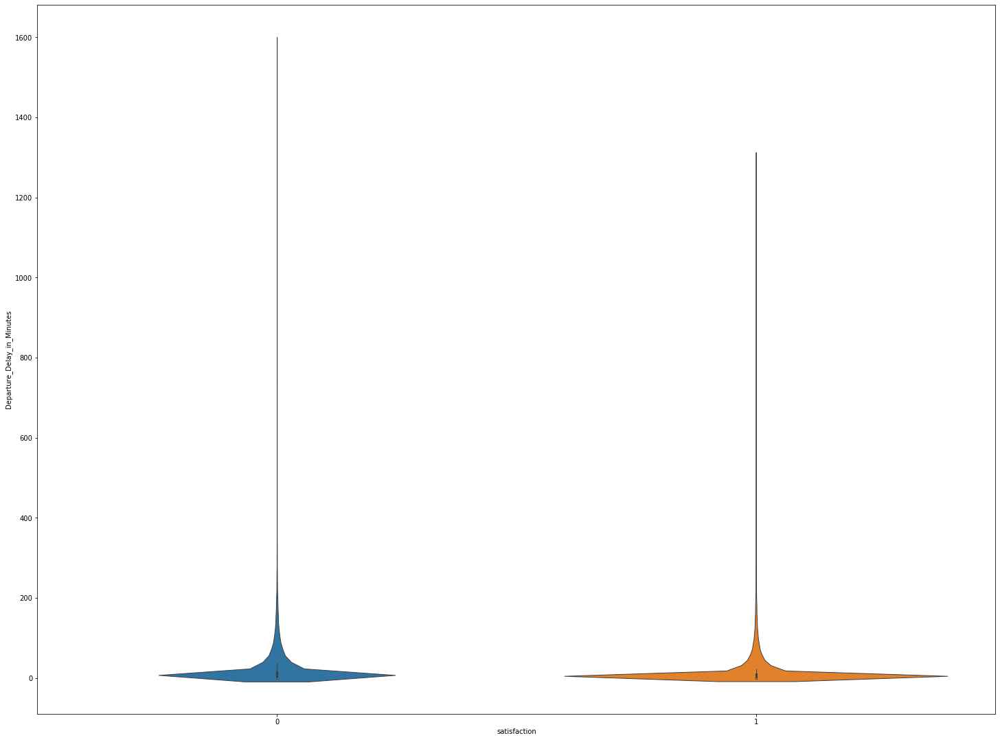

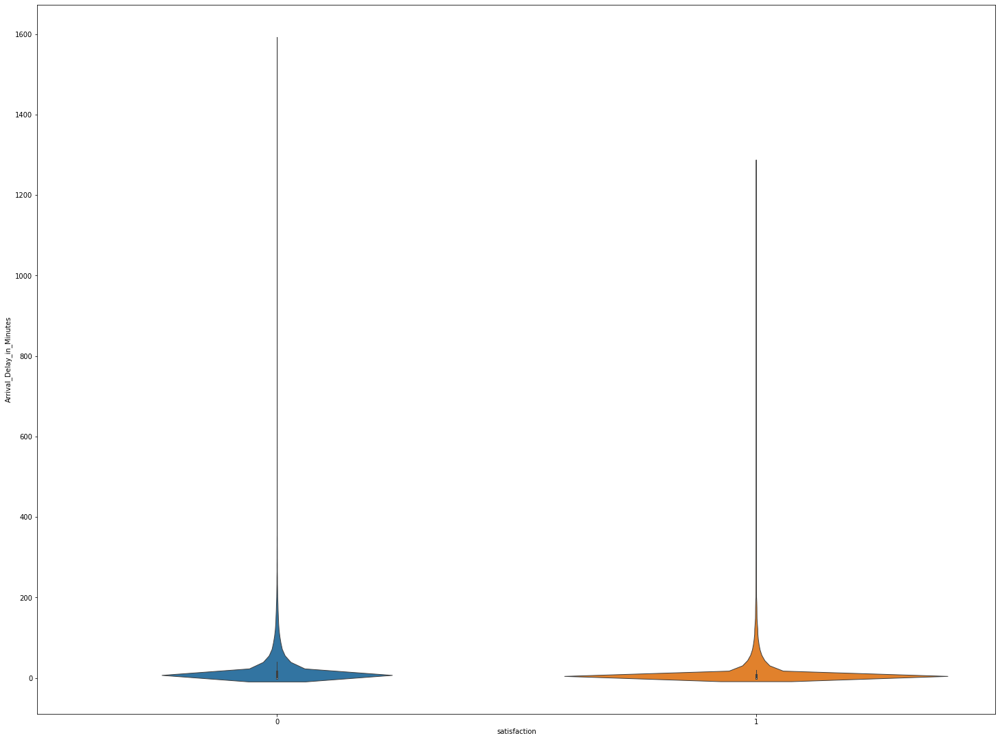

In [52]:
for i in [ 'id', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']:
    plt.figure(figsize=(25,19))
    sns.violinplot(x=df.satisfaction,y=df[i],data=df,linewidth=1)
    plt.show()

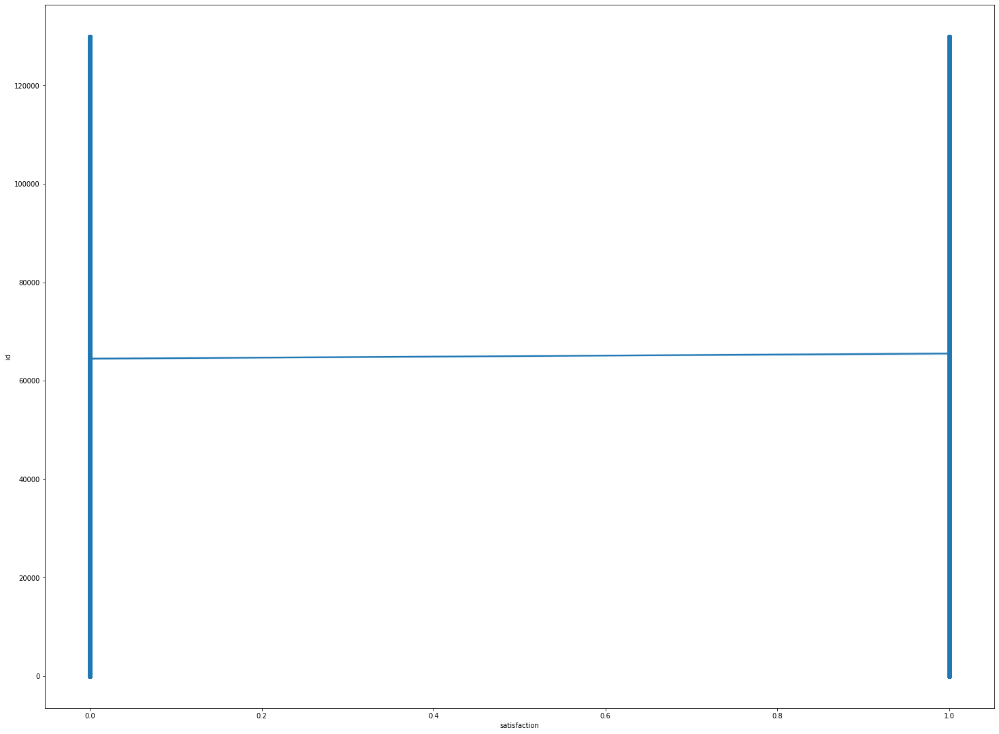

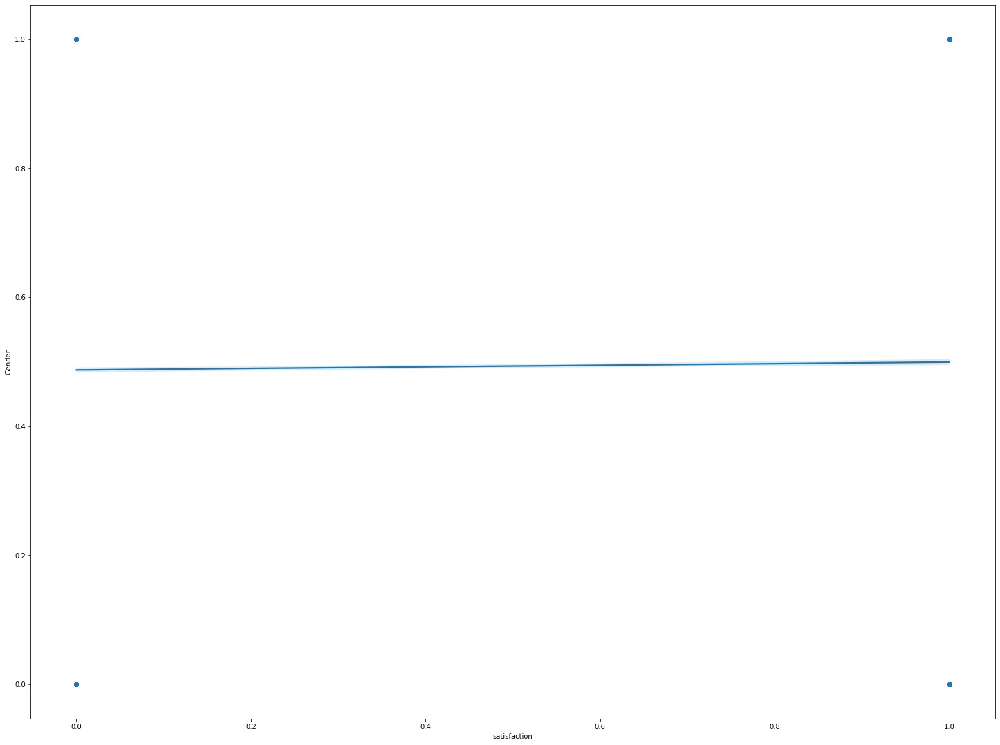

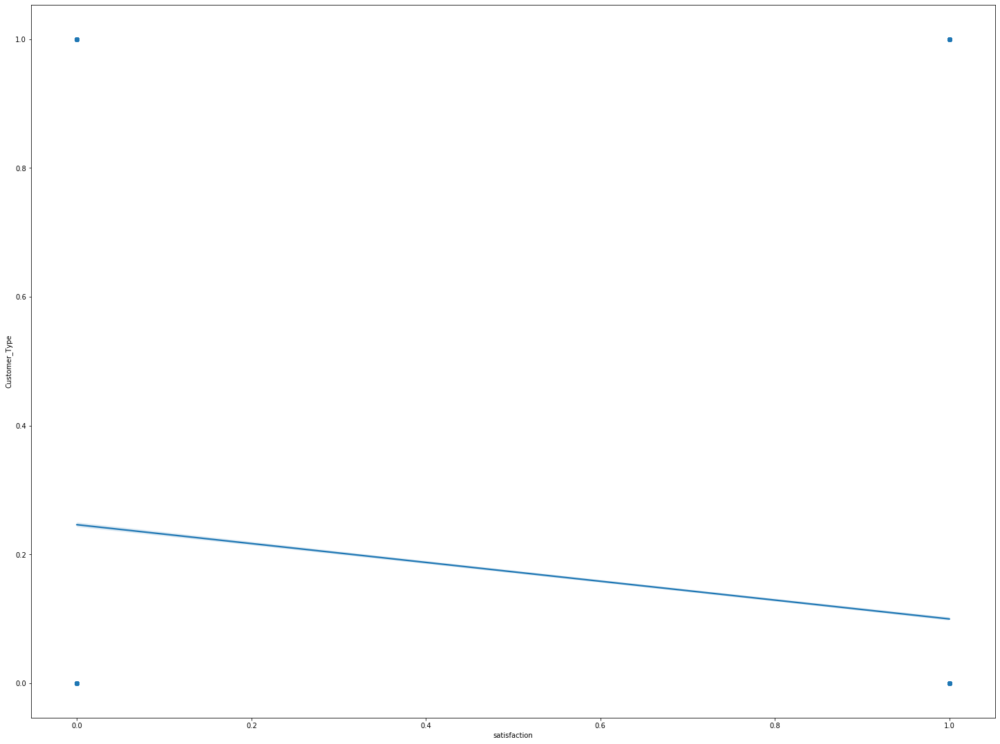

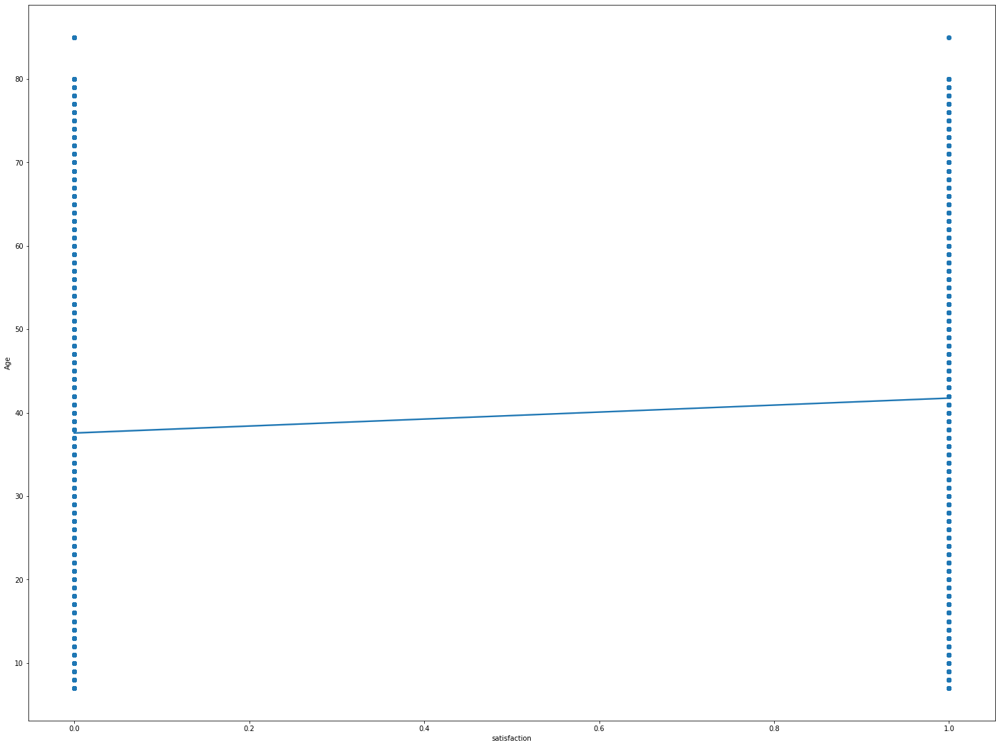

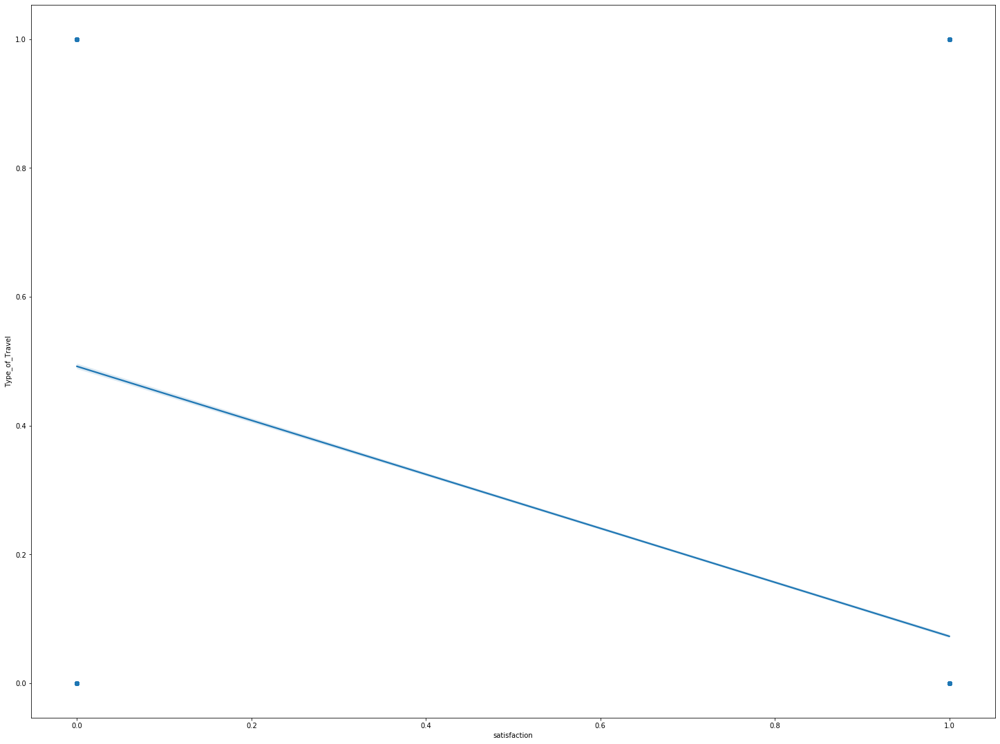

...

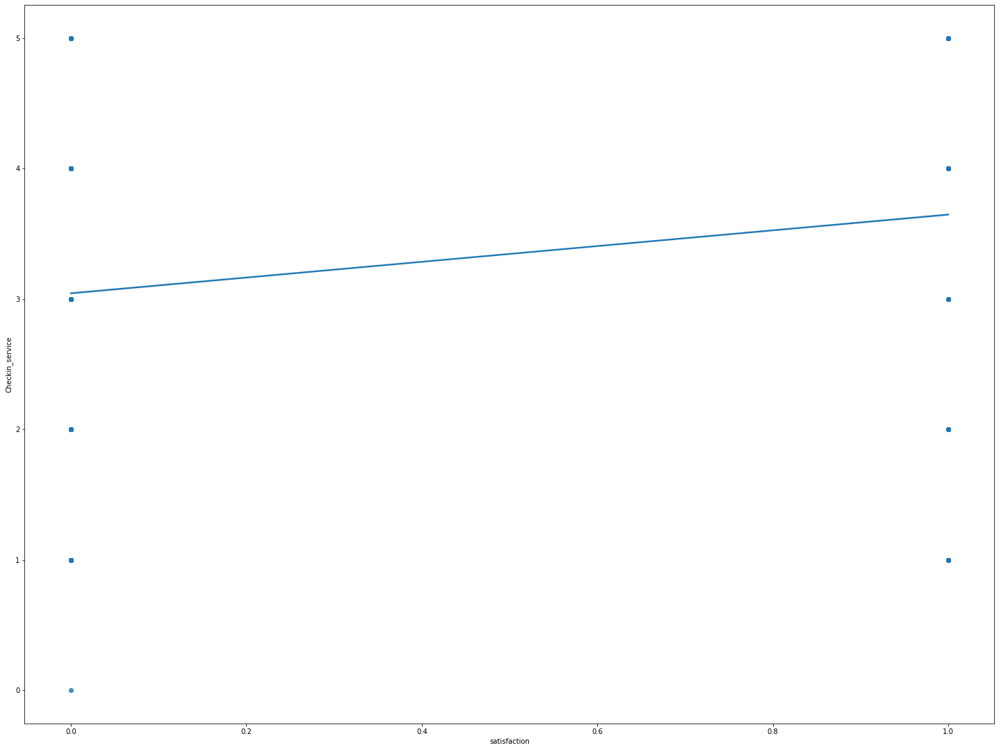

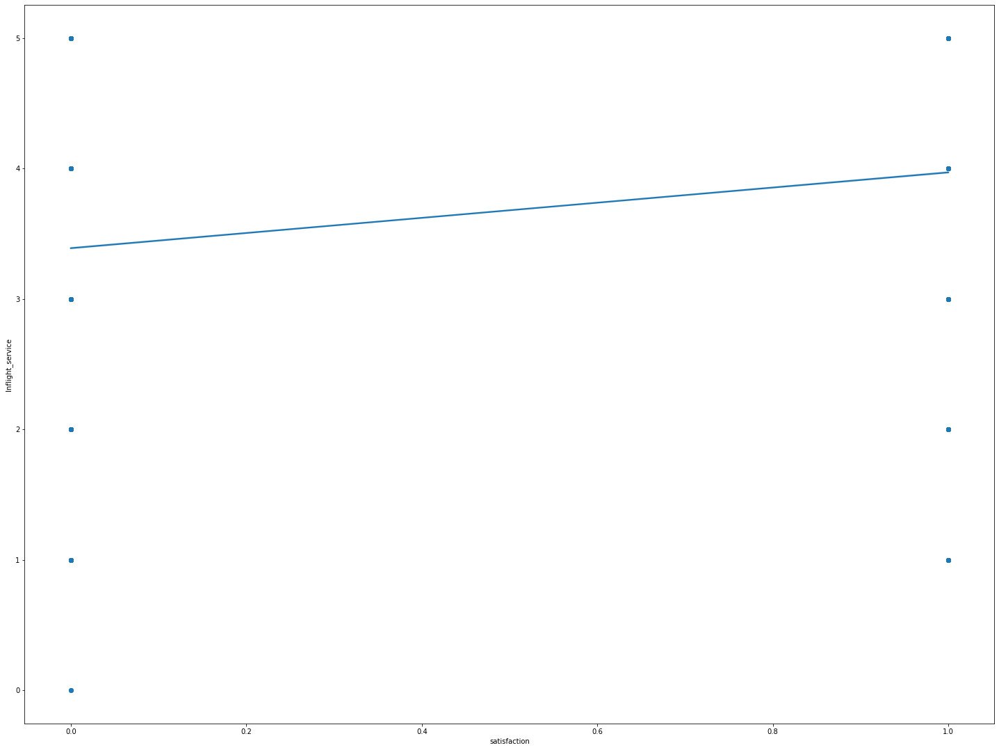

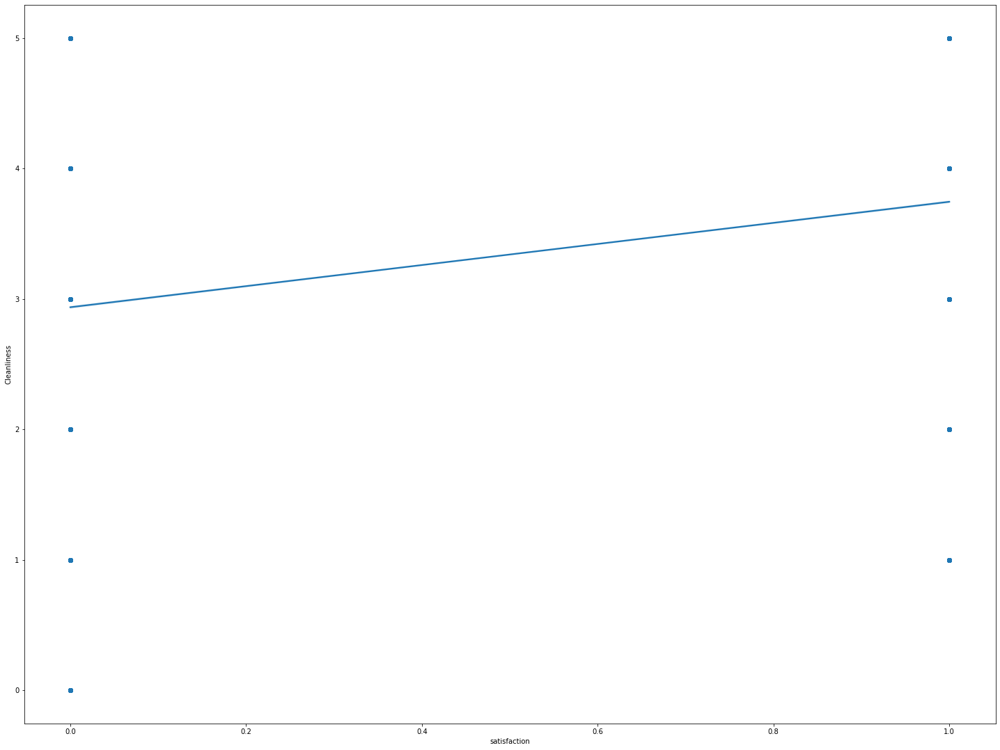

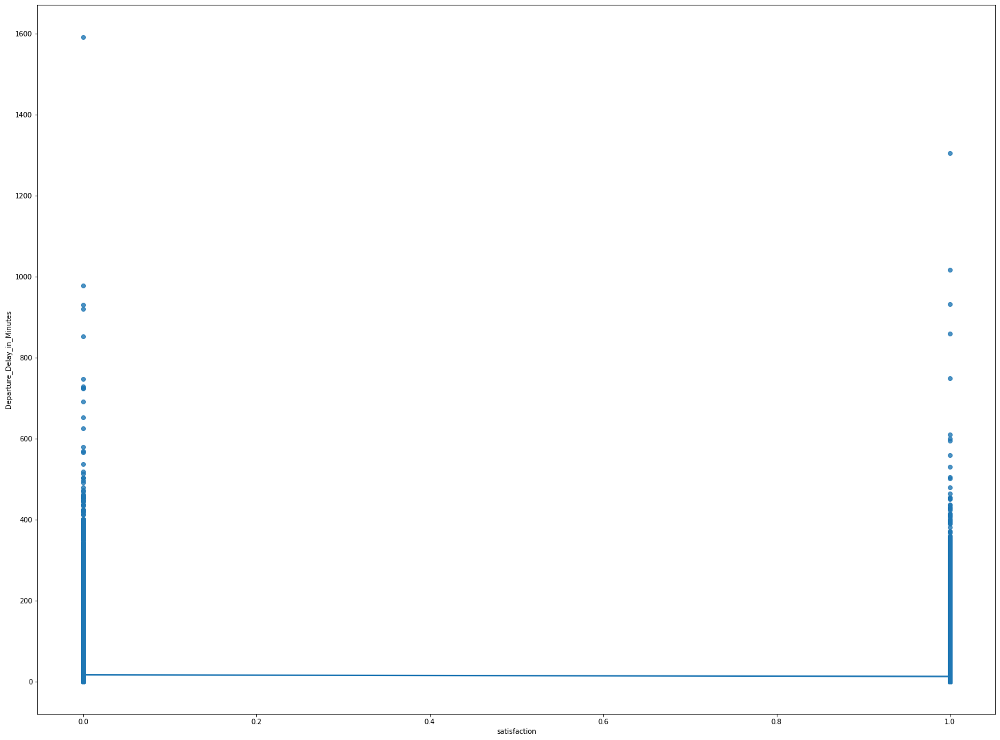

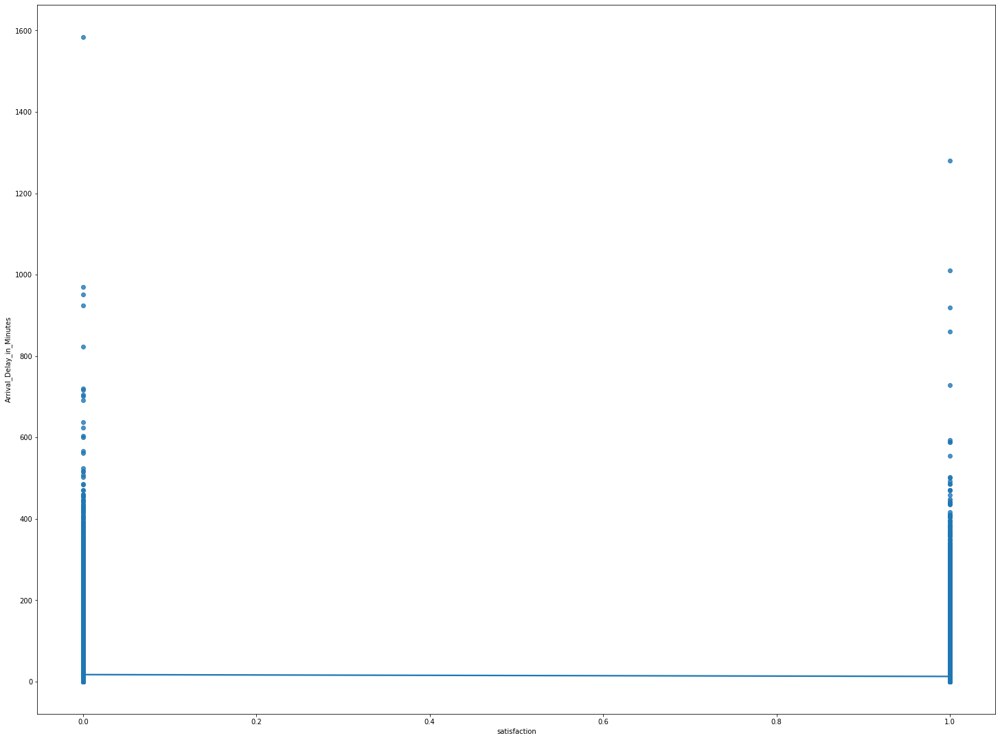

In [54]:
for i in [ 'id', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']:
    plt.figure(figsize=(25,19))
    sns.regplot(x=df.satisfaction,y=df[i],data=df)
    plt.show()

In [57]:
df.columns

Index(['SR', 'id', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',
       'satisfaction'],
      dtype='object')

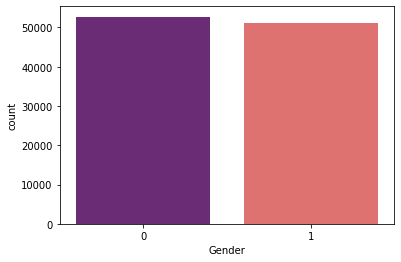

In [61]:
sns.countplot(x='Gender',data=df,palette='magma')

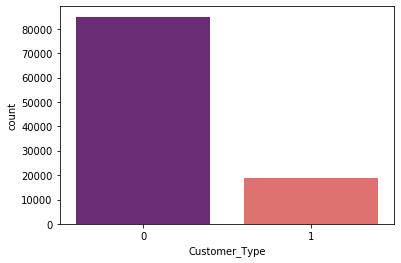

In [62]:
sns.countplot(x='Customer_Type',data=df,palette='magma')

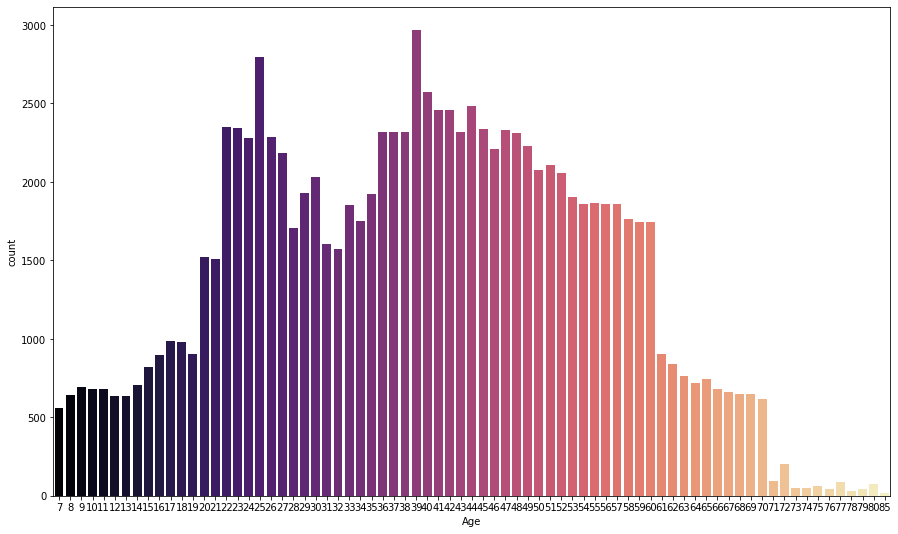

In [64]:
plt.figure(figsize=(15,9))
sns.countplot(x='Age',data=df,palette='magma')

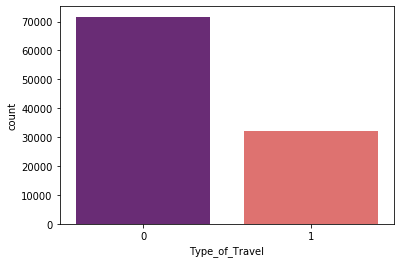

In [65]:
sns.countplot(x='Type_of_Travel',data=df,palette='magma')

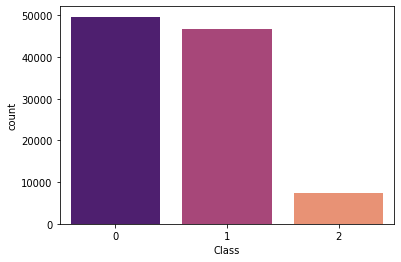

In [66]:
sns.countplot(x='Class',data=df,palette='magma')

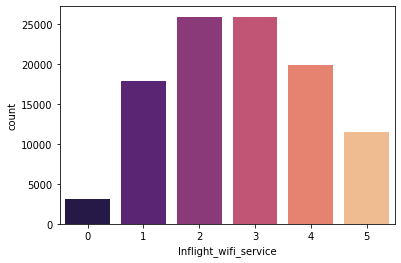

In [68]:
sns.countplot(x='Inflight_wifi_service',data=df,palette='magma')

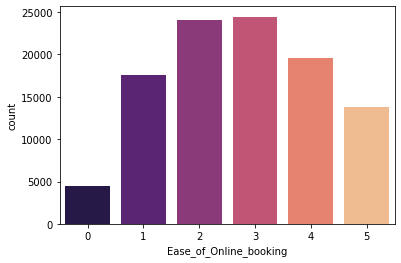

In [69]:
sns.countplot(x='Ease_of_Online_booking',data=df,palette='magma')

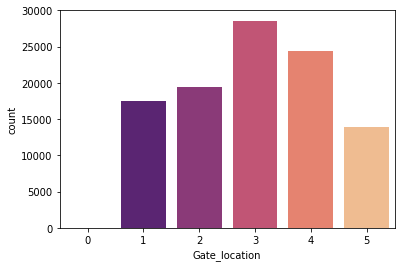

In [70]:
sns.countplot(x='Gate_location',data=df,palette='magma')

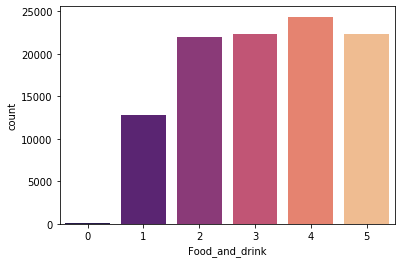

In [71]:
sns.countplot(x='Food_and_drink',data=df,palette='magma')

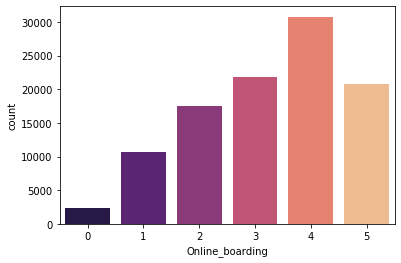

In [72]:
sns.countplot(x='Online_boarding',data=df,palette='magma')

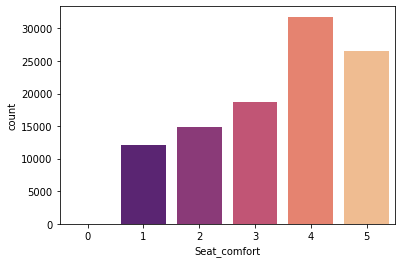

In [73]:
sns.countplot(x='Seat_comfort',data=df,palette='magma')

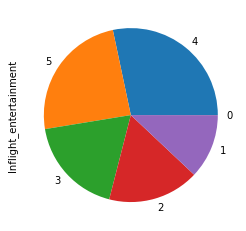

In [74]:
df.Inflight_entertainment.value_counts().plot(kind='pie')

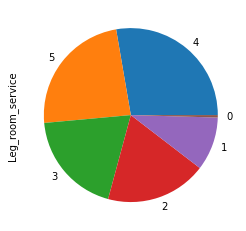

In [76]:
df.Leg_room_service.value_counts().plot(kind='pie')

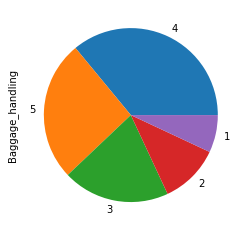

In [77]:
df.Baggage_handling.value_counts().plot(kind='pie')

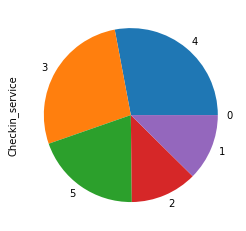

In [78]:
df.Checkin_service.value_counts().plot(kind='pie')

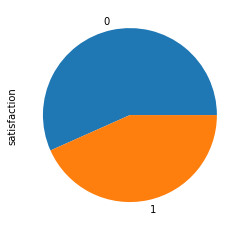

In [79]:
df.satisfaction.value_counts().plot(kind='pie')

In [80]:
df.columns

Index(['SR', 'id', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',
       'satisfaction'],
      dtype='object')

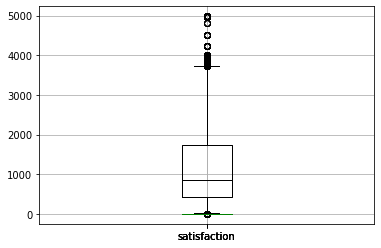

In [81]:
df.boxplot(column="Gender")
df.boxplot(column="Customer_Type",color='orange')
df.boxplot(column="Flight_Distance",color='black')
df.boxplot(column="satisfaction",color='green')

In [82]:
import sweetviz as sv

In [83]:
data=sv.analyze(df)
data.show_html('Analyze.html')

                                             |                                             | [  0%]   00:00 ->…

Report Analyze.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [84]:
from IPython.display import IFrame

In [85]:
IFrame(src='Analyze.html',width=1000,height=600)

In [86]:
df.skew()

SR                                   0.000000
id                                   0.002864
Gender                               0.029839
Customer_Type                        1.642465
Age                                 -0.004516
Type_of_Travel                       0.819761
Class                                0.544371
Flight_Distance                      1.109466
Inflight_wifi_service                0.040408
Departure/Arrival_time_convenient   -0.334399
Ease_of_Online_booking              -0.018294
Gate_location                       -0.058889
Food_and_drink                      -0.151279
Online_boarding                     -0.453852
Seat_comfort                        -0.482775
Inflight_entertainment              -0.365131
On-board_service                    -0.420031
Leg_room_service                    -0.350231
Baggage_handling                    -0.677040
Checkin_service                     -0.364982
Inflight_service                    -0.690314
Cleanliness                       

In [87]:
attFeatures = []
for i in df.columns:
    attFeatures.append([i, df[i].nunique(), df[i].drop_duplicates().values])
pd.DataFrame(attFeatures, columns = ['Features', 'Unique Number', 'Values'])

,Features,Unique Number,Values
0,SR,103904,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
1,id,103904,"[70172, 5047, 110028, 24026, 119299, 111157, 8..."
2,Gender,2,"[1, 0]"
3,Customer_Type,2,"[0, 1]"
4,Age,75,"[13, 25, 26, 61, 47, 52, 41, 20, 24, 12, 53, 3..."
5,Type_of_Travel,2,"[1, 0]"
6,Class,3,"[2, 0, 1]"
7,Flight_Distance,3802,"[460, 235, 1142, 562, 214, 1180, 1276, 2035, 8..."
8,Inflight_wifi_service,6,"[3, 2, 4, 1, 5, 0]"
9,Departure/Arrival_time_convenient,6,"[4, 2, 5, 3, 1, 0]"


In [88]:
df.columns

Index(['SR', 'id', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',
       'satisfaction'],
      dtype='object')

0    58879
1    45025
Name: satisfaction, dtype: int64

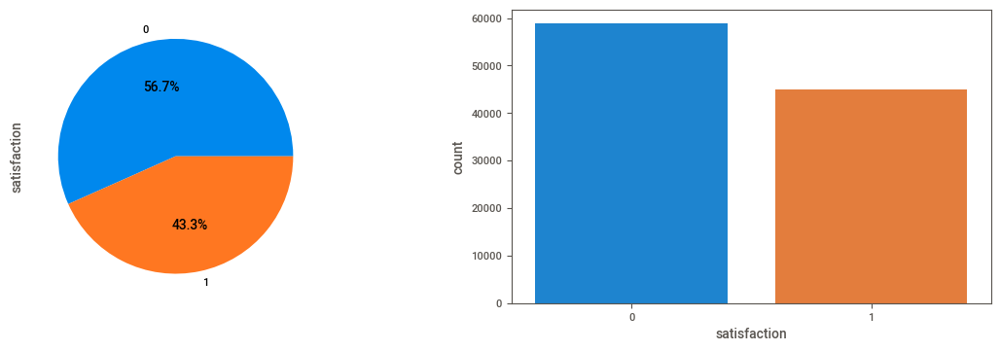

In [89]:
plt.figure(figsize=(14,4))
plt.subplot(1,2,1)
df['satisfaction'].value_counts().plot.pie(autopct='%1.1f%%')
plt.subplot(1,2,2)
sns.countplot(df['satisfaction'])
df['satisfaction'].value_counts()

0    52727
1    51177
Name: Gender, dtype: int64

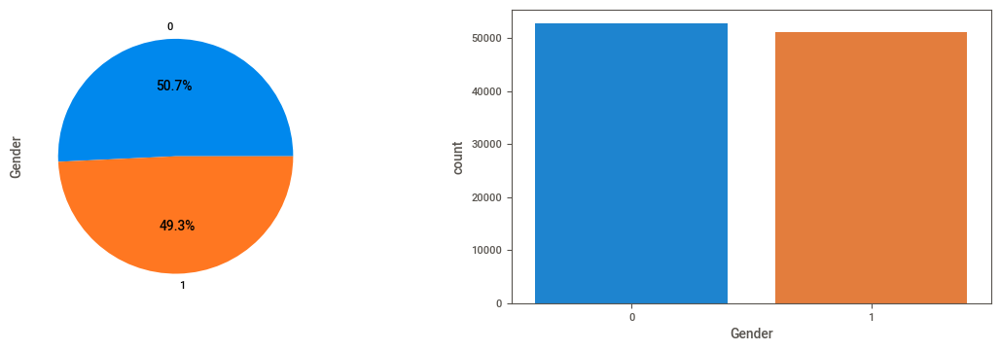

In [90]:
plt.figure(figsize=(14,4))
plt.subplot(1,2,1)
df['Gender'].value_counts().plot.pie(autopct='%1.1f%%')
plt.subplot(1,2,2)
sns.countplot(df['Gender'])
df['Gender'].value_counts()

0    84923
1    18981
Name: Customer_Type, dtype: int64

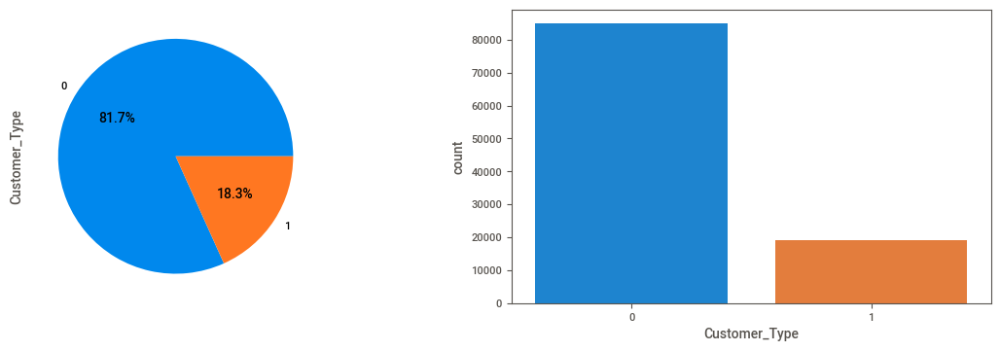

In [91]:
plt.figure(figsize=(14,4))
plt.subplot(1,2,1)
df['Customer_Type'].value_counts().plot.pie(autopct='%1.1f%%')
plt.subplot(1,2,2)
sns.countplot(df['Customer_Type'])
df['Customer_Type'].value_counts()

39    2969
25    2798
40    2574
44    2482
42    2457
      ... 
74      47
76      45
79      42
78      33
85      17
Name: Age, Length: 75, dtype: int64

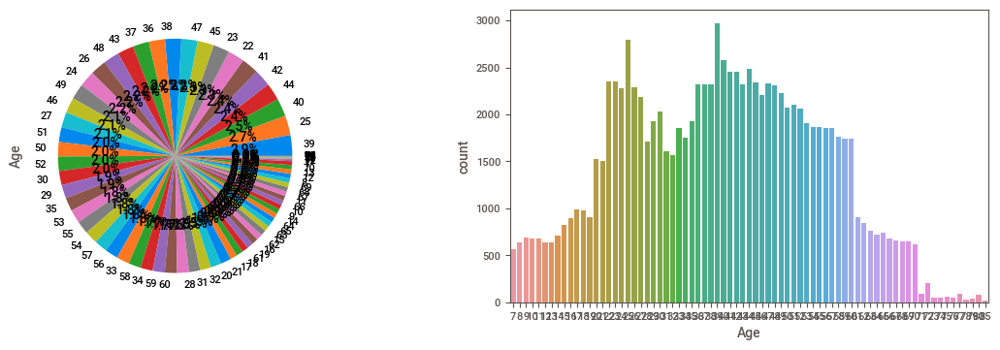

In [92]:
plt.figure(figsize=(14,4))
plt.subplot(1,2,1)
df['Age'].value_counts().plot.pie(autopct='%1.1f%%')
plt.subplot(1,2,2)
sns.countplot(df['Age'])
df['Age'].value_counts()

0    71655
1    32249
Name: Type_of_Travel, dtype: int64

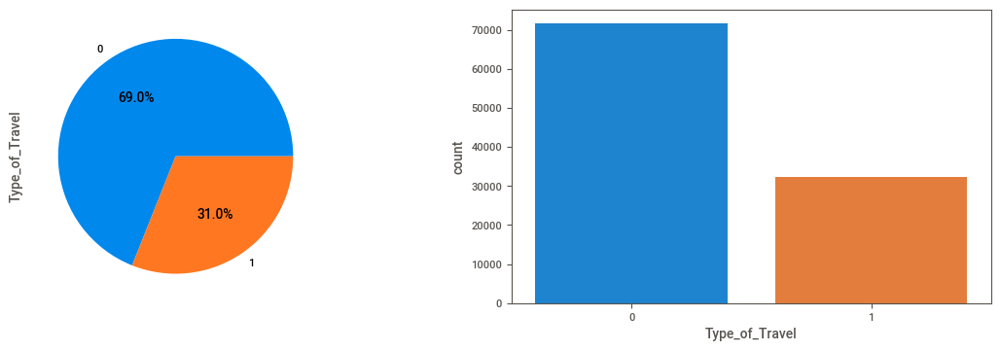

In [93]:
plt.figure(figsize=(14,4))
plt.subplot(1,2,1)
df['Type_of_Travel'].value_counts().plot.pie(autopct='%1.1f%%')
plt.subplot(1,2,2)
sns.countplot(df['Type_of_Travel'])
df['Type_of_Travel'].value_counts()

337     660
594     395
404     392
862     369
2475    369
       ... 
656       1
1364      1
887       1
1206      1
400       1
Name: Flight_Distance, Length: 3802, dtype: int64

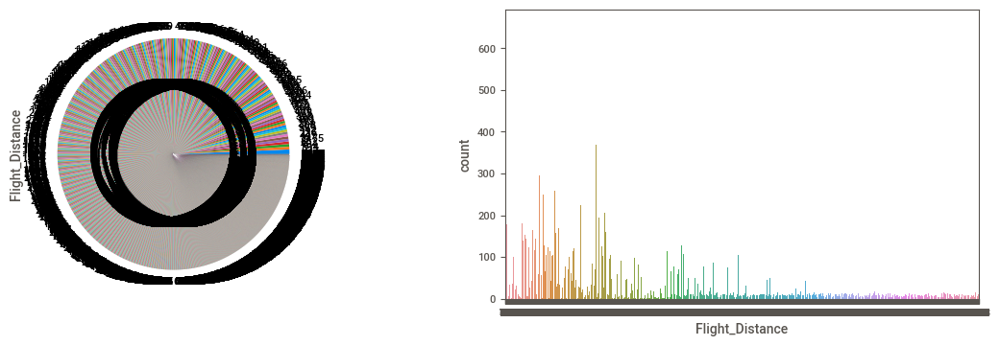

In [94]:
plt.figure(figsize=(14,4))
plt.subplot(1,2,1)
df['Flight_Distance'].value_counts().plot.pie(autopct='%1.1f%%')
plt.subplot(1,2,2)
sns.countplot(df['Flight_Distance'])
df['Flight_Distance'].value_counts()

0    49665
1    46745
2     7494
Name: Class, dtype: int64

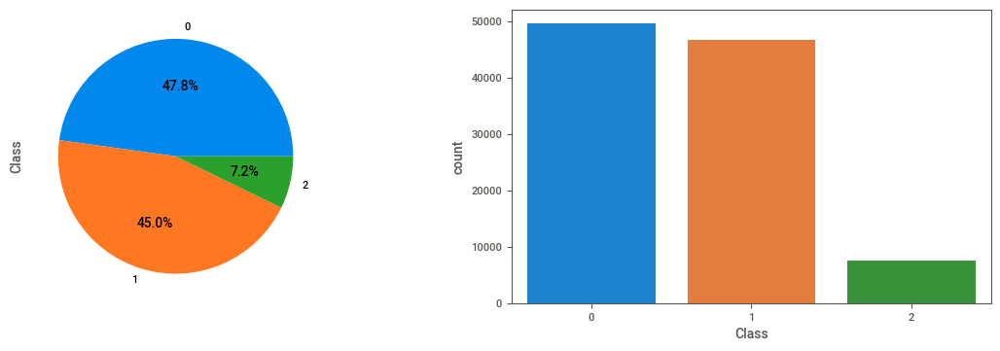

In [95]:
plt.figure(figsize=(14,4))
plt.subplot(1,2,1)
df['Class'].value_counts().plot.pie(autopct='%1.1f%%')
plt.subplot(1,2,2)
sns.countplot(df['Class'])
df['Class'].value_counts()

0    58879
1    45025
Name: satisfaction, dtype: int64

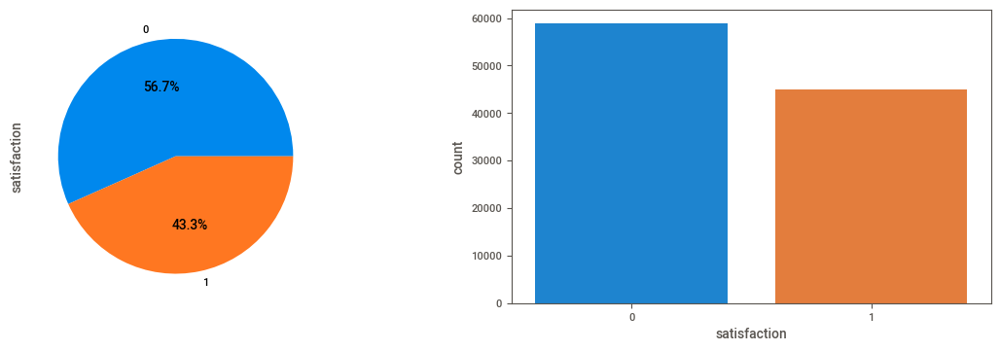

In [96]:
plt.figure(figsize=(14,4))
plt.subplot(1,2,1)
df['satisfaction'].value_counts().plot.pie(autopct='%1.1f%%')
plt.subplot(1,2,2)
sns.countplot(df['satisfaction'])
df['satisfaction'].value_counts()

<Figure size 1400x400 with 0 Axes>

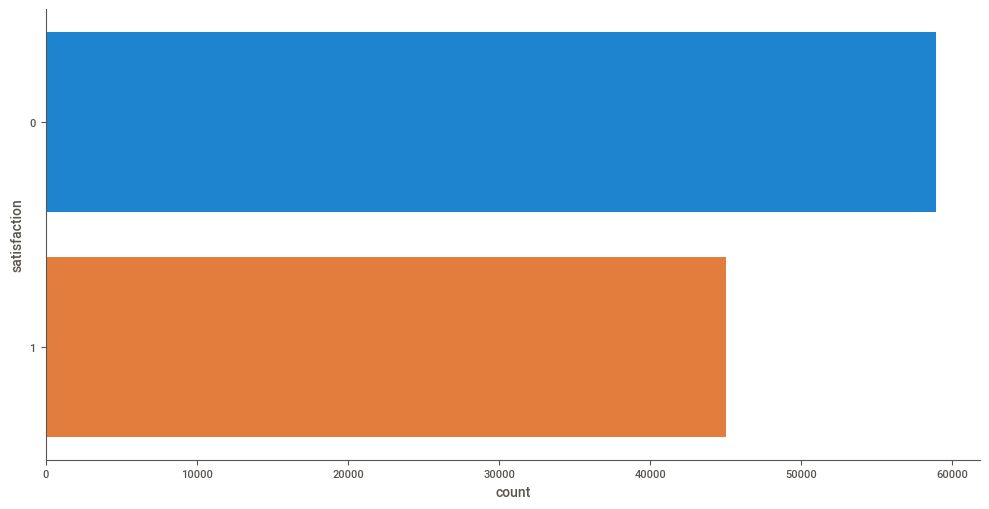

In [102]:
plt.figure(figsize=(14,4))
sns.catplot(y='satisfaction', kind='count', aspect=2, data=df)